### **ESTIMASI HARGA RUMAH DENGAN REGRESI DAN TEKNIK MACHINE LEARNING**

[Sumber data California Housing Price](https://drive.google.com/file/d/1Wa9hAlOmjJp0xvrN9AF3JWqR5xnDR-d2/view?usp=sharing)

### **Contents**

1. Business Problem Understanding
2. Data Preparation
3. Exploratory Data Analysis
4. Modeling (Experiments)
5. Conclusion & Recommendation

****

# A. BUSINESS PROBLEM STATEMENT

**Context**

Dataset yang digunakan berisi informasi dari sensus California tahun 1990. Meskipun data ini mungkin tidak membantu dalam memprediksi harga perumahan saat ini, dataset ini memberikan pengantar yang sangat baik untuk mengajarkan dasar-dasar pembelajaran mesin (machine learning). Data ini mencakup berbagai fitur seperti koordinat geografis (longitude dan latitude), karakteristik rumah (usia median perumahan, jumlah kamar), informasi demografis (populasi, rumah tangga, pendapatan median), dan nilai rumah median.

Pasar perumahan di California selalu dinamis dengan variasi signifikan di berbagai wilayah, mulai dari daerah pantai hingga komunitas pedalaman. Hal ini menyebabkan pembeli rumah, penjual, agen real estate, dan investor mengalami kesulitan dalam menentukan nilai pasar yang wajar tanpa alat analisis canggih. Mirip dengan tantangan yang dihadapi oleh tuan rumah Airbnb dalam menentukan harga sewa optimal, pemangku kepentingan real estate di California membutuhkan alat yang dapat diandalkan untuk memahami valuasi perumahan.

Berdasarkan data California Housing yang tersedia, kita memiliki kesempatan untuk menganalisis faktor-faktor yang mempengaruhi harga perumahan di California dan mengembangkan model prediktif yang dapat memberikan wawasan berharga bagi berbagai pemangku kepentingan di pasar perumahan.

**Problem Statement**

Salah satu tantangan terbesar dalam industri real estate adalah memprediksi harga rumah secara akurat berdasarkan berbagai fitur untuk menciptakan model yang menguntungkan secara finansial bagi semua pemangku kepentingan - penjual, pembeli, dan agen real estate. Tantangan ini sangat akut di pasar beragam seperti California, di mana harga perumahan dapat bervariasi secara dramatis berdasarkan lokasi, karakteristik properti, dan faktor demografis.

Mengingat dataset menyediakan berbagai fitur tentang properti (seperti koordinat lokasi, usia perumahan, jumlah kamar, statistik populasi, dan kedekatan dengan laut), mengembangkan model prediksi yang akurat sangat penting namun kompleks. Profesional real estate dan calon pembeli rumah memiliki panduan terbatas tentang bagaimana berbagai faktor ini berkombinasi untuk mempengaruhi nilai properti.

Dengan bertambahnya jumlah variabel yang mempengaruhi harga perumahan, menentukan valuasi yang akurat di pasar real estate California yang kompetitif sangatlah penting. Tanpa alat prediksi yang handal, penjual mungkin menetapkan harga terlalu tinggi sehingga properti sulit terjual, atau terlalu rendah sehingga kehilangan potensi keuntungan. Sementara itu, pembeli mungkin mengalami kesulitan dalam menilai apakah harga yang diminta sudah wajar berdasarkan karakteristik properti dan lokasi.

**Analytic Approach**

Pendekatan analitik yang akan kita gunakan adalah menganalisis data untuk dapat menemukan pola dari fitur-fitur yang ada, yang membedakan satu properti dengan yang lainnya. Dalam tahap awal, kita akan melakukan eksplorasi data untuk memahami distribusi setiap fitur, mengidentifikasi outlier, dan memeriksa korelasi antar variabel. Selanjutnya kita akan melakukan preprocessing data dengan membersihkan nilai yang hilang, menangani outlier, dan melakukan transformasi fitur jika diperlukan, termasuk normalisasi fitur numerik dan encoding fitur kategorikal seperti 'ocean_proximity'.

Tahap feature engineering akan fokus pada penciptaan fitur baru yang memiliki kekuatan prediktif lebih baik, seperti rasio kamar per rumah tangga, rasio populasi per rumah tangga, dan indikator daerah berdasarkan koordinat geografis. Kemudian kita akan melakukan seleksi fitur untuk mengidentifikasi faktor-faktor yang memiliki pengaruh paling signifikan terhadap harga rumah.

Pada tahap pemodelan, kita akan membangun dan membandingkan beberapa model regresi. Model-model akan dievaluasi dan dibandingkan performanya, kemudian model terbaik akan dioptimalkan melalui proses fine-tuning. Pendekatan ini akan menghasilkan model prediksi harga rumah yang dapat memberikan insight berharga bagi semua pemangku kepentingan di pasar perumahan California.

**Metric Evaluation**

Evaluasi metrik yang akan digunakan adalah RMSE, MAE, dan MAPE, di mana masing-masing memberikan perspektif yang berbeda tentang akurasi model. RMSE memberikan bobot lebih pada error besar sehingga berguna untuk mendeteksi outlier dalam prediksi, sedangkan MAE lebih mudah diinterpretasi karena berada dalam skala yang sama dengan variabel target. MAPE sangat berguna untuk memahami error relatif terhadap nilai aktual, yang membantu kita memahami seberapa besar kesalahan prediksi dibandingkan dengan nilai rumah sebenarnya.

Selain metrik error, kita juga akan menggunakan nilai R-squared atau Adjusted R-squared untuk model linear, yang menunjukkan seberapa baik model dapat merepresentasikan varians keseluruhan data. Nilai ini membantu kita memahami seberapa banyak variasi dalam harga rumah yang dapat dijelaskan oleh fitur-fitur dalam model kita. Semakin mendekati 1, maka semakin fit pula modelnya terhadap data observasi, meskipun perlu diingat bahwa metrik ini tidak valid untuk model non-linear.

# B. DATA PREPARATION

Dalam proses analisis data, persiapan data (data preparation) sering kali perlu didahulukan dibandingkan dengan exploratory data analysis (EDA) karena pemahaman yang mendalam terhadap data membutuhkan fitur-fitur turunan yang tidak tersedia pada dataset awal. Seperti yang terlihat pada contoh dataset perumahan California, pembuatan kolom-kolom baru seperti room_per_household, population_per_household, dan bedrooms_ratio memberikan perspektif baru yang tidak langsung terlihat dari data mentah. Dengan mengolah data mentah menjadi metrik yang lebih bermakna, analis dapat mengungkap pola dan hubungan yang tersembunyi, sehingga menghasilkan wawasan yang lebih komprehensif dan model prediksi yang lebih akurat.

## 1. Import Libraries

In [1]:
# Data Manipulation
import pandas as pd
import numpy as np

# Statistics
from scipy import stats
from scipy.stats import uniform, randint

# Visualization & Map
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec

# Preprocessing and Model Selection
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, RobustScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.utils import resample

# Modeling
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, IsolationForest
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
# from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

# Model Evaluation
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, make_scorer
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold

pd.set_option('display.max_columns', None)

**PENJELASAN**

Pada bagian ini, kita melakukan import library-library yang diperlukan untuk analisis data dan pembuatan model machine learning. Library-library ini dikelompokkan berdasarkan fungsinya:

**1. Data Manipulation**

Library pandas dan numpy digunakan untuk manipulasi dan pengolahan data. Pandas menyediakan struktur data yang efisien seperti DataFrame, sedangkan NumPy digunakan untuk operasi numerik dan array.

**2. Statistics**

Mengimpor modul scipy.stats yang menyediakan berbagai fungsi statistik. Khususnya, kita mengimpor fungsi untuk distribusi uniform dan random integer (randint) yang akan digunakan untuk sampling dan simulasi.

**3. Visualization & Map**

Mengimpor library untuk visualisasi data:
- matplotlib.pyplot: Library dasar untuk plotting di Python
- seaborn: Library untuk visualisasi statistik yang lebih estetis
- folium: Library untuk membuat peta interaktif
- MarkerCluster: Untuk mengelompokkan marker pada peta
- ListedColormap dan LinearSegmentedColormap: Untuk kustomisasi warna pada visualisasi
- GridSpec: Untuk mengatur tata letak subplot yang kompleks

**4. Preprocessing and Model Selection**

Library preprocessing yang akan digunakan untuk persiapan data sebelum pemodelan:
- train_test_split, cross_val_score, StratifiedKFold: Untuk pembagian data dan validasi model
- StandardScaler, OneHotEncoder, RobustScaler: Untuk standardisasi dan encoding fitur
- SimpleImputer: Untuk menangani missing values
- Pipeline dan ColumnTransformer: Untuk membuat alur preprocessing yang konsisten
- resample: Untuk mengatasi ketidakseimbangan kelas

**5. Modeling**

Berbagai algoritma machine learning yang akan digunakan:
- LinearRegression, Lasso, Ridge, ElasticNet: Model regresi linear dengan berbagai regularisasi
- RandomForestRegressor, GradientBoostingRegressor, IsolationForest: Model ensemble berbasis pohon
- DecisionTreeRegressor: Model pohon keputusan
- KNeighborsRegressor: Model berbasis tetangga terdekat
- SVR, MLPRegressor: Support Vector Machine dan Neural Network untuk regresi
- XGBRegressor, LGBMRegressor: Algoritma gradient boosting yang efisien

**6. Model Evaluation**

Metrik dan utilitas untuk evaluasi model:
- mean_absolute_error, mean_squared_error, r2_score: Metrik evaluasi untuk model regresi
- make_scorer: Untuk membuat fungsi scoring kustom
- GridSearchCV, RandomizedSearchCV, KFold: Untuk tuning hyperparameter dan validasi silang

Pengaturan tambahan seperti pd.set_option('display.max_columns', None) digunakan untuk menampilkan semua kolom DataFrame saat melakukan eksplorasi data.

## 2. Import Dataset California House

In [2]:
df = pd.read_csv("data_california_house.csv")
df_copy = df.copy()
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14448 entries, 0 to 14447
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           14448 non-null  float64
 1   latitude            14448 non-null  float64
 2   housing_median_age  14448 non-null  float64
 3   total_rooms         14448 non-null  float64
 4   total_bedrooms      14311 non-null  float64
 5   population          14448 non-null  float64
 6   households          14448 non-null  float64
 7   median_income       14448 non-null  float64
 8   ocean_proximity     14448 non-null  object 
 9   median_house_value  14448 non-null  float64
dtypes: float64(9), object(1)
memory usage: 1.1+ MB


**EXPLORASI DATASET**

Pada tahap ini, kita menggunakan fungsi `df.info()` untuk mendapatkan gambaran umum tentang dataset yang akan dianalisis. Hasil output di atas memberikan informasi penting sebagai berikut:

- Dataset terdiri dari **14.448 entri (baris)** dengan indeks dari 0 hingga 14.447
- Terdapat **10 kolom** yang menyimpan berbagai informasi properti atau perumahan
- Kolom-kolom utama meliputi:
  - **longitude dan latitude**: Koordinat geografis lokasi properti (tipe data float64)
  - **housing_median_age**: Usia median rumah di area tersebut (float64)
  - **total_rooms dan total_bedrooms**: Jumlah total ruangan dan kamar tidur (float64)
  - **population**: Jumlah populasi di area tersebut (float64)
  - **households**: Jumlah rumah tangga di area tersebut (float64)
  - **median_income**: Pendapatan median di area tersebut (float64)
  - **ocean_proximity**: Kedekatan dengan lautan (tipe data object/kategorikal)
  - **median_house_value**: Nilai median rumah di area tersebut (float64), yang kemungkinan akan menjadi target prediksi

Penting untuk dicatat:
- Hampir semua kolom memiliki 14.448 data non-null, kecuali **total_bedrooms** yang memiliki 14.311 data non-null, menunjukkan adanya 137 nilai yang hilang pada kolom tersebut
- Total penggunaan memori untuk dataset ini relatif kecil, yaitu sekitar 1.1 MB

Informasi ini sangat berguna untuk memahami struktur dataset dan langkah preprocessing yang mungkin diperlukan, seperti penanganan nilai yang hilang pada kolom total_bedrooms.

## 3. Feature Description

- Dataset merupakan data sensus perumahan California.
- Setiap baris data merepresentasikan informasi terkait karakteristik perumahan di suatu distrik.

**Variabels Information**

| **Variabel** | **Data Type** | **Description** |
| --- | --- | --- |
| longtitude | float | Koordinat bujur |
| latitude | float | Koordinat lintang |
| housing_median_age | float | Usia median perumahan |
| total_rooms | float | Jumlah total kamar |
| total_bedrooms | float | Jumlah total kamar tidur |
| population | float | Jumlah populasi |
| households | float | Jumlah rumah tangga |
| median_income | float | Pendapatan median |
| ocean_proximity | String | Kedekatan dengan laut |
| median_house_value | float | Nilai (harga) median rumah |

<br>

**Ocean Proximity Explanation :**

- `ISLAND` : ini menunjukkan bahwa rumah terletak di sebuah pulau
- `<1H OCEAN` : ini menunjukkan bahwa rumah berjarak kurang dari satu jam dari laut
- `NEAR OCEAN` : blok tersebut dekat dengan laut dibandingkan dengan <1H OCEAN
- `NEAR BAY` : blok tersebut dekat dengan teluk, yang merupakan badan air yang terhubung ke laut atau danau
- `INLAND` : ini berarti rumah tidak dekat dengan pantai; rumah terletak di tengah-tengah pulau; atau di perkotaan

## 4. Chehcking Missing Values

In [4]:
# Detecting missing value
df.isnull().sum()

,0
longitude,0
latitude,0
housing_median_age,0
total_rooms,0
total_bedrooms,137
population,0
households,0
median_income,0
ocean_proximity,0
median_house_value,0


Berdasarkan tabel di atas dapat dikeathu bahwasannya jumlah missing values hanya terdapat pada kolom total_bedrooms sejumlah 137 (0.9%)

### Handling Missing Values

In [5]:
# Handling Missing Values
df = df.dropna()

Saya berikan penanganan dengan cara `dropna()` dikarenakan hanya <1% untuk missing values yang ada pada kolom total_bedrooms

## 5. Checking Duplicate Data

In [6]:
df.duplicated().sum()

np.int64(0)

## 6. Feature Engineering

**FEATURE ENGINEERING**

Feature Engineering dilakukan untuk menambahkan kolom baru yang dapat memberikan insight lebih banyak dari data yang tersedia. Proses ini sangat penting untuk meningkatkan performa model machine learning dengan menciptakan fitur-fitur yang lebih informatif dan relevan.

1. Pembuatan Fitur Rasio

Pada langkah pertama, kita membuat beberapa fitur rasio yang menggambarkan hubungan antara variabel-variabel yang ada:

- **room_per_household**: Menunjukkan rata-rata jumlah ruangan per rumah tangga di suatu area. Dihitung dengan membagi `total_rooms` dengan `households`.
  
- **population_per_household**: Menggambarkan tingkat kepadatan hunian, yaitu rata-rata jumlah orang yang tinggal dalam satu rumah tangga. Dihitung dengan membagi `population` dengan `households`.
  
- **bedrooms_ratio**: Rasio antara jumlah kamar tidur dengan total ruangan. Ini memberikan gambaran tentang proporsi ruangan yang digunakan sebagai kamar tidur dalam properti di area tersebut.
  
- **income_household**: Pendapatan rata-rata per rumah tangga, dihitung dengan membagi `median_income` dengan `households`.
  
- **income_to_rooms_ratio**: Menunjukkan hubungan antara pendapatan dan jumlah ruangan, dapat mengindikasikan kemampuan ekonomi relatif terhadap ukuran properti.
  
- **income_to_population_ratio**: Pendapatan per kapita, memberikan gambaran tentang distribusi pendapatan di antara populasi.

2. Kategorisasi Fitur (Binning)

Selanjutnya, kita melakukan binning (pengelompokan nilai kontinu menjadi kategori diskrit) untuk beberapa fitur penting:

- **income_level**: Mengkategorikan pendapatan median menjadi 5 kelompok:
  - 1: Sangat rendah (0-2)
  - 2: Rendah (2-4)
  - 3: Menengah (4-6)
  - 4: Tinggi (6-8)
  - 5: Sangat tinggi (>8)
  
- **housing_age_category**: Mengkategorikan usia median rumah menjadi 5 kelompok:
  - 1: Sangat baru (0-10 tahun)
  - 2: Baru (10-20 tahun)
  - 3: Menengah (20-30 tahun)
  - 4: Tua (30-40 tahun)
  - 5: Sangat tua (>40 tahun)
  
- **room_size_category**: Mengkategorikan jumlah ruangan per rumah tangga menjadi 5 kelompok:
  - 1: Sangat kecil (0-3 ruangan)
  - 2: Kecil (3-5 ruangan)
  - 3: Menengah (5-7 ruangan)
  - 4: Besar (7-9 ruangan)
  - 5: Sangat besar (>9 ruangan)
  
- **pop_density_category**: Mengkategorikan kepadatan populasi per rumah tangga menjadi 5 kelompok:
  - 1: Sangat rendah (0-2 orang)
  - 2: Rendah (2-3 orang)
  - 3: Menengah (3-4 orang)
  - 4: Tinggi (4-5 orang)
  - 5: Sangat tinggi (>5 orang)

Selain itu, berdasarkan file yang diupload, kita juga telah melakukan pengelompokan data berdasarkan county di California. Ini menambahkan konteks geografis yang penting dan memungkinkan kita untuk menganalisis perbedaan harga rumah dan karakteristik lainnya di berbagai wilayah.

Fitur-fitur baru ini akan membantu model kita menangkap pola-pola yang lebih kompleks dalam data, yang mungkin tidak terlihat hanya dari fitur-fitur asli.

In [7]:
df['room_per_household'] = df['total_rooms'] / df['households']
df['population_per_household'] = df['population'] / df['households']
df["bedrooms_ratio"] = df["total_bedrooms"] / df["total_rooms"]
df["income_household"] = df["median_income"] / df["households"]
df['income_to_rooms_ratio'] = df['median_income'] / df['total_rooms']
df['income_to_population_ratio'] = df['median_income'] / df['population']

<ipython-input-7-54946913894c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['room_per_household'] = df['total_rooms'] / df['households']
<ipython-input-7-54946913894c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['population_per_household'] = df['population'] / df['households']
<ipython-input-7-54946913894c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation

In [8]:
# Mendefinisikan koordinat pusat untuk setiap county di California
california_counties = {
    'Alameda': (-122.0865, 37.6017),
    'Alpine': (-119.8276, 38.5948),
    'Amador': (-120.6501, 38.4483),
    'Butte': (-121.6020, 39.6254),
    'Calaveras': (-120.5522, 38.1957),
    'Colusa': (-122.2372, 39.1777),
    'Contra Costa': (-121.9018, 37.8534),
    'Del Norte': (-124.0046, 41.7076),
    'El Dorado': (-120.5277, 38.7819),
    'Fresno': (-119.6512, 36.7478),
    'Glenn': (-122.4039, 39.5989),
    'Humboldt': (-123.9861, 40.7450),
    'Imperial': (-115.5682, 33.0408),
    'Inyo': (-117.3800, 36.5624),
    'Kern': (-118.9721, 35.3426),
    'Kings': (-119.8156, 36.0741),
    'Lake': (-122.7540, 39.0968),
    'Lassen': (-120.5737, 40.6739),
    'Los Angeles': (-118.2437, 34.0522),
    'Madera': (-119.7668, 37.2128),
    'Marin': (-122.7633, 38.0834),
    'Mariposa': (-119.9675, 37.7855),
    'Mendocino': (-123.4389, 39.4399),
    'Merced': (-120.7201, 37.1305),
    'Modoc': (-120.7198, 41.5886),
    'Mono': (-118.8677, 37.9375),
    'Monterey': (-121.7543, 36.2398),
    'Napa': (-122.3321, 38.5025),
    'Nevada': (-120.7705, 39.2999),
    'Orange': (-117.8311, 33.7175),
    'Placer': (-120.7280, 39.0616),
    'Plumas': (-120.8390, 40.0039),
    'Riverside': (-116.0765, 33.7478),
    'Sacramento': (-121.3542, 38.4747),
    'San Benito': (-121.0819, 36.6097),
    'San Bernardino': (-116.1789, 34.8414),
    'San Diego': (-117.1611, 32.7157),
    'San Francisco': (-122.4194, 37.7749),
    'San Joaquin': (-121.2722, 37.9350),
    'San Luis Obispo': (-120.4579, 35.3102),
    'San Mateo': (-122.3637, 37.5630),
    'Santa Barbara': (-119.6982, 34.4221),
    'Santa Clara': (-121.9552, 37.3541),
    'Santa Cruz': (-122.0308, 37.0454),
    'Shasta': (-122.1684, 40.7909),
    'Sierra': (-120.5221, 39.5768),
    'Siskiyou': (-122.8412, 41.5520),
    'Solano': (-121.9018, 38.3105),
    'Sonoma': (-122.9888, 38.5780),
    'Stanislaus': (-120.9970, 37.5569),
    'Sutter': (-121.7010, 39.0240),
    'Tehama': (-122.2361, 40.1245),
    'Trinity': (-123.1141, 40.6542),
    'Tulare': (-118.8082, 36.2312),
    'Tuolumne': (-120.1664, 37.9651),
    'Ventura': (-119.0910, 34.3705),
    'Yolo': (-121.9018, 38.7646),
    'Yuba': (-121.3477, 39.2638)
}

# Fungsi untuk menentukan county berdasarkan jarak Euclidean terdekat
def find_nearest_county(longitude, latitude):
    min_distance = float('inf')
    nearest_county = None

    for county, coords in california_counties.items():
        county_long, county_lat = coords
        # Menghitung jarak Euclidean
        distance = np.sqrt((longitude - county_long)**2 + (latitude - county_lat)**2)

        if distance < min_distance:
            min_distance = distance
            nearest_county = county

    return nearest_county

# Menerapkan fungsi ke seluruh dataset
print("Menerapkan pengelompokan berdasarkan jarak terdekat...")
county_assignments = []

for idx, row in df.iterrows():
    county = find_nearest_county(row['longitude'], row['latitude'])
    county_assignments.append(county)

    # Menampilkan progress setiap 1000 baris
    if idx % 1000 == 0:
        print(f"  Kemajuan: {idx}/{len(df)} baris diproses")

# Menambahkan hasil ke dataframe
df['county'] = county_assignments

print("Pengelompokan selesai!")

# Melihat distribusi county
county_counts = df['county'].value_counts()
print("\nDistribusi jumlah data per county:")
print(county_counts)

# Menampilkan statistik harga rumah per county
county_house_values = df.groupby('county')['median_house_value'].agg(['mean', 'median', 'min', 'max', 'count'])
county_house_values = county_house_values.sort_values('median', ascending=False)
print("\nStatistik harga rumah per county (diurutkan berdasarkan median):")
print(county_house_values)

# Visualisasi: Scatter plot lokasi dengan warna berdasarkan county
plt.figure(figsize=(15, 10))

# Membuat color map dengan warna yang cukup untuk semua county
num_counties = len(california_counties)
colors = plt.cm.tab20.colors + plt.cm.tab20b.colors + plt.cm.tab20c.colors
cmap = ListedColormap(colors[:num_counties])

# Membuat dictionary county ke integer untuk pewarnaan
county_to_int = {county: i for i, county in enumerate(sorted(california_counties.keys()))}
county_colors = df['county'].map(county_to_int)

# Membuat scatter plot
scatter = plt.scatter(df['longitude'], df['latitude'], c=county_colors, cmap=cmap,
                     alpha=0.6, s=5, edgecolor='none')

# Menambahkan titik pusat county
for county, (long, lat) in california_counties.items():
    plt.plot(long, lat, 'o', markersize=8, color='red')
    plt.text(long, lat, county, fontsize=8, ha='center', va='bottom')

plt.title('Pengelompokan Data Perumahan California berdasarkan County', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.grid(True, alpha=0.3)

# Menyimpan plot sebagai file
plt.close()

# Visualisasi: Box plot nilai rumah per county (10 county teratas berdasarkan jumlah data)
plt.figure(figsize=(15, 8))
top_counties = county_counts.head(10).index
df_top_counties = df[df['county'].isin(top_counties)]

sns.boxplot(x='county', y='median_house_value', data=df_top_counties)
plt.title('Distribusi Harga Rumah di 10 County Teratas (Berdasarkan Jumlah Data)', fontsize=16)
plt.xlabel('County', fontsize=12)
plt.ylabel('Median House Value ($)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.close()

# Visualisasi: Hubungan antara median_income dan median_house_value per county
plt.figure(figsize=(15, 8))
for county in top_counties:
    county_data = df[df['county'] == county]
    plt.scatter(county_data['median_income'], county_data['median_house_value'],
               alpha=0.6, label=county)

plt.title('Hubungan Pendapatan dan Harga Rumah per County', fontsize=16)
plt.xlabel('Median Income (dalam $10,000)', fontsize=12)
plt.ylabel('Median House Value ($)', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.close()

# Analisis tambahan: Statistik deskriptif untuk fitur numerik berdasarkan county
print("\nStatistik deskriptif per county:")
for county in top_counties:
    county_data = df[df['county'] == county]
    print(f"\n===== County: {county} ({len(county_data)} data) =====")
    print(county_data[['housing_median_age', 'median_income', 'median_house_value']].describe())

# Encoding ordinal untuk ocean_proximity (dari terdekat ke terjauh dari laut)
proximity_mapping = {
    'ISLAND': 1,      # Terdekat dengan laut
    'NEAR OCEAN': 2,
    '<1H OCEAN': 3,
    'NEAR BAY': 4,
    'INLAND': 5       # Terjauh dari laut
}

# Menerapkan mapping
df['proximity_ordinal'] = df['ocean_proximity'].map(proximity_mapping)

# Menampilkan ringkasan
print("\nRingkasan Data:")
print(f"Jumlah data: {len(df)}")
print(f"Jumlah county: {len(df['county'].unique())}")
print(f"Fitur yang tersedia: {', '.join(df.columns)}")

Menerapkan pengelompokan berdasarkan jarak terdekat...
  Kemajuan: 0/14311 baris diproses
  Kemajuan: 1000/14311 baris diproses
  Kemajuan: 2000/14311 baris diproses
  Kemajuan: 3000/14311 baris diproses
  Kemajuan: 4000/14311 baris diproses
  Kemajuan: 5000/14311 baris diproses
  Kemajuan: 6000/14311 baris diproses
  Kemajuan: 7000/14311 baris diproses
  Kemajuan: 8000/14311 baris diproses
  Kemajuan: 9000/14311 baris diproses
  Kemajuan: 10000/14311 baris diproses
  Kemajuan: 11000/14311 baris diproses
  Kemajuan: 12000/14311 baris diproses
  Kemajuan: 13000/14311 baris diproses
  Kemajuan: 14000/14311 baris diproses
Pengelompokan selesai!

Distribusi jumlah data per county:
county
Los Angeles        3819
Orange             2090
San Diego          1123
San Francisco       981
Santa Clara         648
Sacramento          527
Alameda             432
Fresno              354
Contra Costa        317
Ventura             294
San Joaquin         280
Kern                235
San Mateo          

### Binning and Feature Engineering

In [9]:
# 1. Binning median_income

# Membuat 5 kategori pendapatan
bins = [0, 2, 4, 6, 8, float('inf')]
labels = [1, 2, 3, 4, 5]  # 1 = sangat rendah, 2 = rendah, 3 = menengah, 4 = tinggi, 5 = sangat tinggi

# Membuat fitur income_level dengan 5 kategori
df['income_level'] = pd.cut(df['median_income'], bins=bins, labels=labels, right=False)
df['income_level'] = df['income_level'].astype(int)



# 2. Binning housing_median_age

# Membuat kategori usia rumah
age_bins = [0, 10, 20, 30, 40, float('inf')]
age_labels = [1, 2, 3, 4, 5]  # 1 = sangat baru, 5 = sangat tua
df['housing_age_category'] = pd.cut(df['housing_median_age'], bins=age_bins, labels=age_labels, right=False)
df['housing_age_category'] = df['housing_age_category'].astype(int)



# 3. Binning rooms_per_household

# Membuat kategori untuk jumlah kamar per rumah tangga
rooms_bins = [0, 3, 5, 7, 9, float('inf')]
rooms_labels = [1, 2, 3, 4, 5]  # 1 = sangat kecil, 5 = sangat besar
df['room_size_category'] = pd.cut(df['room_per_household'], bins=rooms_bins, labels=rooms_labels, right=False)
df['room_size_category'] = df['room_size_category'].astype(int)



# 4. Binning population_per_households

# Membuat kategori kepadatan
density_bins = [0, 2, 3, 4, 5, float('inf')]
density_labels = [1, 2, 3, 4, 5]  # 1 = sangat rendah, 5 = sangat tinggi
df['pop_density_category'] = pd.cut(df['population_per_household'], bins=density_bins, labels=density_labels, right=False)
df['pop_density_category'] = df['pop_density_category'].astype(int)

## New Data Changes

In [10]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,room_per_household,population_per_household,bedrooms_ratio,income_household,income_to_rooms_ratio,income_to_population_ratio,county,proximity_ordinal,income_level,housing_age_category,room_size_category,pop_density_category
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0,2.800000,4.825000,0.250000,0.049375,0.017634,0.010233,Fresno,5,1,5,1,4
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0,3.671480,3.018051,0.322517,0.008160,0.002223,0.002704,Alameda,4,2,5,2,3
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0,6.478022,3.810440,0.167939,0.017305,0.002671,0.004541,Orange,3,4,2,3,3
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0,2.518000,3.051000,0.474980,0.001720,0.000683,0.000564,Los Angeles,3,1,2,1,3
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0,4.622754,3.628743,0.251295,0.013297,0.002876,0.003664,Fresno,5,2,5,2,3


In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
longitude,14311.0,-119.567150,2.006374,-124.350000,-121.800000,-118.490000,-118.000000,-114.310000
latitude,14311.0,35.631365,2.139589,32.540000,33.930000,34.260000,37.715000,41.950000
housing_median_age,14311.0,28.609671,12.606493,1.000000,18.000000,29.000000,37.000000,52.000000
total_rooms,14311.0,2640.917686,2197.192896,2.000000,1452.000000,2125.000000,3142.000000,32627.000000
total_bedrooms,14311.0,538.260709,423.577544,1.000000,295.000000,435.000000,647.000000,6445.000000
population,14311.0,1424.772273,1151.795857,3.000000,784.000000,1164.000000,1722.000000,35682.000000
households,14311.0,499.480470,383.826005,1.000000,279.000000,410.000000,603.500000,6082.000000
median_income,14311.0,3.866774,1.890866,0.499900,2.569400,3.540300,4.736100,15.000100
median_house_value,14311.0,206793.156942,115404.371629,14999.000000,119400.000000,180000.000000,263750.000000,500001.000000
room_per_household,14311.0,5.425520,2.294973,0.846154,4.453362,5.230769,6.047714,132.533333


### Analisis Statistik Deskriptif Dataset

Setelah melakukan feature engineering, kita perlu menganalisis statistik deskriptif dari dataset untuk memahami distribusi dan karakteristik data. Tabel di atas menampilkan rangkuman statistik untuk semua fitur numerik dalam dataset.

## Statistik Deskriptif Fitur Asli

### Lokasi Geografis
- **Longitude**: Berkisar dari -124.35 hingga -114.31, dengan rata-rata -119.57, menunjukkan lokasi di California bagian barat AS.
- **Latitude**: Berkisar dari 32.54 hingga 41.95, dengan rata-rata 35.63, menunjukkan sebaran dari California selatan hingga utara.

### Karakteristik Properti
- **housing_median_age**: Rata-rata usia rumah adalah 28.6 tahun, dengan rentang dari baru (1 tahun) hingga sangat tua (52 tahun).
- **total_rooms**: Rata-rata 2640.92 ruangan per block, dengan deviasi standar yang tinggi (2197.19), menunjukkan variasi besar dalam ukuran komunitas.
- **total_bedrooms**: Rata-rata 538.26 kamar tidur per block, dengan variasi yang signifikan (standar deviasi 423.58).
- **population**: Rata-rata 1424.77 orang per block, dengan rentang dari 3 hingga 35682 orang, menunjukkan blok dengan kepadatan sangat bervariasi.
- **households**: Rata-rata 499.48 rumah tangga per block, dengan variasi tinggi (standar deviasi 383.83).

### Ekonomi dan Nilai Properti
- **median_income**: Rata-rata pendapatan median adalah 3.87 (dalam unit $10,000), atau sekitar $38,700 per tahun, dengan rentang dari $4,999 hingga $150,010.
- **median_house_value**: Rata-rata nilai rumah adalah $206,793, dengan rentang dari $14,999 hingga $500,001. Perhatikan bahwa nilai maksimum mungkin merupakan nilai yang telah di-cap pada $500,001.

## Statistik Deskriptif Fitur Hasil Engineering

### Rasio dan Proporsi
- **room_per_household**: Rata-rata 5.43 ruangan per rumah tangga, dengan beberapa daerah memiliki hingga 132.53 ruangan per rumah tangga (mungkin apartemen atau kompleks perumahan mewah).
- **population_per_household**: Rata-rata 3.04 orang per rumah tangga, dengan rentang dari 0.75 hingga 599.71 (nilai ekstrem ini perlu diverifikasi).
- **bedrooms_ratio**: Rata-rata 21.29% dari total ruangan adalah kamar tidur, dengan rentang dari 10% hingga 100%.
- **income_household**: Nilai yang sangat kecil dengan rata-rata 0.016, mungkin perlu interpretasi yang berbeda atau transformasi skala.
- **income_to_rooms_ratio** dan **income_to_population_ratio**: Menunjukkan distribusi pendapatan relatif terhadap ruangan dan populasi.

### Fitur Kategorikal
- **proximity_ordinal**: Rata-rata 3.62, dengan kebanyakan properti dalam kategori "< 1H OCEAN" (kode 3).
- **income_level**: Rata-rata 2.43, menunjukkan kebanyakan area berada di kategori pendapatan rendah hingga menengah.
- **housing_age_category**: Rata-rata 3.34, menunjukkan mayoritas rumah berusia menengah ke tua.
- **room_size_category**: Rata-rata 2.67, menunjukkan ukuran properti cenderung kecil hingga menengah.
- **pop_density_category**: Rata-rata 2.41, menunjukkan kepadatan populasi rendah hingga menengah.

Penting untuk memperhatikan bahwa beberapa fitur memiliki nilai ekstrem yang mungkin perlu ditangani sebelum pemodelan, seperti nilai maksimum yang sangat tinggi pada `room_per_household` (132.53) dan `population_per_household` (599.71). Nilai-nilai ini mungkin merupakan outlier atau kesalahan data yang perlu diperiksa lebih lanjut.

In [12]:
# Features Description
feature_descriptions = []

# Loop through each column in the DataFrame
for column in df.columns:
    # Calculate the number of null values and their percentage
    null_count = df[column].isna().sum()
    null_percentage = round((null_count / len(df[column])) * 100, 2)

    # Get the number of unique values and a sample of unique values
    unique_count = df[column].nunique()
    unique_sample = list(df[column].drop_duplicates().sample(min(2, unique_count)).values)

    # Append the feature description to the list
    feature_descriptions.append([
        column,
        df[column].dtype,
        null_count,
        null_percentage,
        unique_count,
        unique_sample
    ])

# Create a DataFrame to summarize the features
features_summary = pd.DataFrame(
    feature_descriptions,
    columns=['Data Feature',
             'Data Type',
             'Null Count',
             'Null Percentage (%)',
             'Unique Count',
             'Unique Sample']
)
features_summary

,Data Feature,Data Type,Null Count,Null Percentage (%),Unique Count,Unique Sample
0,longitude,float64,0,0.0,806,"[-121.49, -118.93]"
1,latitude,float64,0,0.0,835,"[36.37, 39.42]"
2,housing_median_age,float64,0,0.0,52,"[44.0, 5.0]"
3,total_rooms,float64,0,0.0,5213,"[10093.0, 3173.0]"
4,total_bedrooms,float64,0,0.0,1748,"[1579.0, 526.0]"
5,population,float64,0,0.0,3491,"[181.0, 1677.0]"
6,households,float64,0,0.0,1646,"[324.0, 785.0]"
7,median_income,float64,0,0.0,9726,"[3.5076, 3.6359]"
8,ocean_proximity,object,0,0.0,5,"[NEAR BAY, ISLAND]"
9,median_house_value,float64,0,0.0,3540,"[125800.0, 114100.0]"


In [ ]:
df.to_csv('california_house_after_feature_engineering.csv', index=False)

Kemudian untuk dataset yang telah diberi perlakuan feature engineering dan data cleaning akan disimpan ke dalam bentuk CSV

# C. EXPLORATORY DATA ANALYSIS

Analisis Eksplorasi Data (Exploratory Data Analysis/EDA) merupakan tahap krusial dalam proses data science yang bertujuan untuk memahami karakteristik dan pola dalam dataset sebelum melakukan pemodelan. Pada bagian ini, kita akan melakukan serangkaian analisis untuk mengungkap wawasan berharga dari dataset perumahan California.


In [ ]:
# Melakukan import data
df = pd.read_csv('california_house_after_feature_engineering.csv')

## 1. Peta Distribusi Perumahan di California

In [ ]:
# 1. Membuat peta dengan ukuran yang lebih besar dan zoom yang lebih tepat
peta_perumahan = folium.Map(
    zoom_start=6,  # Zoom yang lebih tepat untuk California
    width=1200,    # Lebar yang lebih besar
    height=800     # Tinggi yang lebih besar
)

# Fungsi untuk mendapatkan warna berdasarkan nilai rumah
def get_color(harga):
    if harga < 100000:
        return 'green'
    elif harga < 200000:
        return 'blue'
    elif harga < 300000:
        return 'purple'
    elif harga < 400000:
        return 'orange'
    else:
        return 'red'

# Mengelompokkan data berdasarkan county untuk informasi agregat
county_info = df.groupby('county').agg({
    'median_house_value': 'mean',
    'median_income': 'mean',
    'housing_median_age': 'mean',
    'total_rooms': 'mean',
    'population': 'mean',
    'latitude': 'mean',  # Untuk menemukan pusat county
    'longitude': 'mean'  # Untuk menemukan pusat county
}).reset_index()

# Dictionary untuk menyimpan informasi county
county_dict = {}
for _, row in county_info.iterrows():
    county_dict[row['county']] = {
        'median_house_value': row['median_house_value'],
        'median_income': row['median_income'] * 10000,  # Mengkonversi ke dollar penuh
        'housing_median_age': row['housing_median_age'],
        'total_rooms': row['total_rooms'],
        'population': row['population'],
        'latitude': row['latitude'],
        'longitude': row['longitude'],
        'count': len(df[df['county'] == row['county']])
    }

# 2. Membuat layer untuk cluster county
county_layer = folium.FeatureGroup(name='County Clusters')

# Menambahkan marker untuk setiap county
for county, info in county_dict.items():
    # Hanya tampilkan county dengan minimal 5 data point (untuk menghindari outlier)
    if info['count'] >= 5:
        # Membuat tooltip dengan format yang lebih baik
        tooltip_text = f"""
            <div style="font-family: Arial; font-size: 12px; width: 200px;">
                <b>County:</b> {county}<br>
                <b>Nilai Rumah Median:</b> ${int(info['median_house_value']):,}<br>
                <b>Pendapatan Tahunan:</b> ${int(info['median_income']):,}<br>
                <b>Umur Median Perumahan:</b> {int(info['housing_median_age'])} tahun<br>
                <b>Jumlah Data:</b> {info['count']}
            </div>
        """

        # Membuat circle dengan ukuran berdasarkan jumlah data
        folium.CircleMarker(
            location=[info['latitude'], info['longitude']],
            radius=min(20, max(5, info['count'] / 100)),  # Ukuran lingkaran berdasarkan jumlah data
            color=get_color(info['median_house_value']),
            fill=True,
            fill_opacity=0.7,
            tooltip=folium.Tooltip(tooltip_text, sticky=True),  # sticky=True membuat tooltip tetap terlihat
            popup=folium.Popup(tooltip_text, max_width=300)
        ).add_to(county_layer)

        # Menambahkan label untuk county dengan data banyak
        if info['count'] > 100:
            folium.map.Marker(
                location=[info['latitude'], info['longitude']],
                icon=folium.DivIcon(
                    icon_size=(150, 36),
                    icon_anchor=(75, 18),
                    html=f'<div style="font-size: 12pt; font-weight: bold; text-align: center;">{county}<br>{info["count"]}</div>'
                )
            ).add_to(county_layer)

county_layer.add_to(peta_perumahan)

# 3. Membuat layer untuk data individu
data_layer = folium.FeatureGroup(name='Data Individu')

# Menggunakan MarkerCluster untuk mengelompokkan data individu
marker_cluster = MarkerCluster().add_to(data_layer)

# Menampilkan sampel data individu (untuk menghindari terlalu banyak marker)
sample_size = min(3000, len(df))
df_sample = df.sample(n=sample_size, random_state=42)

for _, row in df_sample.iterrows():
    # Menyiapkan informasi yang akan ditampilkan di tooltip dan popup
    info_popup = f"""
        <div style="font-family: Arial; font-size: 12px; width: 250px;">
            <b>County:</b> {row['county']}<br>
            <b>Ocean Proximity:</b> {row['ocean_proximity']}<br>
            <b>Umur Median Perumahan:</b> {row['housing_median_age']} tahun<br>
            <b>Total Kamar:</b> {int(row['total_rooms'])}<br>
            <b>Pendapatan Median Tahunan:</b> ${int(row['median_income'] * 10000):,}<br>
            <b>Nilai Rumah Median:</b> ${int(row['median_house_value']):,}<br>
            <b>Rasio Kamar per Rumah Tangga:</b> {row['room_per_household']:.2f}<br>
            <b>Populasi per Rumah Tangga:</b> {row['population_per_household']:.2f}<br>
        </div>
    """

    # Tooltip yang lebih sederhana untuk melihat dengan cepat
    tooltip_text = f"County: {row['county']} - Nilai: ${int(row['median_house_value']):,}"

    # Menambahkan marker dengan warna berdasarkan nilai rumah
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,  # Ukuran lingkaran yang lebih kecil untuk data individu
        popup=folium.Popup(info_popup, max_width=300),
        tooltip=tooltip_text,
        color=get_color(row['median_house_value']),
        fill=True,
        fill_opacity=0.7
    ).add_to(marker_cluster)

data_layer.add_to(peta_perumahan)

# Menambahkan kontrol layer untuk memilih tampilan
folium.LayerControl().add_to(peta_perumahan)

# Menyesuaikan peta secara otomatis agar semua marker terlihat
peta_perumahan.fit_bounds([
    [df['latitude'].min(), df['longitude'].min()],
    [df['latitude'].max(), df['longitude'].max()]
])

# Menambahkan legenda untuk warna
legend_html = '''
<div style="position: fixed;
     bottom: 50px; right: 50px; width: 200px;
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white;
     padding: 10px;
     border-radius: 5px;">
     <p><b>Nilai Rumah Median</b></p>
     <p><i class="fa fa-circle" style="color:green"></i> &lt; $100.000</p>
     <p><i class="fa fa-circle" style="color:blue"></i> $100.000 - $200.000</p>
     <p><i class="fa fa-circle" style="color:purple"></i> $200.000 - $300.000</p>
     <p><i class="fa fa-circle" style="color:orange"></i> $300.000 - $400.000</p>
     <p><i class="fa fa-circle" style="color:red"></i> &gt; $400.000</p>
</div>
'''
peta_perumahan.get_root().html.add_child(folium.Element(legend_html))

# Menambahkan judul pada peta
judul_html = '''
<div style="position: fixed;
     top: 10px; left: 50%; transform: translateX(-50%);
     z-index:9999; font-size:18px; font-weight: bold;
     background-color:white;
     padding: 10px;
     border-radius: 5px;
     border:2px solid grey;">
     Peta Perumahan California Berdasarkan County
</div>
'''
peta_perumahan.get_root().html.add_child(folium.Element(judul_html))

# Menambahkan statistik county
def create_county_stats_panel():
    top_counties = sorted(county_dict.items(), key=lambda x: x[1]['median_house_value'], reverse=True)[:10]

    stats_html = '''
    <div style="position: fixed;
         top: 60px; left: 10px; width: 320px;
         border:2px solid grey; z-index:9999; font-size:12px;
         background-color:white;
         padding: 10px;
         border-radius: 5px;
         overflow-y: auto;
         max-height: 300px;">
         <p><b>10 County dengan Nilai Rumah Tertinggi</b></p>
         <table style="width:100%">
         <tr>
           <th>County</th>
           <th>Nilai Rumah</th>
           <th>Pendapatan</th>
         </tr>
    '''

    for county, stats in top_counties:
        stats_html += f'''
        <tr>
          <td>{county}</td>
          <td>${int(stats['median_house_value']):,}</td>
          <td>${int(stats['median_income']):,}</td>
        </tr>
        '''

    stats_html += '''
         </table>
         <p style="font-style: italic; font-size: 10px; margin-top: 5px">
            * Pendapatan dalam dollar tahunan
         </p>
    </div>
    '''
    return stats_html

peta_perumahan.get_root().html.add_child(folium.Element(create_county_stats_panel()))

# Menyimpan peta sebagai file HTML
peta_perumahan.save('peta_perumahan_california_fix.html')

# Menampilkan peta
peta_perumahan

Dari visualisasi peta perumahan California yang ditampilkan, beberapa informasi penting dapat disimpulkan:

1. Distribusi Geografis Harga Rumah:

  - Daerah pesisir (coastal areas) umumnya memiliki nilai rumah yang lebih tinggi dibandingkan dengan daerah pedalaman (inland).
  - County-county di area Bay Area (San Mateo, Santa Clara, San Francisco) dan pantai selatan California (Santa Barbara, Ventura) memiliki nilai rumah tertinggi.
  - Daerah pedalaman seperti Central Valley (termasuk Fresno, Kern, dan Kings) memiliki nilai rumah yang lebih rendah, ditandai dengan warna hijau.


2. Konsentrasi Populasi dan Data:

  - Los Angeles memiliki konsentrasi data tertinggi (3.819 titik data) yang menunjukkan populasi dan kepadatan perumahan yang tinggi.
  - Orange County (2.090), San Diego (1.123), dan San Francisco (981) juga menjadi area dengan konsentrasi data tinggi.
  - Ukuran lingkaran pada peta menunjukkan jumlah data perumahan di setiap county, yang secara tidak langsung mencerminkan tingkat urbanisasi.


3. Korelasi Income dan Nilai Rumah:

  - County dengan pendapatan median tahunan tinggi cenderung memiliki nilai rumah yang tinggi pula.
  - San Mateo memiliki nilai rumah tertinggi ($364.059) dengan pendapatan tahunan $53.592.
  - Los Angeles walaupun memiliki jumlah data terbanyak, nilai rumahnya ($238.738) dan pendapatannya ($38.502) tergolong menengah di antara 10 county teratas.


4. Gradient Nilai dari Pantai ke Pedalaman:

  - Terlihat gradient nilai rumah yang menurun dari pantai Pasifik menuju pedalaman.
  - Area yang dekat dengan laut (ocean proximity) memiliki warna ungu hingga merah (nilai tinggi), sementara area pedalaman cenderung berwarna biru dan hijau (nilai lebih rendah).


5. Karakteristik Regional:

  - Northern California (terutama Bay Area) memiliki cluster nilai rumah tinggi yang signifikan.
  - Central California memiliki nilai rumah yang lebih rendah dengan beberapa pengecualian di daerah pesisir.
  - Southern California memiliki variasi nilai rumah yang lebih besar, dengan konsentrasi nilai tinggi di pesisir dan nilai lebih rendah ke arah timur (menuju gurun).


6. Kesenjangan Ekonomi:

  - Terdapat kesenjangan ekonomi yang signifikan antara county kaya (seperti San Mateo dengan nilai rumah median 364.059 dollar) dan county dengan nilai rumah lebih rendah (seperti beberapa county di Central Valley dengan nilai di bawah $100.000).


7. Pusat Ekonomi dan Nilai Properti:

  - Silicon Valley (Santa Clara County) dan San Francisco Bay Area menjadi pusat ekonomi dengan nilai properti sangat tinggi.
  - Daerah rekreasi dan wisata pantai (Santa Barbara, Santa Cruz) juga memiliki nilai properti tinggi.

## 2. Other Visualizations

<ipython-input-110-7b81bbf41954>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')


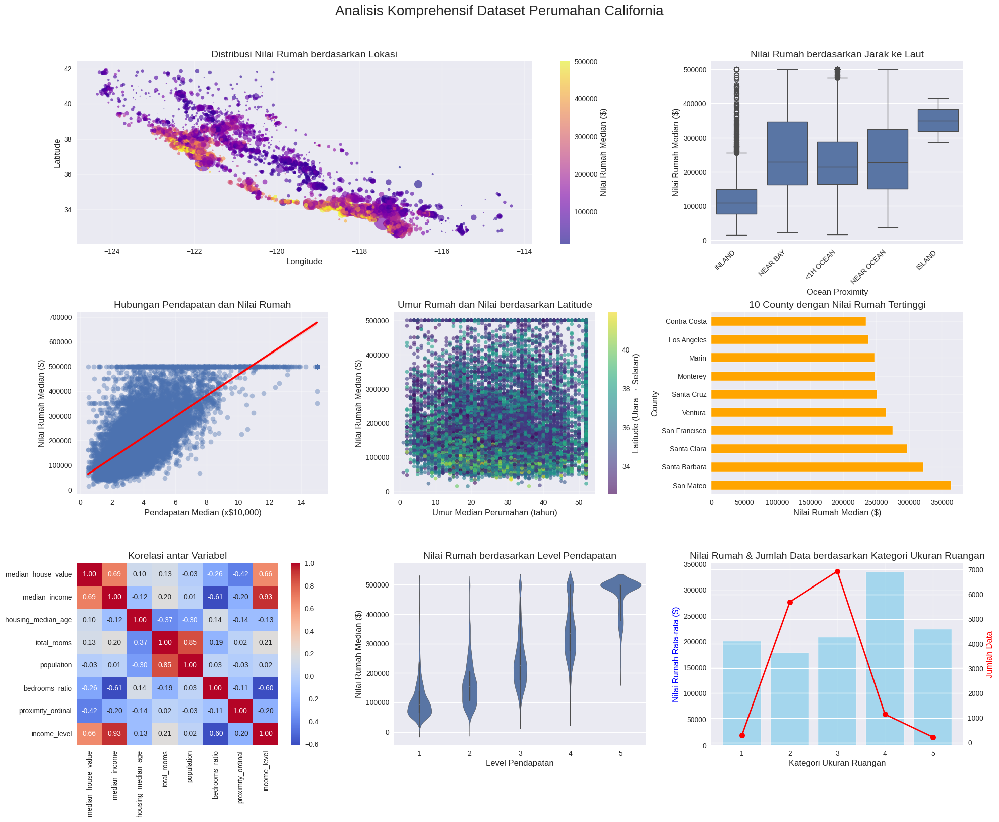


Analisis Statistik Tambahan:
----------------------------------------

Nilai Rata-rata berdasarkan Ocean Proximity:
                 median_house_value  median_income
ocean_proximity                                   
<1H OCEAN             239905.010952   42266.928095
INLAND                125089.791373   31972.025528
ISLAND                351100.000000   27187.500000
NEAR BAY              258557.791304   41766.929814
NEAR OCEAN            249394.632884   40168.382749

Statistik Nilai Rumah berdasarkan Level Pendapatan:
                       mean           std       min       max
income_level                                                 
1             112132.099401  70366.768219   14999.0  500001.0
2             167459.331378  84383.790475   14999.0  500001.0
3             244564.204528  94366.123669   47500.0  500001.0
4             343538.896373  93362.573329   67500.0  500001.0
5             465392.454737  61018.616348  193500.0  500001.0

County dengan Rasio Pendapatan/Nilai R

In [ ]:
# Mengatur style plot - DIKOREKSI
plt.style.use('seaborn-v0_8')
plt.rcParams['axes.grid'] = True

# Membuat figure dengan ukuran yang lebih besar
plt.figure(figsize=(20, 16))
gs = GridSpec(3, 3, figure=plt.gcf())

# 1. Peta Distribusi Nilai Rumah berdasarkan Lokasi
ax1 = plt.subplot(gs[0, :2])
scatter = ax1.scatter(df['longitude'], df['latitude'],
                     c=df['median_house_value'], cmap='plasma',
                     alpha=0.6, s=df['population']/50, edgecolor='none')
ax1.set_title('Distribusi Nilai Rumah berdasarkan Lokasi', fontsize=14)
ax1.set_xlabel('Longitude', fontsize=12)
ax1.set_ylabel('Latitude', fontsize=12)
cbar = plt.colorbar(scatter, ax=ax1)
cbar.set_label('Nilai Rumah Median ($)', fontsize=12)
ax1.grid(True, alpha=0.3)

# 2. Distribusi Nilai Rumah berdasarkan Ocean Proximity
ax2 = plt.subplot(gs[0, 2])
sns.boxplot(x='ocean_proximity', y='median_house_value', data=df, ax=ax2)
ax2.set_title('Nilai Rumah berdasarkan Jarak ke Laut', fontsize=14)
ax2.set_xlabel('Ocean Proximity', fontsize=12)
ax2.set_ylabel('Nilai Rumah Median ($)', fontsize=12)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')

# 3. Hubungan antara Pendapatan dan Nilai Rumah
ax3 = plt.subplot(gs[1, 0])
sns.regplot(x='median_income', y='median_house_value', data=df,
           scatter_kws={'alpha':0.4}, line_kws={'color':'red'}, ax=ax3)
ax3.set_title('Hubungan Pendapatan dan Nilai Rumah', fontsize=14)
ax3.set_xlabel('Pendapatan Median (x$10,000)', fontsize=12)
ax3.set_ylabel('Nilai Rumah Median ($)', fontsize=12)
ax3.grid(True, alpha=0.3)

# 4. Hubungan antara Housing Age dan Nilai Rumah berdasarkan Lokasi
ax4 = plt.subplot(gs[1, 1])
scatter2 = ax4.scatter(df['housing_median_age'], df['median_house_value'],
                     c=df['latitude'], cmap='viridis',
                     alpha=0.6, s=30, edgecolor='none')
ax4.set_title('Umur Rumah dan Nilai berdasarkan Latitude', fontsize=14)
ax4.set_xlabel('Umur Median Perumahan (tahun)', fontsize=12)
ax4.set_ylabel('Nilai Rumah Median ($)', fontsize=12)
cbar2 = plt.colorbar(scatter2, ax=ax4)
cbar2.set_label('Latitude (Utara → Selatan)', fontsize=12)
ax4.grid(True, alpha=0.3)

# 5. Top 10 County dengan Nilai Rumah Tertinggi
ax5 = plt.subplot(gs[1, 2])
county_values = df.groupby('county')['median_house_value'].mean().sort_values(ascending=False).head(10)
county_values.plot(kind='barh', ax=ax5, color='orange')
ax5.set_title('10 County dengan Nilai Rumah Tertinggi', fontsize=14)
ax5.set_xlabel('Nilai Rumah Median ($)', fontsize=12)
ax5.set_ylabel('County', fontsize=12)
ax5.grid(True, alpha=0.3)

# 6. Heatmap Korelasi
ax6 = plt.subplot(gs[2, 0])
correlation_vars = ['median_house_value', 'median_income', 'housing_median_age',
                   'total_rooms', 'population', 'bedrooms_ratio',
                   'proximity_ordinal', 'income_level']
corr = df[correlation_vars].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', ax=ax6)
ax6.set_title('Korelasi antar Variabel', fontsize=14)

# 7. Distribusi Nilai Rumah berdasarkan Kategori Pendapatan
ax7 = plt.subplot(gs[2, 1])
sns.violinplot(x='income_level', y='median_house_value', data=df, ax=ax7)
ax7.set_title('Nilai Rumah berdasarkan Level Pendapatan', fontsize=14)
ax7.set_xlabel('Level Pendapatan', fontsize=12)
ax7.set_ylabel('Nilai Rumah Median ($)', fontsize=12)

# 8. Histogram Perbandingan Room Size Category
ax8 = plt.subplot(gs[2, 2])
room_size_value = df.groupby('room_size_category')['median_house_value'].mean()
room_count = df['room_size_category'].value_counts().sort_index()

# Buat twin axis untuk plot ganda
ax8b = ax8.twinx()
ax8.bar(room_size_value.index, room_size_value.values, alpha=0.7, color='skyblue')
ax8b.plot(room_count.index, room_count.values, 'ro-', linewidth=2, markersize=8)

ax8.set_title('Nilai Rumah & Jumlah Data berdasarkan Kategori Ukuran Ruangan', fontsize=14)
ax8.set_xlabel('Kategori Ukuran Ruangan', fontsize=12)
ax8.set_ylabel('Nilai Rumah Rata-rata ($)', color='blue', fontsize=12)
ax8b.set_ylabel('Jumlah Data', color='red', fontsize=12)
ax8.set_xticks(range(1, 6))
ax8.grid(True, alpha=0.3)

# Mengatur layout dan menampilkan plot
plt.tight_layout()
plt.suptitle('Analisis Komprehensif Dataset Perumahan California', fontsize=20, y=1.02)
plt.subplots_adjust(top=0.95)
plt.savefig('california_housing_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# Statistik tambahan yang menarik (dapat ditampilkan sebagai output text)
print("\nAnalisis Statistik Tambahan:")
print("-" * 40)

# Nilai rata-rata berdasarkan ocean proximity
proximity_stats = df.groupby('ocean_proximity')[['median_house_value', 'median_income']].mean()
proximity_stats['median_income'] = proximity_stats['median_income'] * 10000  # Konversi ke dollar
print("\nNilai Rata-rata berdasarkan Ocean Proximity:")
print(proximity_stats)

# Perbedaan nilai berdasarkan income level
income_level_stats = df.groupby('income_level')['median_house_value'].agg(['mean', 'std', 'min', 'max'])
print("\nStatistik Nilai Rumah berdasarkan Level Pendapatan:")
print(income_level_stats)

# County dengan rasio pendapatan terhadap nilai rumah tertinggi dan terendah
df['income_to_value_ratio'] = (df['median_income'] * 10000) / df['median_house_value']
county_ratio = df.groupby('county')['income_to_value_ratio'].mean().sort_values()
print("\nCounty dengan Rasio Pendapatan/Nilai Rumah Terendah (Least Affordable):")
print(county_ratio.head(5))
print("\nCounty dengan Rasio Pendapatan/Nilai Rumah Tertinggi (Most Affordable):")
print(county_ratio.tail(5))

Dari visualisasi komprehensif di atas, kita dapat mengambil beberapa kesimpulan analitis yang kuat (Baca dari atas, dari kiri ke kanan):

1. Pola Geografis Nilai Rumah:

  - Peta distribusi nilai (plot 1) menunjukkan bahwa nilai rumah tertinggi terkonsentrasi di daerah pesisir, terutama di sekitar San Francisco Bay Area dan Los Angeles.
  - Terdapat gradien nilai rumah yang menurun dari pesisir ke pedalaman, dengan nilai terendah di Central Valley California.


2. Pengaruh Jarak ke Laut:

  - Box plot (plot 2) secara jelas membuktikan bahwa properti dengan proximitas "NEAR OCEAN" dan "NEAR BAY" memiliki nilai median jauh lebih tinggi dibandingkan kategori lainnya.
  - Kategori "INLAND" secara konsisten memiliki nilai terendah dengan varians yang lebih kecil.


3. Pendapatan sebagai Prediktor Utama:

  - Scatter plot dengan garis regresi (plot 3) menunjukkan korelasi positif yang sangat kuat antara pendapatan median dan nilai rumah (terlihat dari kemiringan garis).
  - Pada level pendapatan tinggi, variasi nilai rumah semakin besar, menunjukkan faktor-faktor lain (seperti lokasi) menjadi lebih berpengaruh.


4. Pengaruh Usia Perumahan:

  - Plot 4 memperlihatkan bahwa hubungan antara usia perumahan dan nilai rumah tidak linear.
  - Perumahan yang sangat tua (40-50 tahun) di daerah utara California (ditunjukkan oleh warna lebih terang pada skala latitude) justru memiliki nilai tinggi, menunjukkan lokasi dan histori lebih berpengaruh daripada usia bangunan.


5. Top 10 County Paling Mahal:

  - Bar chart (plot 5) mengkonfirmasi bahwa San Mateo, Santa Barbara, dan Santa Clara adalah tiga county dengan nilai rumah tertinggi.
  - County-county di Bay Area (San Mateo, Santa Clara, San Francisco) dan pesisir selatan (Santa Barbara, Ventura) mendominasi daftar ini.


6. Korelasi antar Variabel:

  - Heatmap korelasi (plot 6) memperlihatkan bahwa 'median_income' dan 'income_level' memiliki korelasi positif tertinggi dengan nilai rumah.
'- Proximity_ordinal' memiliki korelasi negatif signifikan, mengkonfirmasi bahwa semakin dekat ke laut (nilai ordinal lebih rendah), semakin tinggi nilai rumahnya.


7. Sebaran Nilai berdasarkan Level Pendapatan:

  - Violin plot (plot 7) menunjukkan peningkatan nilai rumah yang konsisten seiring peningkatan level pendapatan.
  - Variasi nilai rumah juga meningkat pada level pendapatan yang lebih tinggi, menunjukkan heterogenitas lebih besar pada pasar perumahan kelas atas.


8. Hubungan Ukuran Ruangan dan Nilai:

  - Plot ganda (plot 8) memperlihatkan bahwa meskipun kategori ukuran ruangan 5 (terbesar) memiliki jumlah data paling sedikit, namun nilai rumahnya tertinggi.
  - Terdapat tren peningkatan nilai rumah seiring peningkatan kategori ukuran ruangan.

## 3. Checking for Outliers in Each Column

In [ ]:
# Visual Distribution Fucntion

def visual_distribution(df, column):
    plt.figure(figsize=(9, 4))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[column], kde=True)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    # Box plot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[column])
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)

    plt.tight_layout()
    plt.show()

### a `housing_median_age`

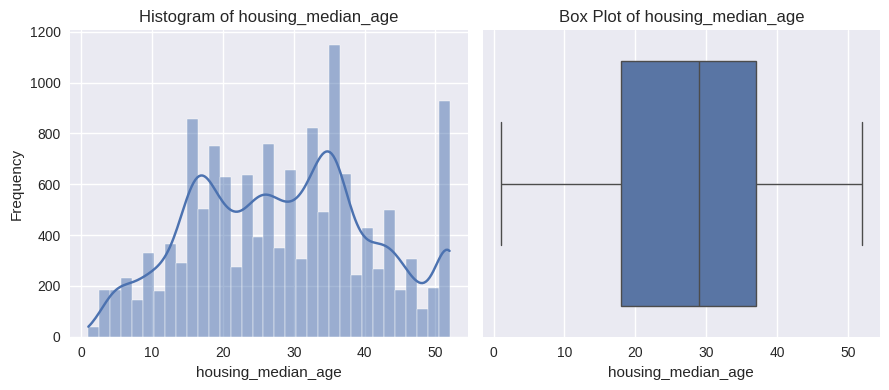

In [ ]:
visual_distribution(df, "housing_median_age")

In [ ]:
# Show Housing Median Age more than 50
df[df['housing_median_age'] > 50]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,room_per_household,population_per_household,bedrooms_ratio,income_household,income_to_rooms_ratio,income_to_population_ratio,county,proximity_ordinal,income_level,housing_age_category,room_size_category,pop_density_category,income_to_value_ratio
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0,2.800000,4.825000,0.250000,0.049375,0.017634,0.010233,Fresno,5,1,5,1,4,0.415789
38,-121.95,37.28,52.0,777.0,148.0,362.0,144.0,4.0208,<1H OCEAN,262500.0,5.395833,2.513889,0.190476,0.027922,0.005175,0.011107,Santa Clara,3,3,5,3,2,0.153173
48,-122.43,37.71,52.0,1508.0,278.0,1138.0,304.0,4.0234,NEAR BAY,266500.0,4.960526,3.743421,0.184350,0.013235,0.002668,0.003536,San Francisco,4,3,5,2,3,0.150972
50,-122.26,37.88,52.0,2363.0,604.0,1558.0,573.0,2.9440,NEAR BAY,338900.0,4.123909,2.719023,0.255607,0.005138,0.001246,0.001890,San Francisco,4,2,5,2,2,0.086869
65,-122.25,37.84,52.0,3549.0,707.0,1551.0,714.0,3.6912,NEAR BAY,261100.0,4.970588,2.172269,0.199211,0.005170,0.001040,0.002380,San Francisco,4,2,5,2,2,0.141371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14195,-122.18,37.77,52.0,2744.0,547.0,1479.0,554.0,2.2768,NEAR BAY,96200.0,4.953069,2.669675,0.199344,0.004110,0.000830,0.001539,Alameda,4,2,5,2,2,0.236674
14217,-122.41,37.74,52.0,2058.0,399.0,1208.0,399.0,3.6429,NEAR BAY,230000.0,5.157895,3.027569,0.193878,0.009130,0.001770,0.003016,San Francisco,4,2,5,3,3,0.158387
14242,-117.15,32.72,52.0,344.0,177.0,460.0,147.0,1.2292,NEAR OCEAN,137500.0,2.340136,3.129252,0.514535,0.008362,0.003573,0.002672,San Diego,2,1,5,1,3,0.089396
14288,-118.31,33.98,52.0,1837.0,426.0,1062.0,343.0,2.0000,<1H OCEAN,96500.0,5.355685,3.096210,0.231900,0.005831,0.001089,0.001883,Los Angeles,3,2,5,3,3,0.207254


#### Analisis Distribusi Usia Median Rumah

### Visualisasi Distribusi housing_median_age

Visualisasi di atas menunjukkan distribusi variabel `housing_median_age` yang merepresentasikan usia median rumah-rumah di setiap blok sensus California.

#### Analisis Histogram
Histogram menampilkan distribusi yang cukup menarik dengan beberapa pola yang perlu diperhatikan:

1. **Distribusi Multimodal**: Grafik menunjukkan distribusi multimodal (memiliki beberapa puncak), dengan puncak-puncak yang terlihat pada sekitar usia 15, 20, 30, dan 40 tahun. Ini mengindikasikan adanya beberapa periode pembangunan perumahan yang signifikan di California.

2. **Periode Pembangunan**: Puncak tertinggi terlihat pada usia sekitar 35-40 tahun, yang menunjukkan ada gelombang pembangunan perumahan yang signifikan di California pada pertengahan tahun 1980-an.

3. **Properti Baru vs Tua**: Histogram menunjukkan bahwa jumlah properti sangat baru (< 10 tahun) relatif lebih sedikit dibandingkan properti yang berusia menengah. Terdapat juga peningkatan frekuensi pada usia 50 tahun, yang mungkin menunjukkan bahwa usia maksimum dibulatkan ke angka 50.

4. **Distribusi yang Luas**: Data tersebar dari properti baru (1 tahun) hingga yang sangat tua (52 tahun), yang mencerminkan beragamnya usia perumahan di California.

#### Analisis Box Plot
Box plot memberikan informasi tambahan tentang distribusi:

1. **Median**: Garis merah di dalam box menunjukkan median usia sekitar 29 tahun.

2. **IQR (Interquartile Range)**: 50% dari data berada dalam kotak, antara kuartil pertama (Q1 ≈ 18 tahun) dan kuartil ketiga (Q3 ≈ 37 tahun).

3. **Whiskers**: Menunjukkan rentang data dari sekitar 1 tahun hingga sekitar 52 tahun, tanpa adanya outlier yang signifikan.

4. **Kemiringan**: Box plot menunjukkan distribusi yang cukup simetris, dengan median yang hampir berada di tengah box.



### b. `total_rooms`

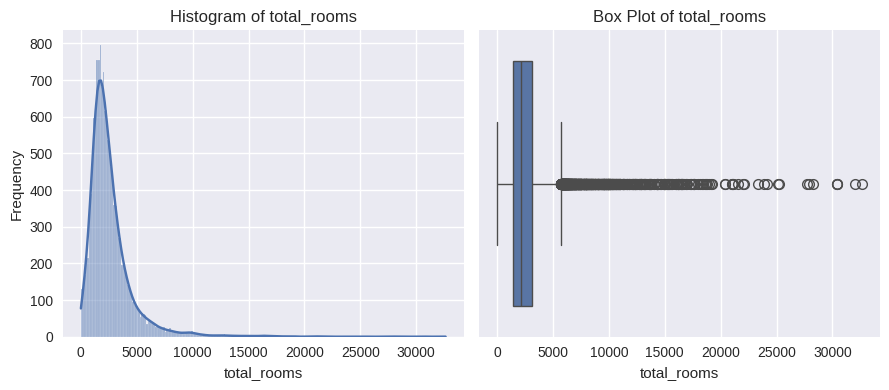

In [ ]:
visual_distribution(df, "total_rooms")

In [ ]:
# Showing total_rooms more than 5000
df[df['total_rooms'] > 5000]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,room_per_household,population_per_household,bedrooms_ratio,income_household,income_to_rooms_ratio,income_to_population_ratio,county,proximity_ordinal,income_level,housing_age_category,room_size_category,pop_density_category,income_to_value_ratio
5,-117.79,33.80,11.0,10535.0,1620.0,4409.0,1622.0,6.6700,<1H OCEAN,283200.0,6.495068,2.718249,0.153773,0.004112,0.000633,0.001513,Orange,3,4,2,3,2,0.235523
9,-122.27,37.97,10.0,15259.0,2275.0,7266.0,2338.0,6.0666,NEAR BAY,272400.0,6.526518,3.107784,0.149092,0.002595,0.000398,0.000835,San Francisco,4,4,2,3,3,0.222709
13,-117.50,33.96,12.0,7923.0,1470.0,4861.0,1385.0,4.2985,INLAND,139200.0,5.720578,3.509747,0.185536,0.003104,0.000543,0.000884,Orange,5,3,2,3,3,0.308800
22,-121.53,38.61,5.0,8149.0,1913.0,2933.0,1616.0,3.6788,INLAND,178800.0,5.042698,1.814975,0.234753,0.002276,0.000451,0.001254,Sacramento,5,2,1,3,1,0.205749
28,-121.09,38.68,15.0,5218.0,711.0,1949.0,659.0,4.7083,INLAND,213300.0,7.918058,2.957511,0.136259,0.007145,0.000902,0.002416,Sacramento,5,3,2,4,2,0.220736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14270,-122.25,37.46,33.0,6841.0,950.0,2681.0,980.0,7.1088,NEAR OCEAN,443300.0,6.980612,2.735714,0.138869,0.007254,0.001039,0.002652,San Mateo,2,4,4,3,2,0.160361
14277,-122.28,37.49,25.0,7335.0,1157.0,2626.0,1049.0,6.5475,NEAR OCEAN,500001.0,6.992374,2.503337,0.157737,0.006242,0.000893,0.002493,San Mateo,2,4,3,3,2,0.130950
14281,-117.05,33.05,6.0,7916.0,1293.0,2741.0,1204.0,5.6436,<1H OCEAN,278600.0,6.574751,2.276578,0.163340,0.004687,0.000713,0.002059,San Diego,3,3,1,3,2,0.202570
14291,-118.03,34.01,10.0,6531.0,1036.0,2975.0,1018.0,6.2319,<1H OCEAN,403700.0,6.415521,2.922397,0.158628,0.006122,0.000954,0.002095,Los Angeles,3,4,2,3,2,0.154370


#### Analisis Distribusi Total Ruangan

### Visualisasi Distribusi total_rooms

Visualisasi di atas menampilkan distribusi variabel `total_rooms` yang merepresentasikan jumlah total ruangan di setiap blok sensus California.

#### Analisis Histogram
Histogram menunjukkan distribusi yang sangat skewed (miring) ke kanan dengan karakteristik sebagai berikut:

1. **Distribusi Sangat Asimetris**: Sebagian besar data terkonsentrasi di sisi kiri (nilai rendah), dengan frekuensi tertinggi pada rentang 0-5000 ruangan per blok sensus.

2. **Long Tail (Ekor Panjang)**: Grafik memiliki ekor yang sangat panjang ke kanan, menunjukkan bahwa ada sejumlah kecil blok sensus dengan jumlah ruangan yang sangat besar (hingga lebih dari 30,000 ruangan).

3. **Mayoritas Area Memiliki Ruangan Sedikit**: Puncak distribusi berada di sekitar 2000-3000 ruangan per blok sensus, yang menunjukkan bahwa sebagian besar area di California memiliki kepadatan bangunan yang relatif rendah.

4. **Frekuensi Menurun Drastis**: Jumlah blok sensus dengan lebih dari 10,000 ruangan sangat sedikit, yang terlihat dari frekuensi yang mendekati nol pada rentang nilai tersebut.

#### Analisis Box Plot
Box plot memberikan informasi lebih lanjut tentang distribusi:

1. **Median**: Garis di dalam box menunjukkan median sekitar 2125 ruangan per blok sensus.

2. **IQR (Interquartile Range)**: Box menunjukkan bahwa 50% dari data berada antara sekitar 1452 (Q1) dan 3142 (Q3) ruangan per blok sensus.

3. **Outlier yang Ekstrem**: Titik-titik di luar whisker menunjukkan adanya banyak outlier dengan jumlah ruangan yang sangat tinggi. Beberapa blok sensus memiliki lebih dari 20,000 hingga 30,000 ruangan.

4. **Skewness yang Parah**: Jarak dari median ke whisker atas jauh lebih panjang daripada jarak ke whisker bawah, mengkonfirmasi skewness positif yang kuat.



### c. `total_bedrooms`

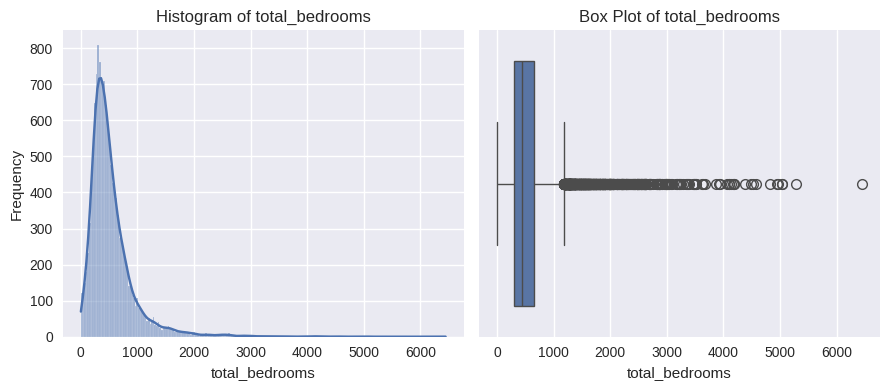

In [ ]:
visual_distribution(df, "total_bedrooms")

In [ ]:
# Showing total bedrooms more than 1500
df[df['total_bedrooms'] > 1500]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,room_per_household,population_per_household,bedrooms_ratio,income_household,income_to_rooms_ratio,income_to_population_ratio,county,proximity_ordinal,income_level,housing_age_category,room_size_category,pop_density_category,income_to_value_ratio
5,-117.79,33.80,11.0,10535.0,1620.0,4409.0,1622.0,6.6700,<1H OCEAN,283200.0,6.495068,2.718249,0.153773,0.004112,0.000633,0.001513,Orange,3,4,2,3,2,0.235523
9,-122.27,37.97,10.0,15259.0,2275.0,7266.0,2338.0,6.0666,NEAR BAY,272400.0,6.526518,3.107784,0.149092,0.002595,0.000398,0.000835,San Francisco,4,4,2,3,3,0.222709
22,-121.53,38.61,5.0,8149.0,1913.0,2933.0,1616.0,3.6788,INLAND,178800.0,5.042698,1.814975,0.234753,0.002276,0.000451,0.001254,Sacramento,5,2,1,3,1,0.205749
54,-121.36,38.67,5.0,5819.0,1507.0,3237.0,1356.0,2.2339,INLAND,116600.0,4.291298,2.387168,0.258979,0.001647,0.000384,0.000690,Sacramento,5,2,1,2,2,0.191587
77,-122.05,37.93,15.0,7803.0,1603.0,2957.0,1546.0,4.4500,NEAR BAY,184900.0,5.047219,1.912678,0.205434,0.002878,0.000570,0.001505,Contra Costa,4,3,2,3,1,0.240671
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14164,-117.92,33.67,14.0,6224.0,1679.0,3148.0,1589.0,4.2071,<1H OCEAN,430900.0,3.916929,1.981120,0.269762,0.002648,0.000676,0.001336,Orange,3,3,2,2,1,0.097635
14190,-118.34,33.91,12.0,9975.0,3638.0,7429.0,3405.0,2.6689,<1H OCEAN,192300.0,2.929515,2.181791,0.364712,0.000784,0.000268,0.000359,Los Angeles,3,2,2,1,2,0.138788
14207,-118.09,34.57,4.0,9761.0,1683.0,4970.0,1535.0,4.5266,INLAND,142900.0,6.358958,3.237785,0.172421,0.002949,0.000464,0.000911,Los Angeles,5,3,1,3,3,0.316767
14226,-117.22,32.86,4.0,16289.0,4585.0,7604.0,4176.0,3.6287,NEAR OCEAN,280800.0,3.900623,1.820881,0.281478,0.000869,0.000223,0.000477,San Diego,2,2,1,2,1,0.129227


#### Analisis Distribusi Total Kamar Tidur

### Visualisasi Distribusi total_bedrooms

Visualisasi di atas menampilkan distribusi variabel `total_bedrooms` yang merepresentasikan jumlah total kamar tidur di setiap blok sensus California.

#### Analisis Histogram
Histogram menunjukkan pola distribusi yang sangat mirip dengan `total_rooms` dengan karakteristik sebagai berikut:

1. **Distribusi Sangat Condong ke Kanan (Positively Skewed)**: Mayoritas data terkonsentrasi pada nilai-nilai rendah, dengan sebagian besar blok sensus memiliki jumlah kamar tidur di bawah 1000.

2. **Puncak Tajam (Leptokurtic)**: Distribusi memiliki puncak yang sangat tajam di sekitar 500 kamar tidur, menunjukkan bahwa sebagian besar area di California memiliki jumlah kamar tidur yang relatif seragam.

3. **Ekor Panjang (Long Tail)**: Ada sejumlah kecil blok sensus dengan jumlah kamar tidur yang sangat tinggi, mencapai lebih dari 6000 kamar tidur. Ini menciptakan ekor distribusi yang panjang ke arah kanan.

4. **Frekuensi Menurun Cepat**: Jumlah blok sensus dengan lebih dari 2000 kamar tidur sangat sedikit, terlihat dari histogram yang hampir mendatar pada nilai-nilai tinggi.

#### Analisis Box Plot
Box plot memberikan informasi tambahan tentang sebaran data:

1. **Median**: Garis tengah dalam box menunjukkan median sekitar 435 kamar tidur per blok sensus.

2. **IQR (Interquartile Range)**: 50% dari data berada dalam kotak, antara kuartil pertama (Q1 ≈ 295) dan kuartil ketiga (Q3 ≈ 647).

3. **Outlier Ekstrem**: Terlihat banyak titik outlier di luar whisker atas, yang menunjukkan blok sensus dengan jumlah kamar tidur yang jauh di atas rata-rata. Beberapa outlier ekstrem mencapai lebih dari 6000 kamar tidur.

4. **Distribusi Tidak Simetris**: Box plot mengkonfirmasi bahwa distribusi sangat tidak simetris, dengan jarak dari median ke whisker atas yang jauh lebih panjang dibandingkan jarak ke whisker bawah.

#### Perbandingan dengan total_rooms
Pola distribusi `total_bedrooms` sangat mirip dengan `total_rooms`, yang menunjukkan adanya hubungan proporsional yang konsisten antara jumlah ruangan total dan jumlah kamar tidur di seluruh area. Ini konsisten dengan fitur `bedrooms_ratio` yang telah kita buat sebelumnya.


### d. `population`

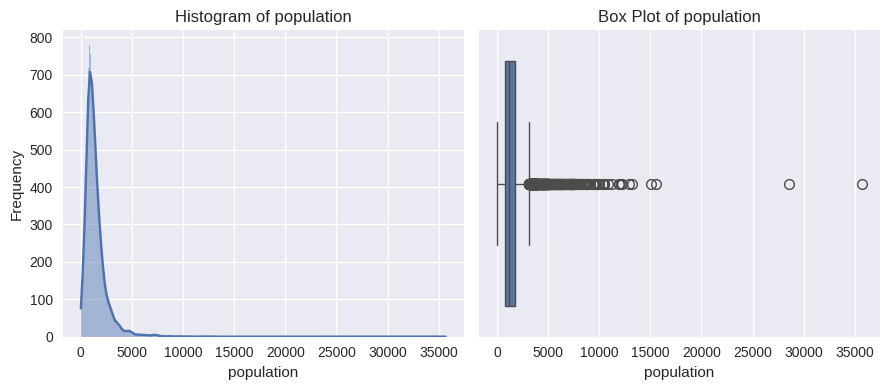

In [ ]:
visual_distribution(df, "population")

In [ ]:
# Showing population more than 10000
df[df['population'] > 10000].sort_values(by='population', ascending=False)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,room_per_household,population_per_household,bedrooms_ratio,income_household,income_to_rooms_ratio,income_to_population_ratio,county,proximity_ordinal,income_level,housing_age_category,room_size_category,pop_density_category,income_to_value_ratio
12394,-117.42,33.35,14.0,25135.0,4819.0,35682.0,4769.0,2.5729,<1H OCEAN,134400.0,5.270497,7.482072,0.191725,0.000540,0.000102,0.000072,Orange,3,2,2,3,5,0.191436
4085,-121.79,36.64,11.0,32627.0,6445.0,28566.0,6082.0,2.3087,<1H OCEAN,118800.0,5.364518,4.696810,0.197536,0.000380,0.000071,0.000081,Monterey,3,2,2,3,4,0.194335
7992,-117.78,34.03,8.0,32054.0,5290.0,15507.0,5050.0,6.0191,<1H OCEAN,253900.0,6.347327,3.070693,0.165034,0.001192,0.000188,0.000388,Orange,3,4,1,3,3,0.237066
12540,-117.87,34.04,7.0,27700.0,4179.0,15037.0,4072.0,6.6288,<1H OCEAN,339700.0,6.802554,3.692780,0.150866,0.001628,0.000239,0.000441,Orange,3,4,1,3,3,0.195137
13092,-117.12,33.52,4.0,30401.0,4957.0,13251.0,4339.0,4.5841,<1H OCEAN,212300.0,7.006453,3.053929,0.163054,0.001056,0.000151,0.000346,Orange,3,3,1,4,3,0.215926
11966,-118.78,34.16,9.0,30405.0,4093.0,12873.0,3931.0,8.0137,NEAR OCEAN,399200.0,7.734673,3.274739,0.134616,0.002039,0.000264,0.000623,Ventura,2,5,1,4,3,0.200744
11127,-121.92,37.53,7.0,28258.0,3864.0,12203.0,3701.0,8.4045,<1H OCEAN,451100.0,7.635234,3.297217,0.136740,0.002271,0.000297,0.000689,Santa Clara,3,5,1,4,3,0.186311
14160,-121.68,36.72,12.0,19234.0,4492.0,12153.0,4372.0,3.2652,<1H OCEAN,152800.0,4.399360,2.779735,0.233545,0.000747,0.000170,0.000269,Santa Cruz,3,2,2,2,2,0.213691
165,-118.90,34.26,5.0,25187.0,3521.0,11956.0,3478.0,6.9712,<1H OCEAN,321300.0,7.241806,3.437608,0.139794,0.002004,0.000277,0.000583,Ventura,3,4,1,4,3,0.216969
10800,-121.53,38.48,5.0,27870.0,5027.0,11935.0,4855.0,4.8811,INLAND,212200.0,5.740474,2.458290,0.180373,0.001005,0.000175,0.000409,Sacramento,5,3,1,3,2,0.230024


#### Analisis Distribusi Populasi

### Visualisasi Distribusi population

Visualisasi di atas menampilkan distribusi variabel `population` yang menunjukkan jumlah total penduduk di setiap blok sensus California.

#### Analisis Histogram
Histogram menunjukkan distribusi populasi dengan karakteristik yang sangat mirip dengan variabel `total_rooms` dan `total_bedrooms`:

1. **Distribusi Ekstrem Condong ke Kanan**: Distribusi populasi menunjukkan kemiringan positif yang sangat ekstrem, dengan mayoritas blok sensus memiliki populasi di bawah 5000 orang.

2. **Konsentrasi Data pada Nilai Rendah**: Puncak distribusi berada di sekitar 1000-2000 penduduk per blok sensus, menunjukkan bahwa sebagian besar blok sensus di California memiliki kepadatan penduduk yang relatif rendah.

3. **Ekor yang Sangat Panjang**: Ekor distribusi sangat panjang ke kanan dengan sejumlah kecil blok sensus yang memiliki populasi sangat tinggi, mencapai lebih dari 35,000 penduduk.

4. **Penurunan Frekuensi yang Tajam**: Terjadi penurunan yang sangat tajam dalam frekuensi setelah 5000 penduduk, dengan sangat sedikit blok sensus yang memiliki populasi di atas 10,000.

#### Analisis Box Plot
Box plot memberikan informasi yang lebih detail tentang distribusi data:

1. **Median**: Garis tengah dalam box menunjukkan median sekitar 1164 penduduk per blok sensus.

2. **IQR (Interquartile Range)**: 50% dari data berada dalam kotak, antara kuartil pertama (Q1 ≈ 784) dan kuartil ketiga (Q3 ≈ 1722).

3. **Outlier yang Signifikan**: Terdapat banyak outlier di luar whisker atas, termasuk beberapa outlier ekstrem dengan populasi mencapai lebih dari 30,000 penduduk. Dua titik paling ekstrem terlihat pada sekitar 32,000 dan 35,000.

4. **Asimetri yang Kuat**: Box plot sangat asimetris dengan whisker atas yang jauh lebih panjang daripada whisker bawah, yang sekali lagi mengkonfirmasi kemiringan distribusi yang sangat positif.

#### Implikasi untuk Analisis dan Pemodelan
Distribusi populasi yang sangat condong ini memiliki beberapa implikasi penting:

1. **Kebutuhan Transformasi**: Seperti halnya `total_rooms` dan `total_bedrooms`, variabel `population` mungkin memerlukan transformasi

### e. `households`

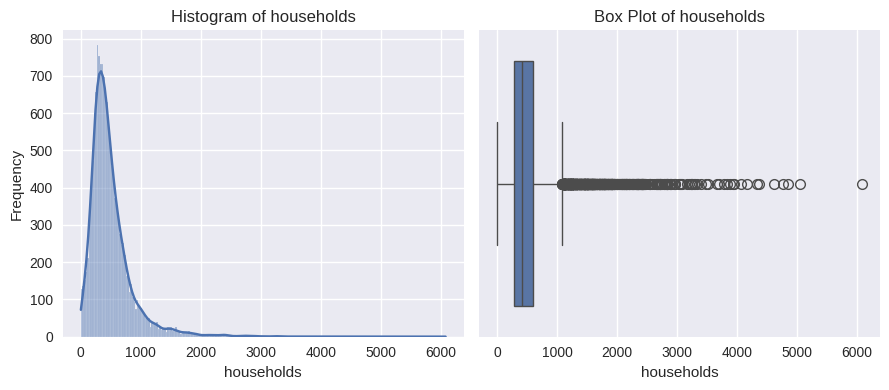

In [ ]:
visual_distribution(df, "households")

In [ ]:
# Showing households more than 1000
df[df['households'] > 1000].sort_values(by='households', ascending=False).head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,room_per_household,population_per_household,bedrooms_ratio,income_household,income_to_rooms_ratio,income_to_population_ratio,county,proximity_ordinal,income_level,housing_age_category,room_size_category,pop_density_category,income_to_value_ratio
4085,-121.79,36.64,11.0,32627.0,6445.0,28566.0,6082.0,2.3087,<1H OCEAN,118800.0,5.364518,4.696810,0.197536,0.000380,0.000071,0.000081,Monterey,3,2,2,3,4,0.194335
7992,-117.78,34.03,8.0,32054.0,5290.0,15507.0,5050.0,6.0191,<1H OCEAN,253900.0,6.347327,3.070693,0.165034,0.001192,0.000188,0.000388,Orange,3,4,1,3,3,0.237066
10800,-121.53,38.48,5.0,27870.0,5027.0,11935.0,4855.0,4.8811,INLAND,212200.0,5.740474,2.458290,0.180373,0.001005,0.000175,0.000409,Sacramento,5,3,1,3,2,0.230024
12394,-117.42,33.35,14.0,25135.0,4819.0,35682.0,4769.0,2.5729,<1H OCEAN,134400.0,5.270497,7.482072,0.191725,0.000540,0.000102,0.000072,Orange,3,2,2,3,5,0.191436
9722,-117.34,33.98,10.0,17286.0,4952.0,9851.0,4616.0,1.7579,INLAND,103400.0,3.744801,2.134099,0.286475,0.000381,0.000102,0.000178,Orange,5,1,2,2,2,0.170010


#### Analisis Distribusi Rumah Tangga

### Visualisasi Distribusi households

Visualisasi di atas menampilkan distribusi variabel `households` yang menunjukkan jumlah rumah tangga di setiap blok sensus California.

#### Analisis Histogram
Histogram menunjukkan distribusi jumlah rumah tangga dengan karakteristik berikut:

1. **Distribusi Sangat Condong ke Kanan**: Seperti variabel demografis lainnya (`population`, `total_rooms`, `total_bedrooms`), distribusi `households` menunjukkan kemiringan positif yang sangat kuat.

2. **Konsentrasi pada Nilai Rendah**: Mayoritas blok sensus memiliki jumlah rumah tangga di bawah 1000, dengan puncak distribusi berada di sekitar 400-500 rumah tangga.

3. **Penurunan Frekuensi yang Cepat**: Terlihat penurunan yang cepat dalam frekuensi setelah 1000 rumah tangga, dengan sangat sedikit blok sensus yang memiliki lebih dari 2000 rumah tangga.

4. **Ekor Panjang**: Distribusi memiliki ekor yang panjang ke kanan dengan beberapa blok sensus yang memiliki hingga 6000 rumah tangga, meskipun jumlahnya sangat sedikit.

#### Analisis Box Plot
Box plot memberikan informasi tambahan tentang distribusi data:

1. **Median**: Garis tengah dalam box menunjukkan median sekitar 410 rumah tangga per blok sensus.

2. **IQR (Interquartile Range)**: 50% dari data berada dalam kotak, antara kuartil pertama (Q1 ≈ 279) dan kuartil ketiga (Q3 ≈ 603).

3. **Outlier yang Signifikan**: Terdapat banyak outlier di luar whisker atas, dengan beberapa outlier ekstrem mencapai lebih dari 6000 rumah tangga.

4. **Asymmetry yang Kuat**: Box plot mengkonfirmasi distribusi yang sangat asimetris, dengan jarak dari median ke whisker atas yang jauh lebih panjang daripada jarak ke whisker bawah.

#### Hubungan dengan Variabel Demografis Lainnya
Distribusi `households` sangat mirip dengan pola distribusi variabel `population`, `total_rooms`, dan `total_bedrooms`, yang menunjukkan konsistensi dalam karakteristik demografi di seluruh California:

1. **Koherensi dengan Population**: Pola yang serupa antara `households` dan `population` menunjukkan bahwa area dengan kepadatan penduduk tinggi juga cenderung memiliki jumlah rumah tangga yang tinggi, yang tampak logis.

2. **Konsistensi dengan Jumlah Ruangan**: Kesamaan distribusi dengan `total_rooms` dan `total_bedrooms` mengindikasikan bahwa jumlah rumah tangga, populasi, dan ruangan cenderung meningkat secara proporsional di seluruh blok sensus.



Pada langkah selanjutnya, penting untuk menganalisis bagaimana `households` berkorelasi dengan variabel target `median_house_value` dan apakah korelasi ini bervariasi di berbagai lokasi geografis atau kategori kedekatan dengan laut (`ocean_proximity`).

### f. `median_income`

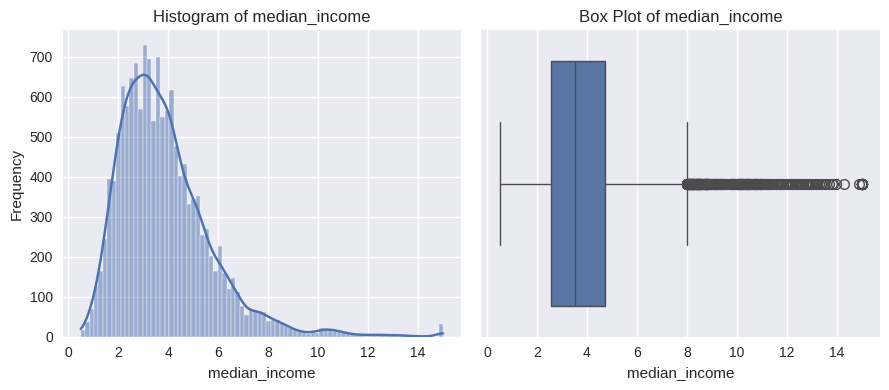

In [ ]:
visual_distribution(df, "median_income")

In [ ]:
# Showing median income more than 8
df[df['median_income'] > 8]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,room_per_household,population_per_household,bedrooms_ratio,income_household,income_to_rooms_ratio,income_to_population_ratio,county,proximity_ordinal,income_level,housing_age_category,room_size_category,pop_density_category,income_to_value_ratio
6,-117.80,33.81,14.0,1206.0,142.0,572.0,149.0,8.8470,<1H OCEAN,388700.0,8.093960,3.838926,0.117745,0.059376,0.007336,0.015467,Orange,3,5,2,4,3,0.227605
8,-117.65,33.48,6.0,1638.0,188.0,572.0,174.0,13.0502,<1H OCEAN,500001.0,9.413793,3.287356,0.114774,0.075001,0.007967,0.022815,Orange,3,5,1,5,3,0.261003
43,-122.21,37.37,34.0,1476.0,217.0,613.0,223.0,8.2883,NEAR OCEAN,500001.0,6.618834,2.748879,0.147019,0.037167,0.005615,0.013521,San Mateo,2,5,4,3,2,0.165766
73,-121.99,37.26,17.0,4034.0,611.0,1158.0,560.0,8.2069,<1H OCEAN,442500.0,7.203571,2.067857,0.151463,0.014655,0.002034,0.007087,Santa Clara,3,5,2,4,2,0.185467
122,-121.89,37.23,20.0,7754.0,976.0,3094.0,941.0,8.1900,<1H OCEAN,361600.0,8.240170,3.287991,0.125871,0.008704,0.001056,0.002647,Santa Clara,3,5,3,4,3,0.226493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14163,-118.54,34.26,23.0,4960.0,592.0,1929.0,586.0,10.9052,<1H OCEAN,500001.0,8.464164,3.291809,0.119355,0.018610,0.002199,0.005653,Los Angeles,3,5,3,4,3,0.218104
14171,-118.18,34.16,34.0,5012.0,746.0,1699.0,715.0,9.4987,<1H OCEAN,500001.0,7.009790,2.376224,0.148843,0.013285,0.001895,0.005591,Los Angeles,3,5,4,4,2,0.189974
14178,-118.01,33.69,3.0,945.0,115.0,337.0,123.0,11.5199,<1H OCEAN,500001.0,7.682927,2.739837,0.121693,0.093658,0.012190,0.034184,Orange,3,5,1,4,2,0.230398
14210,-117.66,34.12,22.0,2272.0,278.0,933.0,305.0,8.8204,INLAND,390500.0,7.449180,3.059016,0.122359,0.028919,0.003882,0.009454,Orange,5,5,3,4,3,0.225875


#### Analisis Distribusi Pendapatan Median

### Visualisasi Distribusi median_income

Visualisasi di atas menampilkan distribusi variabel `median_income` yang menunjukkan pendapatan median rumah tangga di setiap blok sensus California (dalam unit $10,000, misalnya nilai 3.5 berarti $35,000).

#### Analisis Histogram
Histogram menunjukkan pola distribusi pendapatan median dengan karakteristik berikut:

1. **Distribusi Condong ke Kanan**: Distribusi pendapatan median menunjukkan kemiringan positif, meskipun tidak seekstrem variabel demografis lainnya seperti `population` atau `total_rooms`.

2. **Puncak Utama**: Distribusi memiliki puncak utama di sekitar $30,000-$40,000 (nilai 3-4 pada sumbu x), yang menunjukkan bahwa sebagian besar blok sensus memiliki pendapatan median rumah tangga pada rentang ini.

3. **Distribusi yang Lebih Lebar**: Dibandingkan dengan variabel demografis sebelumnya, distribusi pendapatan median lebih tersebar dan tidak sekonsentrasi di nilai-nilai rendah.

4. **Ekor Panjang**: Terlihat ekor distribusi yang panjang ke kanan, dengan sejumlah kecil blok sensus yang memiliki pendapatan median sangat tinggi, mencapai lebih dari $150,000 (nilai 15 pada sumbu x).

5. **Nilai yang Dibulatkan**: Terlihat beberapa puncak kecil pada nilai bulat (seperti pada nilai 10 dan 15), yang mungkin menunjukkan adanya pembulatan dalam pengumpulan data.

#### Analisis Box Plot
Box plot memberikan informasi tambahan tentang distribusi data:

1. **Median**: Garis tengah dalam box menunjukkan median sekitar 3.54, yang berarti pendapatan median rumah tangga sekitar $35,400 per tahun.

2. **IQR (Interquartile Range)**: 50% dari data berada dalam kotak, antara kuartil pertama (Q1 ≈ 2.57) dan kuartil ketiga (Q3 ≈ 4.74), yang berarti antara $25,700 dan $47,400.

3. **Outlier**: Terdapat beberapa outlier di luar whisker atas, dengan nilai-nilai yang sangat tinggi mencapai 15 ($150,000) atau lebih.

4. **Asimetri**: Box plot menunjukkan asimetri, dengan whisker atas yang lebih panjang daripada whisker bawah, mengkonfirmasi kemiringan positif dalam distribusi.

#### Wawasan Sosio-Ekonomi
Distribusi pendapatan median memberikan wawasan penting tentang kondisi sosio-ekonomi di California:

1. **Kesenjangan Pendapatan**: Distribusi yang condong ke kanan dengan beberapa outlier ekstrem menunjukkan kesenjangan pendapatan yang signifikan di California, dengan beberapa area yang memiliki pendapatan jauh di atas rata-rata.

2. **Segmentasi Ekonomi**: Pola distribusi menunjukkan bahwa kebanyakan blok sensus berada pada kategori pendapatan menengah, dengan jumlah yang lebih sed

### g. `median_house_value`

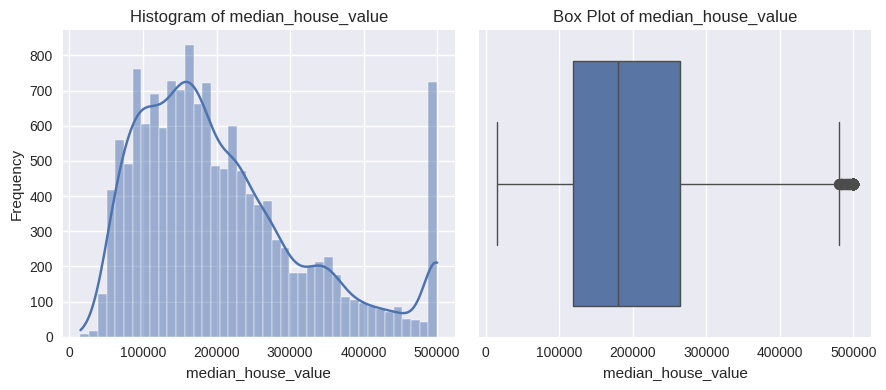

In [ ]:
visual_distribution(df, "median_house_value")

In [ ]:
# Showing house value more than 475000
high_price = df[df['median_house_value'] > 500000]
high_price

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,room_per_household,population_per_household,bedrooms_ratio,income_household,income_to_rooms_ratio,income_to_population_ratio,county,proximity_ordinal,income_level,housing_age_category,room_size_category,pop_density_category,income_to_value_ratio
8,-117.65,33.48,6.0,1638.0,188.0,572.0,174.0,13.0502,<1H OCEAN,500001.0,9.413793,3.287356,0.114774,0.075001,0.007967,0.022815,Orange,3,5,1,5,3,0.261003
43,-122.21,37.37,34.0,1476.0,217.0,613.0,223.0,8.2883,NEAR OCEAN,500001.0,6.618834,2.748879,0.147019,0.037167,0.005615,0.013521,San Mateo,2,5,4,3,2,0.165766
131,-122.44,37.80,52.0,3257.0,735.0,1045.0,620.0,4.5523,NEAR BAY,500001.0,5.253226,1.685484,0.225668,0.007342,0.001398,0.004356,San Francisco,4,3,5,3,1,0.091046
199,-122.42,37.80,52.0,4079.0,1112.0,1466.0,1024.0,4.5913,NEAR BAY,500001.0,3.983398,1.431641,0.272616,0.004484,0.001126,0.003132,San Francisco,4,3,5,2,1,0.091826
234,-121.89,37.46,5.0,1519.0,186.0,705.0,186.0,10.3798,<1H OCEAN,500001.0,8.166667,3.790323,0.122449,0.055805,0.006833,0.014723,Santa Clara,3,5,1,4,3,0.207596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14189,-118.44,34.07,26.0,3535.0,748.0,1322.0,666.0,7.1674,<1H OCEAN,500001.0,5.307808,1.984985,0.211598,0.010762,0.002028,0.005422,Los Angeles,3,4,3,3,1,0.143348
14192,-118.46,34.06,46.0,1302.0,215.0,482.0,226.0,7.0674,<1H OCEAN,500001.0,5.761062,2.132743,0.165131,0.031272,0.005428,0.014663,Los Angeles,3,4,5,3,2,0.141348
14235,-122.02,37.29,18.0,2550.0,312.0,999.0,320.0,8.7939,<1H OCEAN,500001.0,7.968750,3.121875,0.122353,0.027481,0.003449,0.008803,Santa Clara,3,5,2,4,3,0.175878
14241,-118.46,34.08,35.0,3247.0,525.0,1065.0,484.0,7.8426,<1H OCEAN,500001.0,6.708678,2.200413,0.161688,0.016204,0.002415,0.007364,Los Angeles,3,4,4,3,2,0.156852


#### Analisis Distribusi Nilai Rumah Median

### Visualisasi Distribusi median_house_value

Visualisasi di atas menampilkan distribusi variabel `median_house_value` yang merupakan target prediksi dalam dataset ini, menunjukkan nilai median rumah di setiap blok sensus California (dalam dolar).

#### Analisis Histogram
Histogram menunjukkan pola distribusi nilai rumah median dengan karakteristik yang sangat menarik:

1. **Distribusi Bimodal**: Distribusi menunjukkan pola bimodal (dua puncak), dengan puncak utama di sekitar $150,000-$200,000 dan peningkatan frekuensi yang signifikan di sekitar nilai $500,000.

2. **Kecenderungan Nilai Tengah**: Sebagian besar nilai rumah terkonsentrasi pada rentang $100,000-$250,000, menunjukkan harga properti yang umum di California pada saat data dikumpulkan.

3. **Lonjakan di Nilai Maksimum**: Terdapat lonjakan frekuensi yang sangat jelas pada nilai $500,000, yang kemungkinan besar menunjukkan adanya "capping" atau pembatasan nilai maksimum dalam dataset, di mana semua rumah yang bernilai $500,000 atau lebih dikelompokkan dalam kategori ini.

4. **Distribusi yang Lebih Merata**: Dibandingkan dengan variabel demografis, distribusi nilai rumah lebih tersebar dengan kemiringan yang tidak terlalu ekstrem, menunjukkan variasi yang lebih besar dalam nilai properti.

5. **Pola Multi-modal**: Selain dua puncak utama, terdapat beberapa puncak kecil lainnya, seperti di sekitar $300,000 dan $400,000, yang mungkin mencerminkan pengelompokan nilai properti di segmen pasar atau wilayah geografis tertentu.

#### Analisis Box Plot
Box plot memberikan informasi tambahan tentang distribusi data:

1. **Median**: Garis tengah dalam box menunjukkan median sekitar $180,000, yang merupakan nilai tengah untuk harga rumah di California.

2. **IQR (Interquartile Range)**: Box yang cukup besar menunjukkan bahwa 50% dari data berada antara kuartil pertama (Q1 ≈ $119,400) dan kuartil ketiga (Q3 ≈ $263,750), menunjukkan variasi yang signifikan dalam nilai properti.

3. **Pembatasan Nilai Maksimum**: Terkonsentrasinya titik-titik di nilai $500,000 mengkonfirmasi adanya pembatasan nilai maksimum dalam dataset.

4. **Distribusi yang Cukup Simetris**: Box plot menunjukkan distribusi yang relatif lebih simetris dibandingkan variabel lain yang telah kita analisis, meskipun masih ada kemiringan positif.


### h. `population_per_household`

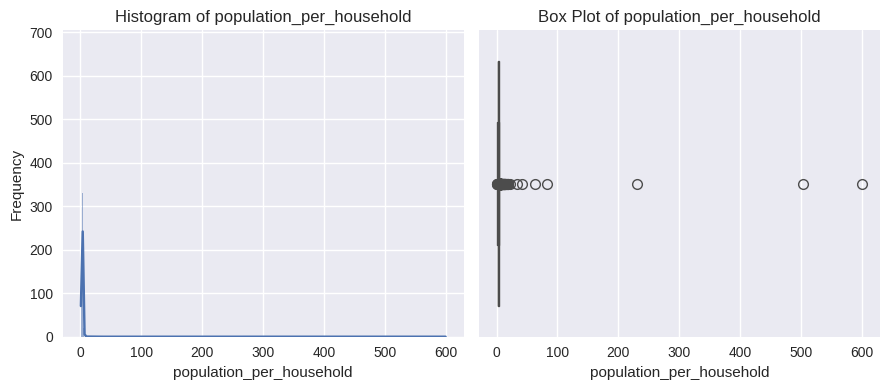

In [ ]:
visual_distribution(df, "population_per_household")

In [ ]:
# Show df when `population_per_household` is more than 50
df[df['population_per_household'] > 50]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,room_per_household,population_per_household,bedrooms_ratio,income_household,income_to_rooms_ratio,income_to_population_ratio,county,proximity_ordinal,income_level,housing_age_category,room_size_category,pop_density_category,income_to_value_ratio
2558,-120.70,35.32,46.0,118.0,17.0,6532.0,13.0,4.2639,NEAR OCEAN,350000.0,9.076923,502.461538,0.144068,0.327992,0.036135,0.000653,San Luis Obispo,2,3,5,5,5,0.121826
3483,-117.33,33.97,8.0,152.0,19.0,1275.0,20.0,1.6250,INLAND,162500.0,7.600000,63.750000,0.125000,0.081250,0.010691,0.001275,Orange,5,1,1,4,5,0.100000
5367,-121.15,38.69,52.0,240.0,44.0,6675.0,29.0,6.1359,INLAND,225000.0,8.275862,230.172414,0.183333,0.211583,0.025566,0.000919,Sacramento,5,4,5,4,5,0.272707
7443,-118.59,34.47,5.0,538.0,98.0,8733.0,105.0,4.2391,INLAND,154600.0,5.123810,83.171429,0.182156,0.040372,0.007879,0.000485,Ventura,5,3,1,3,5,0.274198
7906,-120.51,40.41,36.0,36.0,8.0,4198.0,7.0,5.5179,INLAND,67500.0,5.142857,599.714286,0.222222,0.788271,0.153275,0.001314,Lassen,5,3,4,3,5,0.817467


#### Analisis Distribusi Populasi per Rumah Tangga

### Visualisasi Distribusi population_per_household

Visualisasi di atas menampilkan distribusi variabel `population_per_household`, yang merupakan fitur turunan hasil dari feature engineering (dihitung dengan membagi `population` dengan `households`) dan mewakili rata-rata jumlah orang yang tinggal dalam satu rumah tangga di setiap blok sensus.

#### Analisis Histogram
Histogram menunjukkan distribusi yang sangat tidak biasa dengan karakteristik berikut:

1. **Distribusi Sangat Ekstrem**: Distribusi menunjukkan kemiringan positif yang sangat ekstrem, dengan konsentrasi data yang sangat tinggi pada rentang nilai rendah (sekitar 2-4 orang per rumah tangga).

2. **Puncak Tajam**: Terdapat puncak yang sangat tajam di sekitar nilai 2-3, menunjukkan bahwa sebagian besar blok sensus memiliki ukuran rumah tangga rata-rata yang konsisten pada rentang ini.

3. **Ekor yang Sangat Panjang**: Distribusi memiliki ekor yang luar biasa panjang ke kanan, dengan beberapa nilai ekstrem mencapai hingga 600 orang per rumah tangga, yang tentunya bukan merupakan ukuran rumah tangga yang realistis.

4. **Potensi Anomali Data**: Nilai-nilai yang sangat tinggi (>10) kemungkinan besar merupakan anomali data atau kesalahan, karena rumah tangga normal biasanya tidak memiliki jumlah anggota sebanyak itu.

#### Analisis Box Plot
Box plot memberikan informasi yang lebih jelas tentang distribusi:

1. **Median**: Garis tengah dalam box menunjukkan median sekitar 2.8 orang per rumah tangga, yang merupakan ukuran rumah tangga yang realistis.

2. **IQR (Interquartile Range)**: Box yang relatif kecil menunjukkan bahwa 50% dari data terkonsentrasi pada rentang sempit, antara sekitar 2.4 hingga 3.3 orang per rumah tangga.

3. **Outlier Ekstrem**: Terdapat banyak outlier di luar whisker atas, dengan beberapa outlier sangat ekstrem mencapai nilai 300 hingga 600, yang jelas merupakan anomali data.

4. **Distribusi Utama yang Wajar**: Jika mengabaikan outlier, distribusi utama (antara whisker bawah dan atas) sebenarnya cukup masuk akal dan mencerminkan ukuran rumah tangga tipikal, yaitu antara 0.75 hingga sekitar 6 orang per rumah tangga.


### i. `room_per_household`

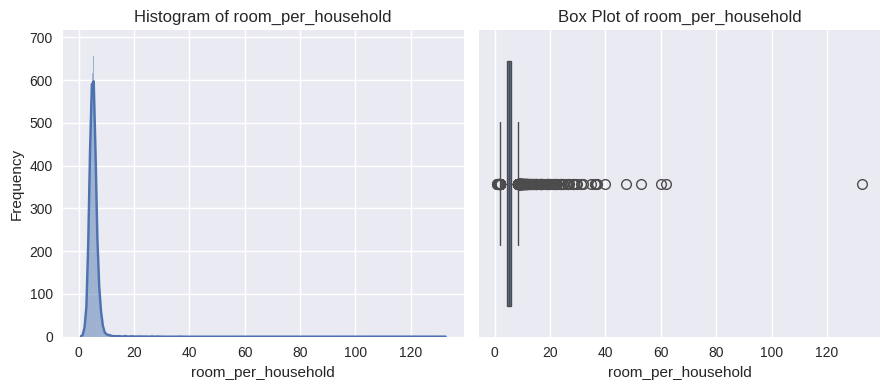

In [ ]:
visual_distribution(df, "room_per_household")

#### Analisis Distribusi Ruangan per Rumah Tangga

### Visualisasi Distribusi room_per_household

Visualisasi di atas menampilkan distribusi variabel `room_per_household`, yang merupakan fitur turunan hasil feature engineering (dihitung dengan membagi `total_rooms` dengan `households`) dan menunjukkan rata-rata jumlah ruangan per rumah tangga di setiap blok sensus.

#### Analisis Histogram
Histogram menunjukkan distribusi yang sangat mirip dengan `population_per_household` dengan karakteristik berikut:

1. **Distribusi Sangat Condong ke Kanan**: Distribusi menunjukkan kemiringan positif yang sangat ekstrem, dengan konsentrasi data yang sangat tinggi pada rentang nilai rendah (sekitar 4-7 ruangan per rumah tangga).

2. **Puncak Tajam**: Terdapat puncak yang sangat tajam di sekitar nilai 5-6 ruangan per rumah tangga, yang mewakili ukuran rumah yang umum di California.

3. **Ekor yang Sangat Panjang**: Distribusi memiliki ekor yang sangat panjang ke kanan, dengan beberapa nilai ekstrem mencapai lebih dari 120 ruangan per rumah tangga, yang tentunya tidak mewakili rumah tangga biasa.

4. **Frekuensi Menurun Drastis**: Terjadi penurunan yang sangat drastis dalam frekuensi setelah sekitar 10 ruangan per rumah tangga, dengan hampir tidak ada blok sensus yang memiliki nilai di atas 20 (kecuali outlier).

#### Analisis Box Plot
Box plot memberikan informasi yang lebih jelas tentang distribusi:

1. **Median**: Garis tengah dalam box menunjukkan median sekitar 5.23 ruangan per rumah tangga, yang merupakan ukuran rumah yang realistis.

2. **IQR (Interquartile Range)**: Box yang relatif kecil menunjukkan bahwa 50% dari data terkonsentrasi pada rentang sempit, antara sekitar 4.5 hingga 6 ruangan per rumah tangga.

3. **Outlier Ekstrem**: Terdapat banyak outlier di luar whisker atas, dengan beberapa outlier sangat ekstrem mencapai nilai lebih dari 100 ruangan per rumah tangga.

4. **Distribusi Utama yang Wajar**: Jika mengabaikan outlier, distribusi utama (antara whisker bawah dan atas) mencerminkan ukuran rumah yang masuk akal, yaitu antara sekitar 1 hingga 10 ruangan per rumah tangga.


### j. `bedrooms_ratio`

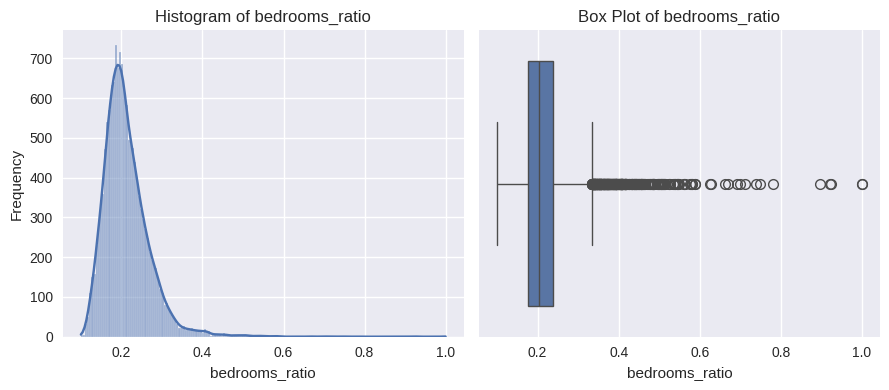

In [ ]:
visual_distribution(df, "bedrooms_ratio")

#### Analisis Distribusi Rasio Kamar Tidur

### Visualisasi Distribusi bedrooms_ratio

Visualisasi di atas menampilkan distribusi variabel `bedrooms_ratio`, yang merupakan fitur turunan hasil feature engineering (dihitung dengan membagi `total_bedrooms` dengan `total_rooms`) dan menunjukkan proporsi ruangan yang merupakan kamar tidur di setiap blok sensus.

#### Analisis Histogram
Histogram menunjukkan distribusi rasio kamar tidur dengan karakteristik berikut:

1. **Distribusi Condong ke Kanan**: Distribusi menunjukkan kemiringan positif, meskipun tidak seekstrem variabel rasio lainnya seperti `room_per_household` atau `population_per_household`.

2. **Puncak Jelas**: Terdapat puncak yang jelas di sekitar nilai 0.2 (20%), yang menunjukkan bahwa di sebagian besar properti di California, sekitar 1/5 dari total ruangan adalah kamar tidur.

3. **Konsentrasi pada Rentang 0.1-0.3**: Sebagian besar blok sensus memiliki rasio kamar tidur antara 10% hingga 30%, yang merupakan proporsi yang masuk akal untuk rumah-rumah tipikal.

4. **Nilai Outlier**: Terdapat beberapa outlier dengan rasio mencapai 1.0 (100%), yang berarti semua ruangan adalah kamar tidur, yang mungkin merepresentasikan kasus khusus seperti asrama atau jenis akomodasi khusus lainnya.

5. **Penurunan Tajam Setelah 0.3**: Frekuensi menurun dengan cepat setelah rasio 0.3, menunjukkan bahwa sangat jarang bagi properti memiliki lebih dari 30% ruangan sebagai kamar tidur.

#### Analisis Box Plot
Box plot memberikan informasi tambahan tentang distribusi:

1. **Median**: Garis tengah dalam box menunjukkan median sekitar 0.21, mengkonfirmasi bahwa sekitar 21% ruangan di rumah tipikal adalah kamar tidur.

2. **IQR (Interquartile Range)**: Box menunjukkan bahwa 50% dari data berada antara sekitar 0.18 (Q1) dan 0.24 (Q3), yang merupakan rentang yang cukup sempit dan menunjukkan konsistensi dalam desain rumah.

3. **Outlier**: Terdapat beberapa outlier di luar whisker atas, termasuk nilai-nilai ekstrem mendekati 1.0, yang mungkin merupakan kasus-kasus khusus atau anomali data.

4. **Whisker Bawah**: Whisker bawah mencapai sekitar 0.1, menunjukkan bahwa sangat jarang bagi rumah memiliki kurang dari 10% ruangan sebagai kamar tidur.


### k. `income_household`

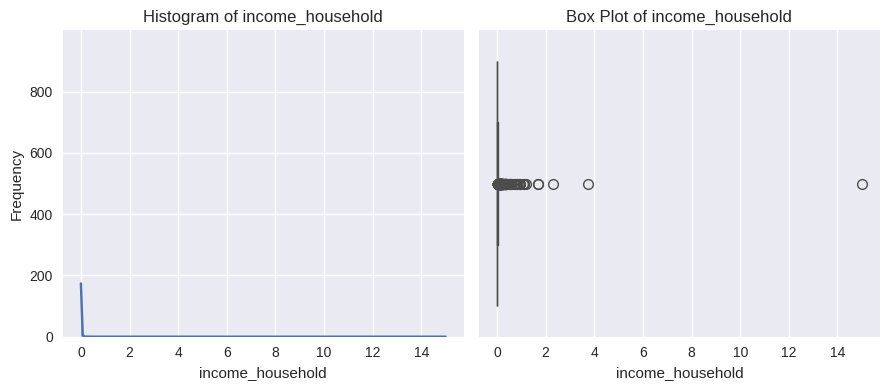

In [ ]:
visual_distribution(df, "income_household")

#### Analisis Distribusi Pendapatan per Rumah Tangga

### Visualisasi Distribusi income_household

Visualisasi di atas menampilkan distribusi variabel `income_household`, yang merupakan fitur turunan hasil feature engineering (dihitung dengan membagi `median_income` dengan `households`) dan dimaksudkan untuk menggambarkan pendapatan rata-rata per rumah tangga di setiap blok sensus.

#### Analisis Histogram
Histogram menunjukkan pola distribusi yang sangat tidak biasa dan bermasalah:

1. **Distribusi Sangat Tidak Normal**: Distribusi menunjukkan konsentrasi ekstrem pada nilai yang sangat kecil (mendekati 0), dengan hampir semua data terkonsentrasi di ujung kiri histogram.

2. **Skala Nilai yang Tidak Konsisten**: Berdasarkan statistik deskriptif sebelumnya, nilai rata-rata `income_household` adalah sekitar 0.016 dengan standar deviasi 0.14, yang menunjukkan skala nilai yang sangat kecil dan tidak konsisten dengan interpretasi yang dimaksudkan.

3. **Tidak Ada Pola yang Bermakna**: Histogram hampir tidak menunjukkan pola distribusi yang bermakna karena konsentrasi data yang ekstrem, membuat visualisasi ini kurang informatif.

4. **Potensi Kesalahan Konseptual**: Pola ini menunjukkan bahwa mungkin ada kesalahan konseptual dalam perhitungan atau interpretasi variabel ini, karena nilai-nilai yang sangat kecil tidak konsisten dengan pendapatan per rumah tangga yang sebenarnya.

#### Analisis Box Plot
Box plot memberikan informasi tambahan yang mengkonfirmasi masalah dengan variabel ini:

1. **Box yang Hampir Tidak Terlihat**: Box plot menunjukkan box yang hampir tidak terlihat karena range data yang sangat kecil, dengan hampir semua data terkonsentrasi pada nilai mendekati 0.

2. **Outlier Ekstrem**: Terdapat beberapa outlier yang sangat jauh dari distribusi utama, mencapai nilai hingga 15, yang menunjukkan perbedaan skala yang sangat besar.

3. **Distribusi yang Tidak Bermakna**: Box plot mengkonfirmasi bahwa distribusi variabel ini tidak bermakna dalam bentuk saat ini dan memerlukan peninjauan ulang.


### l. `income_level`

<Axes: xlabel='income_level'>

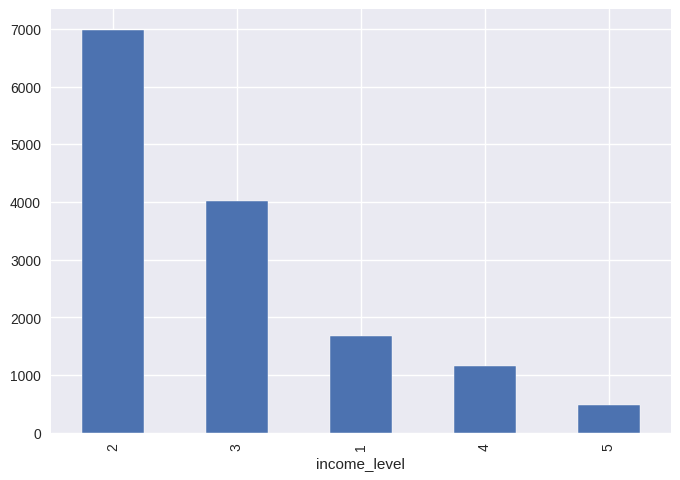

In [ ]:
# showing bar plot for income_level
df['income_level'].value_counts().plot(kind='bar', grid=True)

#### Analisis Distribusi Kategori Pendapatan

### Visualisasi Distribusi income_level

Visualisasi di atas menampilkan distribusi variabel kategoris `income_level`, yang merupakan hasil binning dari variabel `median_income` yang dilakukan selama proses feature engineering. Variabel ini mengkategorikan blok sensus berdasarkan tingkat pendapatan median rumah tangga menjadi 5 kategori.

#### Interpretasi Bar Plot
Bar plot menunjukkan distribusi blok sensus di setiap kategori pendapatan dengan pola yang informatif:

1. **Dominasi Pendapatan Rendah (Kategori 2)**: Mayoritas blok sensus (sekitar 7,000 blok) termasuk dalam kategori pendapatan 2 (rendah), yang mencakup pendapatan median antara $20,000 - $40,000 per tahun.

2. **Distribusi Tidak Merata**: Terdapat ketidakseimbangan yang signifikan antar kategori pendapatan, dengan kategori 2 yang sangat dominan, diikuti oleh kategori 3, dan semakin sedikit di kategori yang lebih tinggi.

3. **Pendapatan Menengah (Kategori 3)**: Sekitar 4,000 blok sensus berada dalam kategori pendapatan menengah ($40,000 - $60,000), menjadikannya kategori dengan frekuensi tertinggi kedua.

4. **Pendapatan Sangat Rendah (Kategori 1)**: Grafik menunjukkan bahwa kategori 1 (pendapatan sangat rendah, di bawah $20,000) memang ada dan memiliki sekitar 1,700 blok sensus, lebih banyak dari kategori 4 dan 5.

5. **Pendapatan Tinggi (Kategori 4)**: Sekitar 1,200 blok sensus termasuk dalam kategori pendapatan tinggi ($60,000 - $80,000).

6. **Pendapatan Sangat Tinggi (Kategori 5)**: Hanya sekitar 500 blok sensus yang termasuk dalam kategori pendapatan sangat tinggi (di atas $80,000), menjadikannya kategori dengan frekuensi terendah.


### m. ocean_proximity

<Axes: xlabel='ocean_proximity'>

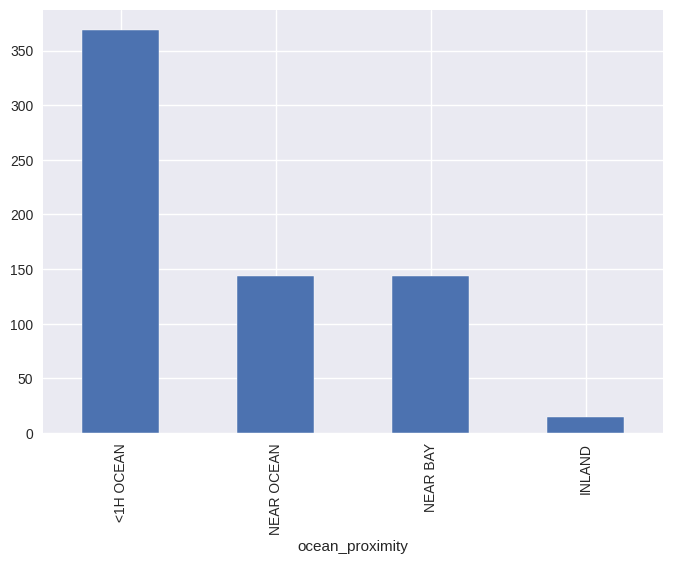

In [ ]:
# Showing high_price bar chart by `ocean_proximity`
high_price['ocean_proximity'].value_counts().plot(kind='bar', grid=True)

#### Analisis Kedekatan dengan Laut dan Harga Tinggi

### Visualisasi Distribusi Properti Berharga Tinggi Berdasarkan ocean_proximity

Visualisasi di atas menampilkan distribusi properti dengan harga tinggi (high_price) berdasarkan kategori `ocean_proximity`, yang menunjukkan lokasi properti relatif terhadap samudra atau teluk.

#### Interpretasi Bar Plot
Bar plot ini memberikan wawasan penting tentang bagaimana kedekatan dengan badan air berhubungan dengan properti bernilai tinggi di California:

1. **Dominasi Kategori "<1H OCEAN"**: Properti yang berada dalam jarak kurang dari 1 jam berkendara dari laut (`<1H OCEAN`) mendominasi jumlah properti bernilai tinggi, dengan sekitar 370 properti. Ini secara signifikan lebih tinggi dibandingkan kategori lainnya.

2. **Kategori "NEAR OCEAN" dan "NEAR BAY"**: Kedua kategori ini memiliki jumlah properti bernilai tinggi yang hampir setara, masing-masing sekitar 145 properti. Hal ini menunjukkan bahwa kedekatan dengan teluk (seperti Teluk San Francisco) mungkin sama berharganya dengan kedekatan langsung dengan samudra.

3. **Kategori "INLAND" Terendah**: Properti pedalaman (`INLAND`) yang jauh dari laut atau teluk memiliki jumlah properti bernilai tinggi yang sangat rendah, hanya sekitar 15 properti. Ini mengindikasikan korelasi yang kuat antara kedekatan air dan nilai properti tinggi.

4. **Tidak Ada Kategori "ISLAND"**: Dalam grafik ini, tidak terlihat properti bernilai tinggi untuk kategori "ISLAND" (pulau), yang mungkin karena jumlahnya yang sangat sedikit atau tidak ada sama sekali dalam subset properti bernilai tinggi.


## Correlation

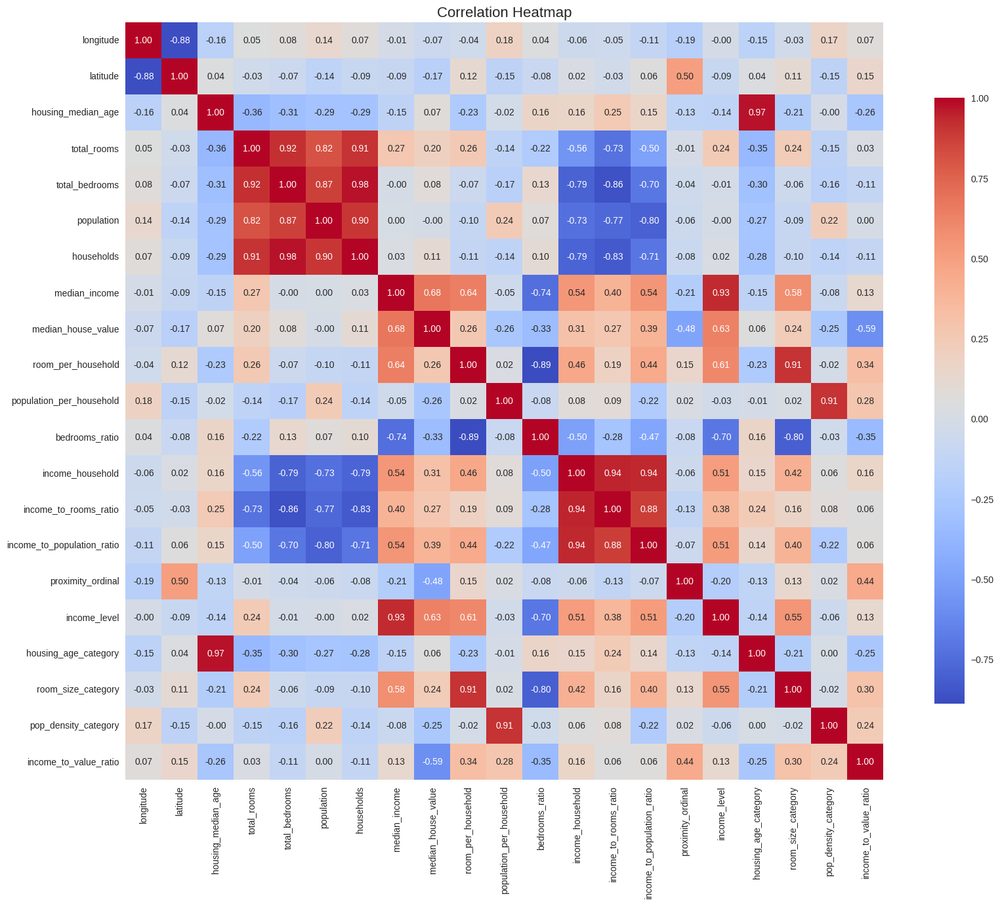

In [ ]:
# calculate correlation matrix
numeric_cols = df.select_dtypes(include=['number']).columns
df_corr = df[numeric_cols].corr(method="spearman")

# display correlation matrix
plt.figure(figsize=(20, 15))
sns.heatmap(df_corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})

plt.title('Correlation Heatmap', fontsize=16)
plt.show()

Berdasarkan heatmap korelasi yang ditampilkan, berikut adalah beberapa pola dan hubungan penting yang dapat diidentifikasi:

**Korelasi dengan Nilai Rumah (median_house_value)**

1. Pendapatan dan Nilai Rumah:

  - Median income memiliki korelasi positif kuat (0.68) dengan nilai rumah, menunjukkan pendapatan adalah faktor signifikan yang mempengaruhi harga properti.
  - Income level juga menunjukkan korelasi positif kuat (0.63) dengan nilai rumah.


2. Lokasi dan Nilai Rumah:

  - Proximity_ordinal memiliki korelasi negatif sedang (-0.48) dengan nilai rumah, artinya semakin dekat dengan laut (nilai ordinal lebih rendah), semakin tinggi nilai properti.
  - Latitude memiliki korelasi negatif lemah (-0.17) dengan nilai rumah, menunjukkan properti di selatan California cenderung lebih mahal.


3. Karakteristik Properti dan Nilai Rumah:

  - Room_per_household menunjukkan korelasi positif lemah (0.26) dengan nilai rumah.
  - Bedrooms_ratio memiliki korelasi negatif moderat (-0.33), mengindikasikan bahwa rumah dengan proporsi kamar tidur lebih besar dari total ruangan justru cenderung lebih murah.



**Kelompok Variabel yang Saling Berkorelasi Kuat**

1. Variabel Ukuran Rumah:

  - Total_rooms, total_bedrooms, population, dan households menunjukkan korelasi positif sangat kuat (0.87-0.98) satu sama lain, menunjukkan bahwa mereka saling terkait sebagai indikator ukuran rumah/kompleks perumahan.


2. Variabel Pendapatan dan Rasionya:

  - Income_household, income_to_rooms_ratio, dan income_to_population_ratio memiliki korelasi positif sangat kuat (0.88-0.94), menunjukkan bahwa mereka mengukur aspek yang serupa dari kemampuan ekonomi.


3. Umur Perumahan:

  - Housing_median_age dan housing_age_category memiliki korelasi hampir sempurna (0.97), yang logis karena variabel kedua diturunkan dari yang pertama.


4. Kategori Ukuran Ruangan:

  - Room_size_category berkorelasi kuat (0.91) dengan room_per_household, menunjukkan bahwa kategori ukuran ruangan sebagian besar ditentukan oleh rasio ruangan per rumah tangga.



**Korelasi Negatif yang Signifikan**

1. Bedrooms_ratio dengan Income Metrics:

  - Bedrooms_ratio berkorelasi negatif kuat (-0.70 hingga -0.80) dengan income_household dan income_level, menunjukkan bahwa area dengan proporsi kamar tidur tinggi cenderung memiliki tingkat pendapatan lebih rendah.


2. Variabel Pendapatan dengan Total Rooms:

  - Income metrics berkorelasi negatif (-0.56 hingga -0.73) dengan total_rooms, menunjukkan bahwa perumahan dengan banyak kamar total cenderung memiliki pendapatan per ruangan yang lebih rendah.


3. Income_to_value_ratio dengan Nilai Rumah:

  - Income_to_value_ratio berkorelasi negatif (-0.59) dengan nilai rumah, mengindikasikan bahwa properti mahal cenderung memiliki rasio pendapatan-ke-nilai yang lebih rendah (kurang terjangkau).



**Hubungan Geografis**

1. Longitude dan Latitude:

  - Korelasi negatif kuat (-0.88) antara longitude dan latitude mencerminkan bentuk geografis California yang memanjang dari barat laut ke tenggara.


2. Latitude dan Proximity_ordinal:

  - Korelasi positif moderat (0.50) antara latitude dan proximity_ordinal menunjukkan bahwa daerah selatan California cenderung lebih dekat ke laut.



**Insight Penting untuk Analisis Properti**

1. Indikator Nilai Properti Tertinggi:

  - Median_income (0.68), income_level (0.63), dan proximity_ordinal (-0.48) adalah tiga prediktor terkuat untuk nilai rumah.


2. Affordability Metric:

  - Income_to_value_ratio dapat digunakan sebagai metrik keterjangkauan, dengan korelasi negatif (-0.59) terhadap nilai rumah menunjukkan bahwa daerah mahal umumnya kurang terjangkau.


3. Pengaruh Karakteristik Demografis:

  - Population_per_household dan pop_density_category menunjukkan korelasi lemah dengan nilai rumah, menunjukkan bahwa kepadatan populasi bukanlah faktor utama dalam menentukan harga properti di California.

## Multicollinearity

In [ ]:
# Check multicollinearity with VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df):
    vif = pd.DataFrame()
    vif["Features"] = df.columns
    vif["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif

# Calculate VIF
vif_table = calculate_vif(df[numeric_cols])
vif_table

,Features,VIF
0,longitude,1085.969915
1,latitude,754.903597
2,housing_median_age,100.434748
3,total_rooms,47.351118
4,total_bedrooms,130.730334
5,population,29.416986
6,households,142.945863
7,median_income,55.298757
8,median_house_value,26.478056
9,room_per_household,13.900031


**Masalah Kritis:**

- Multikolinearitas Tinggi: Fitur longitude dan latitude menunjukkan nilai VIF yang sangat tinggi (1085.97 dan 754.90), mengindikasikan multikolinearitas yang sangat parah. Ini menunjukkan bahwa kedua variabel ini sangat berkorelasi satu sama lain.
- Variabel Geografis: Korelasi ekstrem ini disebabkan bentuk geografis California yang memanjang dari barat laut ke tenggara, sehingga koordinat geografis ini secara alami saling terkait.

**Perhatian Sedang:**

- Variabel Struktur Rumah: Fitur seperti total_rooms (47.35), total_bedrooms (130.73), dan households (142.95) juga menunjukkan nilai VIF tinggi, mengindikasikan potensi masalah dalam analisis regresi.
- Variabel Pendapatan: median_income (55.30) dan income_level (61.11) menunjukkan multikolinearitas tinggi karena keduanya mengukur aspek yang serupa dari kemampuan ekonomi penghuni.
- Umur Perumahan: housing_median_age (100.43) dan housing_age_category (139.85) hampir sempurna berkorelasi karena variabel kedua diturunkan dari yang pertama.

**Multikolinearitas Rendah:**

- Rasio per Rumah Tangga: Fitur seperti population_per_household (1.31) memiliki nilai VIF rendah, menunjukkan bahwa variabel ini relatif independen dari variabel lainnya.
- Rasio Pendapatan: income_to_population_ratio (3.59) dan income_to_rooms_ratio (4.96) menunjukkan multikolinearitas moderat, menjadikannya kandidat baik untuk model prediktif.
- Pendapatan per Rumah Tangga: income_household (5.16) juga menunjukkan multikolinearitas yang cukup rendah.

**Kesimpulan:**

- Dataset menunjukkan multikolinearitas signifikan, terutama pada variabel longitude, latitude, total_bedrooms, dan households.
- Untuk mengatasi masalah ini, beberapa pendekatan dapat dilakukan:

  - Seleksi fitur: Memilih fitur dengan VIF rendah seperti population_per_household dan income_to_population_ratio
  - Reduksi dimensi: Menggunakan teknik seperti PCA untuk mengurangi dimensionalitas dataset
  - Teknik regularisasi: Menerapkan metode seperti Ridge atau Lasso untuk menstabilkan koefisien regresi


- Fitur yang sangat berkorelasi harus dipertimbangkan dengan hati-hati dalam model prediktif, karena dapat menghasilkan error standar yang membesar dan estimasi koefisien yang tidak reliabel.
- Alternatif lain untuk mengatasi multikolinearitas adalah dengan menggunakan model berbasis pohon seperti Random Forest atau XGBoost, yang cenderung lebih tahan terhadap masalah multikolinearitas. Model pohon keputusan lainnya seperti Decision Tree juga dapat dipertimbangkan.

# D. BASE MODEL - ORIGINAL DATASET (XPERIMENT 1)

Pada eksperimen ini, saya melakukan pemodelan prediktif untuk memperkirakan nilai median rumah (`median_house_value`) di California berdasarkan dataset asli tanpa modifikasi. Tahapan yang dilakukan mencakup persiapan data, preprocessing, pembuatan model, validasi silang, evaluasi, dan analisis fitur penting.


Saya mencoba menggunakan 8 model, model-model tersebut adalah:

1. Linear Regression
2. Decision Tree
3. KNN
4. Random Forest
5. Gradient Boosting
6. XGBoost (Xtreme Gradient Boosting)
7. Support Vector Machine
8. LightGBM (Light Gradient Boosting Machine)

In [13]:
df_copy.dropna(inplace=True)

## 1. Data Split

In [14]:
X = df_copy.drop('median_house_value', axis=1)
y = df_copy['median_house_value']

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

Langkah pertama adalah memisahkan fitur (X) dan target (y), kemudian membagi dataset menjadi data training (80%) dan testing (20%) dengan strategi sampling acak yang konsisten (random_state=42). Pembagian ini memastikan model dievaluasi pada data yang belum pernah dilihat selama training.


In [15]:
numerical_features = X.select_dtypes(include=["number"]).columns
categorical_features = X.select_dtypes(include=['object']).columns

## 2. Preprocessor

Preprocessing data sangat penting untuk memastikan model dapat belajar secara efektif. Saya menggunakan ColumnTransformer untuk menerapkan transformasi yang berbeda pada fitur numerik dan kategorikal

In [16]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ])

Pemilihan RobustScaler untuk fitur numerik didasarkan pada analisis eksplorasi sebelumnya yang menunjukkan adanya outlier signifikan pada beberapa variabel seperti population_per_household dan room_per_household. Scaler ini memberikan ketahanan yang lebih baik terhadap nilai-nilai ekstrem dibandingkan dengan StandardScaler

## 3. Models

Pemilihan model mencakup:

- Model linear dasar (Linear Regression)
- Model berbasis pohon keputusan (Decision Tree, Random Forest)
- Model berbasis jarak (KNN)
- Model boosting (Gradient Boosting, XGBoost, LightGBM)
- Model berbasis kernel (SVR)

Diversitas ini memungkinkan perbandingan algoritma dengan karakteristik pembelajaran yang berbeda-beda.

In [17]:
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "KNN": KNeighborsRegressor(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "Support Vector Regression": SVR(kernel='rbf'),
    "LightGBM": LGBMRegressor(random_state=42, force_col_wise=True)
}

## 4. Cross Validation

Untuk memastikan evaluasi yang robust, saya menerapkan validasi silang 5-fold pada data training dengan empat metrik evaluasi berbeda

In [18]:
results = {}

# Define custom scorers
scorers = {
    'MAE': make_scorer(mean_absolute_error, greater_is_better=False),
    'MSE': make_scorer(mean_squared_error, greater_is_better=False),
    'RMSE': make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)), greater_is_better=False),
    'R²': make_scorer(r2_score)
}

# Loop through each model
for model_name, model in models.items():
    # Create a pipeline with preprocessing and the model
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('model', model)])

    # Perform cross-validation on training data
    cv_results = {metric: cross_val_score(pipeline, X_train, y_train, cv=5, scoring=scorer).mean()
                  for metric, scorer in scorers.items()}

    # Store the cross-validation results
    results[model_name] = {
        'CV MAE': -cv_results['MAE'],
        'CV MSE': -cv_results['MSE'],
        'CV RMSE': -cv_results['RMSE'],
        'CV R²': cv_results['R²']
    }

# Convert results to a DataFrame
cv_results_df = pd.DataFrame(results).T
cv_results_df = cv_results_df.sort_values(by='CV RMSE', ascending=True)
cv_results_df

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 11
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 11
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 11
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 11
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 11
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 11
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 11
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 11
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 11
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


,CV MAE,CV MSE,CV RMSE,CV R²
LightGBM,32646.393213,2.386927e+09,48850.687996,0.823258
XGBoost,33028.511388,2.505361e+09,50048.705279,0.814663
Random Forest,33665.552568,2.621346e+09,51195.470787,0.805884
Gradient Boosting,38482.556369,3.061275e+09,55325.080679,0.773342
KNN,42696.251860,3.929067e+09,62673.621435,0.709357
Linear Regression,49929.170280,4.723848e+09,68716.997488,0.650799
Decision Tree,45654.107729,5.087254e+09,71275.175791,0.623473
Support Vector Regression,88876.822309,1.422877e+10,119249.983767,-0.051214


Berdasarkan hasil evaluasi, LightGBM menunjukkan performa terbaik dengan RMSE terendah (48,850) dan R² tertinggi (0.82), diikuti oleh XGBoost dan Random Forest. Model ensemble berbasis pohon secara konsisten mengungguli model lainnya dalam prediksi nilai properti. SVR menunjukkan performa terburuk, kemungkinan karena parameter yang belum dioptimalkan dan kompleksitas dataset.

## 5. Visualization on Data Test

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1842
[LightGBM] [Info] Number of data points in the train set: 11448, number of used features: 11
[LightGBM] [Info] Start training from score 207167.999563


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


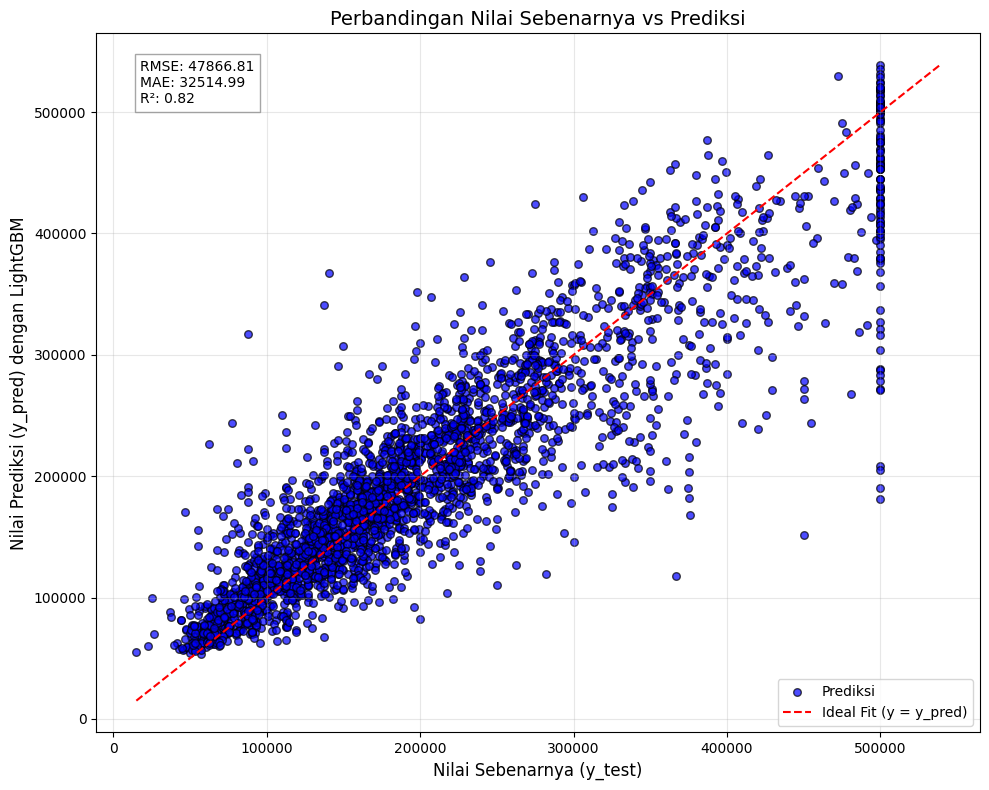

Metrik Evaluasi pada Data Test:
RMSE: 47866.81
MAE: 32514.99
R²: 0.82


In [19]:
# Import library yang diperlukan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Bagian ini diasumsikan sudah dijalankan sebelumnya (dari gambar 1 dan 2)
# Sehingga kita memiliki model, X_test, y_test, dan preprocessor yang sudah dilatih

# Buat pipeline untuk prediksi
pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', models["LightGBM"])])

# Latih pipeline dengan data training
pipeline.fit(X_train, y_train)

# Prediksi nilai pada data test
y_test_pred = pipeline.predict(X_test)

# Hitung metrik evaluasi
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mae = mean_absolute_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Visualisasi hasil prediksi vs nilai sebenarnya
plt.figure(figsize=(10, 8))

# Scatter plot
plt.scatter(y_test, y_test_pred, color='blue', alpha=0.7, edgecolors='k', s=30, label='Prediksi')

# Garis ideal (y = y_pred)
min_val = min(y_test.min(), y_test_pred.min())
max_val = max(y_test.max(), y_test_pred.max())
plt.plot([min_val, max_val], [min_val, max_val], '--r', label='Ideal Fit (y = y_pred)')

# Tambahkan label, judul, dan legenda
plt.xlabel('Nilai Sebenarnya (y_test)', fontsize=12)
plt.ylabel('Nilai Prediksi (y_pred) dengan LightGBM', fontsize=12)
plt.title('Perbandingan Nilai Sebenarnya vs Prediksi', fontsize=14)
plt.legend(fontsize=10)

# Tambahkan metrik evaluasi ke plot
plt.text(
    0.05, 0.9,
    f"RMSE: {test_rmse:.2f}\nMAE: {test_mae:.2f}\nR²: {test_r2:.2f}",
    fontsize=10,
    transform=plt.gca().transAxes,
    bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray')
)

# Tambahkan grid untuk mempermudah pembacaan
plt.grid(alpha=0.3)

# Tampilkan plot
plt.tight_layout()
plt.show()

# Opsional: Tampilkan hasil metrik evaluasi
print(f"Metrik Evaluasi pada Data Test:")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAE: {test_mae:.2f}")
print(f"R²: {test_r2:.2f}")

Setelah mengidentifikasi LightGBM sebagai model terbaik, model ini dilatih ulang pada seluruh data training dan dievaluasi pada data testing. Scatter plot prediksi vs nilai sebenarnya menunjukkan:

- Sebagian besar prediksi berada dekat dengan garis fit ideal (garis merah putus-putus)
- Model cenderung memprediksi dengan baik untuk rumah dengan nilai menengah (100,000-300,000)
- Terdapat beberapa outlier prediksi, terutama untuk rumah bernilai sangat tinggi (>400,000)
- Prediksi untuk properti bernilai sekitar 500,000 menunjukkan penyebaran vertikal yang signifikan, menandakan kesulitan model dalam memprediksi properti premium

Metrik evaluasi pada data testing menunjukkan performa yang baik:

- RMSE: 47,866.81
- MAE: 32,514.99
- R²: 0.82

## 6. Save Model (Pickle)

In [20]:
import joblib

# Save the entire pipeline (including preprocessor and model) to a .pkl file
joblib.dump(pipeline, "Best_LightGBM_Model.pkl")
print("Best_LightGBM_Model.pkl'")

# Load the model later (example code for reference)
# loaded_model = joblib.load("best_lightgbm_model.pkl")

Best_LightGBM_Model.pkl'


## 7. Feature Importance

Feature ranking:
1. median_income (0.494093)
2. ocean_proximity_INLAND (0.137822)
3. longitude (0.106234)
4. latitude (0.101620)
5. housing_median_age (0.053898)
6. population (0.031378)
7. total_rooms (0.024135)
8. total_bedrooms (0.021981)
9. households (0.018106)
10. ocean_proximity_NEAR OCEAN (0.007247)
11. ocean_proximity_<1H OCEAN (0.002278)
12. ocean_proximity_NEAR BAY (0.001160)
13. ocean_proximity_ISLAND (0.000050)


<ipython-input-21-1a41628a0941>:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Importance', y='Feature', data=plot_df, palette='viridis')


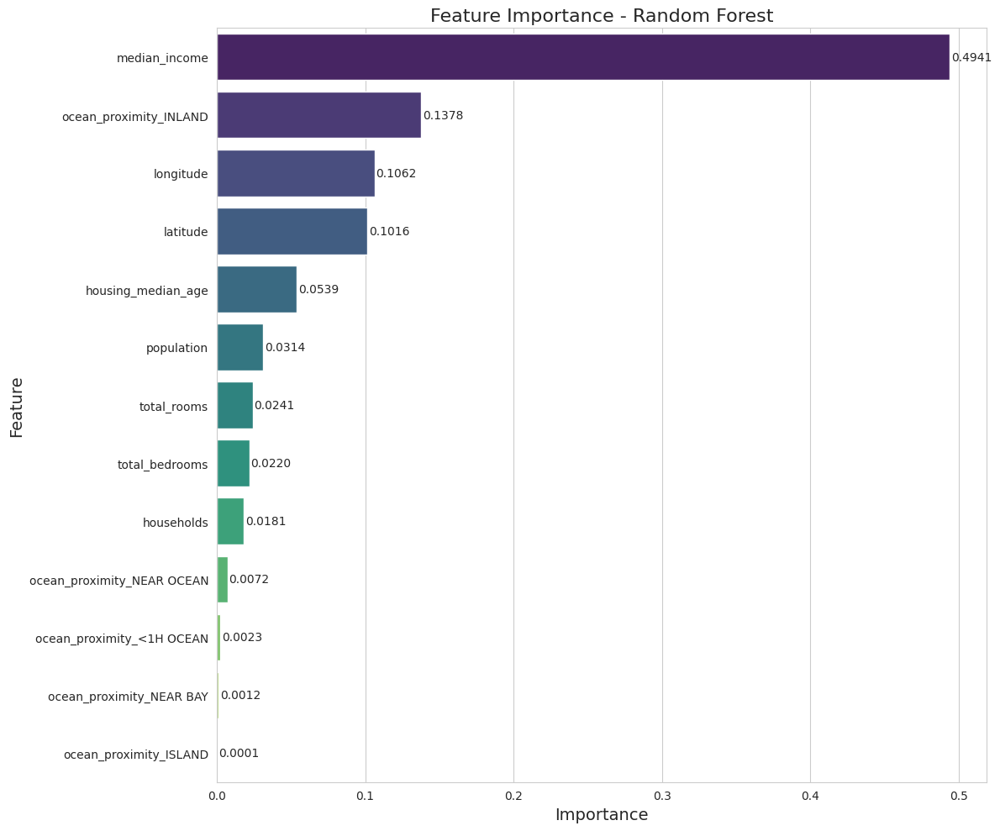

In [21]:
# 1. Impor library yang diperlukan
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

# 2. Pisahkan fitur dan target
y = df_copy['median_house_value']  # Kolom target adalah median_house_value
X = df_copy.drop('median_house_value', axis=1)  # Semua kolom lain adalah fitur

# Identifikasi kolom kategorikal dan numerik
X_numeric = X.select_dtypes(include=['number']).columns.tolist()
X_categorical = X.select_dtypes(exclude=['number']).columns.tolist()

# 3. Buat pipeline dengan preprocessing yang sesuai
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', X_numeric),
        ('cat', OneHotEncoder(handle_unknown='ignore'), X_categorical)
    ],
    remainder='drop'  # Tambahkan ini untuk menangani kolom yang tidak tercantum
)

# 4. Buat dan latih model dengan preprocessing yang tepat
rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', RandomForestRegressor(random_state=42))
])

# 5. Latih model
rf_pipeline.fit(X, y)

# 6. Dapatkan feature names setelah preprocessing
# Perlu berhati-hati dengan format output dari get_feature_names_out
feature_names = []

# Tambahkan nama fitur numerik
feature_names.extend(X_numeric)

# Tambahkan nama fitur kategorikal yang sudah di-one-hot encoded
if X_categorical:  # Periksa jika ada fitur kategorikal
    ohe_feature_names = rf_pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(X_categorical)
    feature_names.extend(ohe_feature_names)

# 7. Dapatkan feature importances
importances = rf_pipeline.named_steps['model'].feature_importances_

# 8. Urutkan berdasarkan importance
features_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
})
features_importance_df = features_importance_df.sort_values('Importance', ascending=False)

# 9. Print feature ranking
print("Feature ranking:")
for i, (feature, importance) in enumerate(zip(features_importance_df['Feature'], features_importance_df['Importance'])):
    print(f"{i+1}. {feature} ({importance:.6f})")

# 10. Visualisasi feature importance dengan horizontal bar chart
plt.figure(figsize=(12, 10))

# Ambil 15 feature teratas untuk visualisasi yang lebih jelas
if len(features_importance_df) > 15:
    plot_df = features_importance_df.head(15)
else:
    plot_df = features_importance_df

# Plot horizontal bar chart
sns.set_style('whitegrid')
ax = sns.barplot(x='Importance', y='Feature', data=plot_df, palette='viridis')
ax.set_title('Feature Importance - Random Forest', fontsize=16)
ax.set_xlabel('Importance', fontsize=14)
ax.set_ylabel('Feature', fontsize=14)

# Tambahkan nilai di setiap bar
for i, v in enumerate(plot_df['Importance']):
    ax.text(v + 0.001, i, f'{v:.4f}', va='center', fontsize=10)

plt.tight_layout()
plt.show()

## RandomizedSearchCV

In [ ]:
# Custom scorer definitions
def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Custom scorers for GridSearchCV
mse_scorer = make_scorer(mse, greater_is_better=False)
mae_scorer = make_scorer(mae, greater_is_better=False)
rmse_scorer = make_scorer(rmse, greater_is_better=False)
r2_scorer = make_scorer(r2_score, greater_is_better=True)

# Scoring dictionary with only positive metrics
scoring = {
    "mse": mse_scorer,
    "mae": mae_scorer,
    "rmse": rmse_scorer,
    "r2": r2_scorer
}

# Define the parameter grid for Random Forest
param_grid = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [None, 10, 20],
    'model__max_features': ['auto', 'sqrt'],
    'model__min_samples_split': [2, 5],
    'model__min_samples_leaf': [1, 2],
    'model__bootstrap': [True, False]
}

# Create the Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Pipeline (pastikan preprocessor sudah didefinisikan)
pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', rf_model)])

# Randomized Search
random_search = RandomizedSearchCV(
    pipeline,
    param_distributions=param_grid,  # tetap pakai param_grid sebagai dictionary
    n_iter=50,                        # jumlah kombinasi acak yang dicoba
    scoring=scoring,
    refit="rmse",
    cv=5,
    verbose=1,
    n_jobs=-1,
    random_state=42,
    return_train_score=True,
)

# Fit model
random_search.fit(X_train, y_train)

# Extract and format the results
cv_results = pd.DataFrame(random_search.cv_results_).sort_values("mean_test_rmse", ascending=True)
print("Best Parameters:", random_search.best_params_)

# Extract best result
best_index = random_search.best_index_

# Summary table
best_results = pd.DataFrame({
    "CV MAE": [-cv_results.loc[best_index, "mean_test_mae"]],
    "CV MSE": [-cv_results.loc[best_index, "mean_test_mse"]],
    "CV RMSE": [-cv_results.loc[best_index, "mean_test_rmse"]],
    "CV R²": [cv_results.loc[best_index, "mean_test_r2"]],
})

print("\nSummary of Best Results:")
print(best_results)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
120 fits failed out of a total of 250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
120 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py", line 662, in fit
    self._final_estimator.fit(Xt, y, *

Best Parameters: {'model__n_estimators': 300, 'model__min_samples_split': 2, 'model__min_samples_leaf': 1, 'model__max_features': 'sqrt', 'model__max_depth': None, 'model__bootstrap': False}

Summary of Best Results:
        CV MAE        CV MSE       CV RMSE     CV R²
0  33831.05848  2.584699e+09  50836.447096  0.808613


# E. BASE MODEL - DATASET AFTER FEATURE ENGINEERING (EXPERIMENT 2)

Setelah melakukan eksperimen pertama dengan dataset asli, saya melanjutkan dengan eksperimen kedua menggunakan dataset yang telah diperkaya melalui feature engineering. Tujuan eksperimen ini adalah untuk mengevaluasi apakah fitur-fitur baru yang telah dibuat dapat meningkatkan performa model dalam memprediksi nilai median rumah di California.


Saya mencoba menggunakan 8 model, model-model tersebut adalah:

1. Linear Regression
2. Decision Tree
3. KNN
4. Random Forest
5. Gradient Boosting
6. XGBoost (Xtreme Gradient Boosting)
7. Support Vector Machine
8. LightGBM (Light Gradient Boosting Machine)

## 1. Data Split

In [ ]:
X = df.drop('median_house_value', axis=1)
y = df['median_house_value']

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

In [ ]:
numerical_features = X.select_dtypes(include=["number"]).columns
categorical_features = X.select_dtypes(include=['object']).columns

## 2. Preprocessor

In [ ]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ])

## 3. Models

In [ ]:
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "KNN": KNeighborsRegressor(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "Support Vector Regression": SVR(kernel='rbf'),
    "LightGBM": LGBMRegressor(random_state=42, force_col_wise=True)
}

## 4. Cross Validation

In [ ]:
results = {}

# Define custom scorers
scorers = {
    'MAE': make_scorer(mean_absolute_error, greater_is_better=False),
    'MSE': make_scorer(mean_squared_error, greater_is_better=False),
    'RMSE': make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)), greater_is_better=False),
    'R²': make_scorer(r2_score)
}

# Loop through each model
for model_name, model in models.items():
    # Create a pipeline with preprocessing and the model
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('model', model)])

    # Perform cross-validation on training data
    cv_results = {metric: cross_val_score(pipeline, X_train, y_train, cv=5, scoring=scorer).mean()
                  for metric, scorer in scorers.items()}

    # Store the cross-validation results
    results[model_name] = {
        'CV MAE': -cv_results['MAE'],
        'CV MSE': -cv_results['MSE'],
        'CV RMSE': -cv_results['RMSE'],
        'CV R²': cv_results['R²']
    }

# Convert results to a DataFrame
cv_results_df = pd.DataFrame(results).T
cv_results_df = cv_results_df.sort_values(by='CV RMSE', ascending=True)
cv_results_df

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 65
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3733
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 64
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 65
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 67
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 65
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 65
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3733
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 64
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 65
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 67
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 65
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 65
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3733
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 64
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 65
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 67
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 65
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 65
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3733
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 64
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 65
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3739
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 67
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 3735
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 65
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


,CV MAE,CV MSE,CV RMSE,CV R²
Random Forest,2033.160739,3.433796e+07,5817.071700,0.997474
LightGBM,3365.643551,6.125795e+07,7772.853282,0.995496
Gradient Boosting,5490.742690,6.921388e+07,8311.196422,0.994894
XGBoost,4109.074902,8.750392e+07,9332.884951,0.993529
Decision Tree,4673.783582,1.013505e+08,10007.931811,0.992463
Linear Regression,29148.547119,2.004538e+09,44703.104254,0.851731
KNN,30966.909308,2.298319e+09,47933.731994,0.829770
Support Vector Regression,89055.429942,1.427323e+10,119435.913107,-0.054492


## 5. Visualization on Data Test

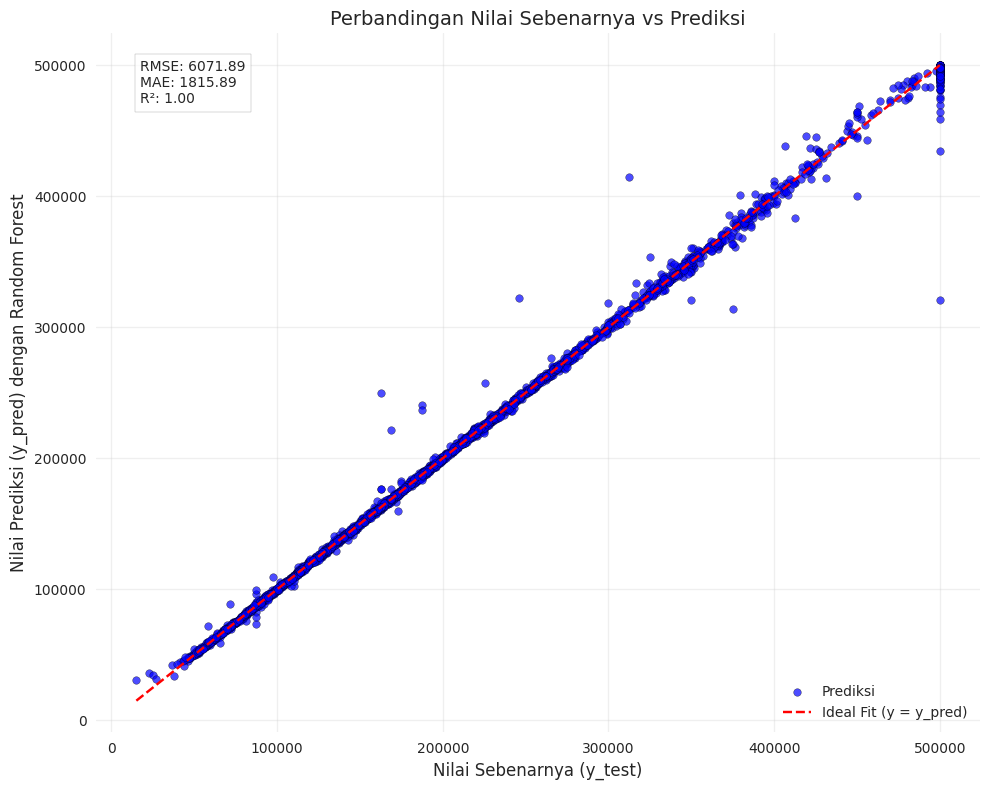

Metrik Evaluasi pada Data Test:
RMSE: 6071.89
MAE: 1815.89
R²: 1.00


In [ ]:
# Import library yang diperlukan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Bagian ini diasumsikan sudah dijalankan sebelumnya (dari gambar 1 dan 2)
# Sehingga kita memiliki model, X_test, y_test, dan preprocessor yang sudah dilatih

# Buat pipeline untuk prediksi
pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', models["Random Forest"])])

# Latih pipeline dengan data training
pipeline.fit(X_train, y_train)

# Prediksi nilai pada data test
y_test_pred = pipeline.predict(X_test)

# Hitung metrik evaluasi
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mae = mean_absolute_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Visualisasi hasil prediksi vs nilai sebenarnya
plt.figure(figsize=(10, 8))

# Scatter plot
plt.scatter(y_test, y_test_pred, color='blue', alpha=0.7, edgecolors='k', s=30, label='Prediksi')

# Garis ideal (y = y_pred)
min_val = min(y_test.min(), y_test_pred.min())
max_val = max(y_test.max(), y_test_pred.max())
plt.plot([min_val, max_val], [min_val, max_val], '--r', label='Ideal Fit (y = y_pred)')

# Tambahkan label, judul, dan legenda
plt.xlabel('Nilai Sebenarnya (y_test)', fontsize=12)
plt.ylabel('Nilai Prediksi (y_pred) dengan Random Forest', fontsize=12)
plt.title('Perbandingan Nilai Sebenarnya vs Prediksi', fontsize=14)
plt.legend(fontsize=10)

# Tambahkan metrik evaluasi ke plot
plt.text(
    0.05, 0.9,
    f"RMSE: {test_rmse:.2f}\nMAE: {test_mae:.2f}\nR²: {test_r2:.2f}",
    fontsize=10,
    transform=plt.gca().transAxes,
    bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray')
)

# Tambahkan grid untuk mempermudah pembacaan
plt.grid(alpha=0.3)

# Tampilkan plot
plt.tight_layout()
plt.show()

# Opsional: Tampilkan hasil metrik evaluasi
print(f"Metrik Evaluasi pada Data Test:")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAE: {test_mae:.2f}")
print(f"R²: {test_r2:.2f}")

## 6. Save Model (Pickle)

In [ ]:
# import joblib

# # Save the entire pipeline (including preprocessor and model) to a .pkl file
# joblib.dump(pipeline, "Best_RandomForest_Model.pkl")
# print("Best_RandomForest_Model.pkl'")

# Load the model later (example code for reference)
# loaded_model = joblib.load("best_lightgbm_model.pkl")

Best_RandomForest_Model.pkl'


## 7. Visualization of One of the DecisionTree Formed

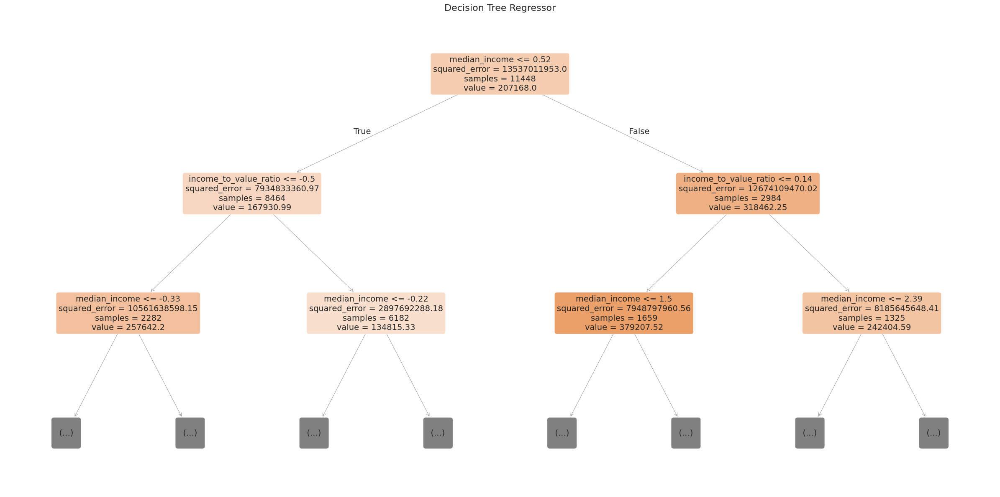

Metrik Evaluasi pada Data Test:
RMSE: 9130.51
MAE: 4002.60
R²: 0.99


In [ ]:
from sklearn.tree import plot_tree

# 1. Data Split
X = df.drop('median_house_value', axis=1)
y = df['median_house_value']

# Pisahkan fitur numerik dan kategorik
numerical_features = X.select_dtypes(include=["number"]).columns
categorical_features = X.select_dtypes(include=['object']).columns

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

# 2. Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ])

# 3. Pipeline untuk model Decision Tree saja
# Gunakan pipeline untuk menggabungkan preprocessing dan model
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', DecisionTreeRegressor(criterion='squared_error', random_state=42))
])

# Latih pipeline
pipeline.fit(X_train, y_train)

# Ambil model Decision Tree yang sudah dilatih
dt_model = pipeline.named_steps['model']

# Visualisasi pohon regresi dengan background putih
plt.figure(figsize=(24, 12), facecolor='white')

# Get feature names after transformation
cat_encoder = preprocessor.named_transformers_['cat']
if hasattr(cat_encoder, 'get_feature_names_out'):
    # scikit-learn >= 1.0
    cat_feature_names = cat_encoder.get_feature_names_out(categorical_features)
else:
    # scikit-learn < 1.0
    cat_feature_names = [f"{col}_{val}" for col in categorical_features
                         for val in cat_encoder.categories_[0][1:]]

transformed_feature_names = list(numerical_features) + list(cat_feature_names)

# Plot tree dengan warna putih dan max_depth=3
plot_tree(
    dt_model,
    filled=True,
    feature_names=transformed_feature_names,
    rounded=True,
    max_depth=2,  # Batasi kedalaman untuk visualisasi yang lebih jelas
    fontsize=14,  # Ukuran font diperbesar
    precision=2
)

plt.title("Decision Tree Regressor", fontsize=16)
plt.tight_layout()
plt.show()

# Evaluasi model pada data test
y_test_pred = pipeline.predict(X_test)

# Hitung metrik evaluasi
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mae = mean_absolute_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Tampilkan hasil metrik evaluasi
print(f"Metrik Evaluasi pada Data Test:")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAE: {test_mae:.2f}")
print(f"R²: {test_r2:.2f}")

## Feature Importance

Feature ranking:
1. median_income (0.5730)
2. income_to_value_ratio (0.4234)
3. income_level (0.0007)
4. latitude (0.0003)
5. housing_median_age (0.0003)
6. population_per_household (0.0003)
7. bedrooms_ratio (0.0003)
8. longitude (0.0003)
9. room_per_household (0.0002)
10. income_to_population_ratio (0.0002)
11. population (0.0001)
12. income_household (0.0001)
13. total_rooms (0.0001)
14. income_to_rooms_ratio (0.0001)
15. households (0.0001)
16. total_bedrooms (0.0001)
17. housing_age_category (0.0000)
18. pop_density_category (0.0000)
19. ocean_proximity_NEAR BAY (0.0000)
20. proximity_ordinal (0.0000)
21. county_Orange (0.0000)
22. county_Los Angeles (0.0000)
23. room_size_category (0.0000)
24. county_San Francisco (0.0000)
25. county_Monterey (0.0000)
26. county_Contra Costa (0.0000)
27. ocean_proximity_INLAND (0.0000)
28. county_Santa Clara (0.0000)
29. ocean_proximity_NEAR OCEAN (0.0000)
30. county_Tuolumne (0.0000)
31. county_Santa Cruz (0.0000)
32. county_Ventura (0.0000)
33.

<ipython-input-152-8088c9f49e2e>:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Importance', y='Feature', data=plot_df, palette='viridis')


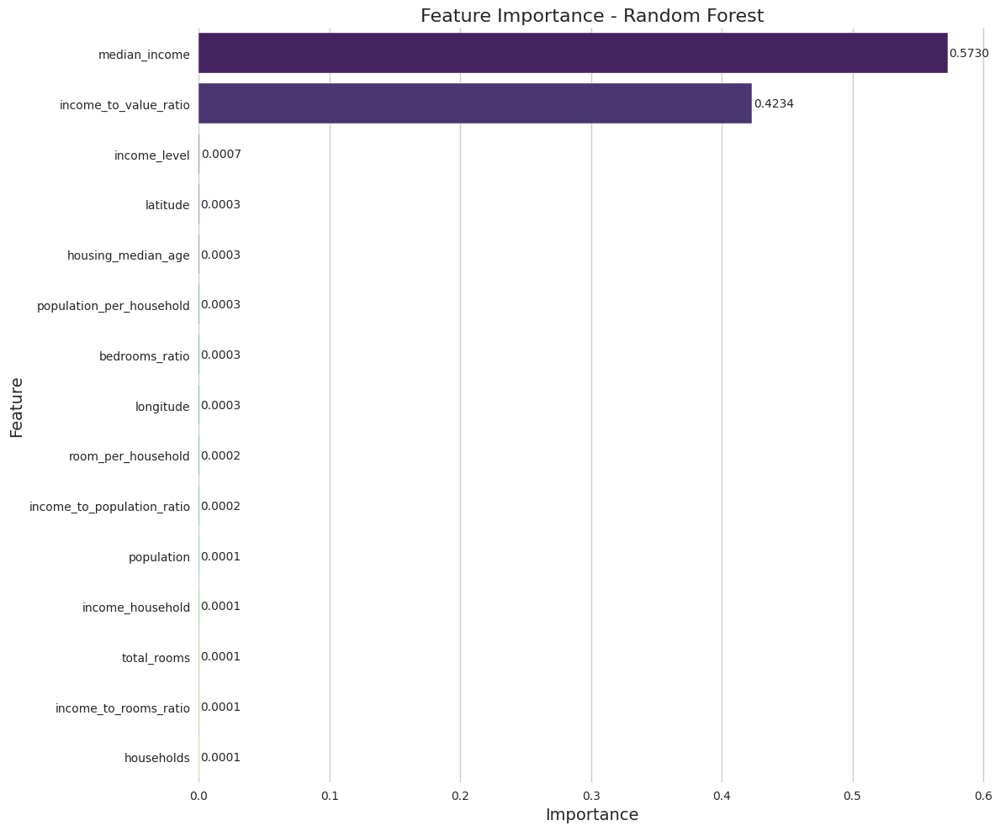

In [ ]:
# 1. Persiapkan data
X = df.drop('median_house_value', axis=1)
y = df['median_house_value']

# 2. Identifikasi fitur numerik dan kategoris
numerical_features = X.select_dtypes(include=["number"]).columns
categorical_features = X.select_dtypes(include=["object"]).columns

# 3. Buat preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ]
)

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

# 4. Buat pipeline yang menggabungkan preprocessor dan model
rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', RandomForestRegressor(random_state=42))
])

# 5. Latih pipeline (bukan model langsung)
rf_pipeline.fit(X_train, y_train)

# 6. Dapatkan feature importance
# - Pertama, dapatkan nama fitur setelah preprocessing
feature_names = []
# - Tambahkan nama fitur numerik
feature_names.extend(numerical_features)
# - Tambahkan nama fitur kategoris yang sudah di-one-hot-encode
if len(categorical_features) > 0:
    ohe_feature_names = rf_pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
    feature_names.extend(ohe_feature_names)

# 7. Dapatkan feature importance dari model
importances = rf_pipeline.named_steps['model'].feature_importances_

# 8. Buat DataFrame untuk visualisasi
features_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
})

# 9. Urutkan berdasarkan importance
features_importance_df = features_importance_df.sort_values('Importance', ascending=False)

# 10. Tampilkan hasil
print("Feature ranking:")
for i, (feature, importance) in enumerate(zip(features_importance_df['Feature'], features_importance_df['Importance'])):
    print(f"{i+1}. {feature} ({importance:.4f})")

# 11. Visualisasi feature importance dengan horizontal bar chart
plt.figure(figsize=(12, 10))

# Ambil 15 feature teratas untuk visualisasi yang lebih jelas
if len(features_importance_df) > 15:
    plot_df = features_importance_df.head(15)
else:
    plot_df = features_importance_df

# Plot horizontal bar chart
ax = sns.barplot(x='Importance', y='Feature', data=plot_df, palette='viridis')
ax.set_title('Feature Importance - Random Forest', fontsize=16)
ax.set_xlabel('Importance', fontsize=14)
ax.set_ylabel('Feature', fontsize=14)

# Tambahkan nilai di setiap bar
for i, v in enumerate(plot_df['Importance']):
    ax.text(v + 0.001, i, f'{v:.4f}', va='center', fontsize=10)

plt.tight_layout()
plt.show()

Feature ranking with permutation importance:
1. median_income: 1.3319 ± 0.0134
2. income_to_value_ratio: 1.0238 ± 0.0108
3. latitude: 0.0003 ± 0.0000
4. population_per_household: 0.0002 ± 0.0000
5. longitude: 0.0001 ± 0.0000
6. housing_median_age: 0.0001 ± 0.0000
7. bedrooms_ratio: 0.0001 ± 0.0000
8. room_per_household: 0.0001 ± 0.0000
9. income_to_population_ratio: 0.0001 ± 0.0000
10. population: 0.0001 ± 0.0000
11. total_rooms: 0.0000 ± 0.0000
12. income_household: 0.0000 ± 0.0000
13. income_level: 0.0000 ± 0.0000
14. households: 0.0000 ± 0.0000
15. income_to_rooms_ratio: 0.0000 ± 0.0000
16. total_bedrooms: 0.0000 ± 0.0000
17. county_Orange: 0.0000 ± 0.0000
18. proximity_ordinal: 0.0000 ± 0.0000
19. pop_density_category: 0.0000 ± 0.0000
20. housing_age_category: 0.0000 ± 0.0000
21. ocean_proximity_INLAND: 0.0000 ± 0.0000
22. county_San Francisco: 0.0000 ± 0.0000
23. county_Los Angeles: 0.0000 ± 0.0000
24. ocean_proximity_NEAR BAY: 0.0000 ± 0.0000
25. county_Santa Clara: 0.0000 ± 0.00

<ipython-input-153-a200cc019e57>:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Importance', y='Feature', data=plot_df, palette='viridis')


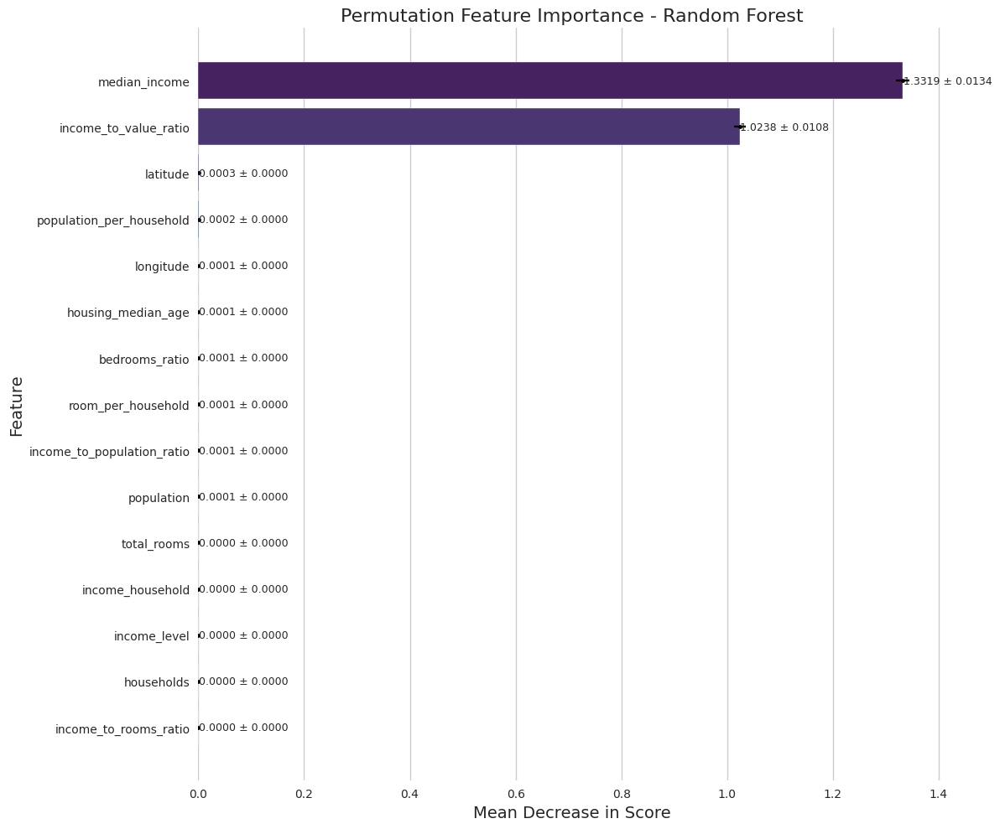

In [ ]:
# 1. Persiapkan data
X = df.drop('median_house_value', axis=1)
y = df['median_house_value']

# 2. Identifikasi fitur numerik dan kategoris
numerical_features = X.select_dtypes(include=["number"]).columns
categorical_features = X.select_dtypes(include=["object"]).columns

# 3. Buat preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ]
)

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

# 4. Buat pipeline yang menggabungkan preprocessor dan model
rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', RandomForestRegressor(random_state=42))
])

# 5. Latih pipeline
rf_pipeline.fit(X_train, y_train)

# 6. Dapatkan nama fitur setelah preprocessing
feature_names = []
# - Tambahkan nama fitur numerik
feature_names.extend(numerical_features)
# - Tambahkan nama fitur kategoris yang sudah di-one-hot-encode
if len(categorical_features) > 0:
    ohe_feature_names = rf_pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
    feature_names.extend(ohe_feature_names)

# 7. Proses data untuk permutation importance
# Transformasi data dengan preprocessor
X_train_processed = rf_pipeline.named_steps['preprocessor'].transform(X_train)
if hasattr(X_train_processed, 'toarray'):
    X_train_processed = X_train_processed.toarray()

# 8. Hitung permutation importance
from sklearn.inspection import permutation_importance

# Gunakan model yang sudah dilatih dari pipeline
model = rf_pipeline.named_steps['model']

# Jalankan permutation importance
# n_repeats: jumlah pengulangan untuk setiap permutasi, higher = more stable but slower
# random_state: untuk reproducibility hasil
perm_importance = permutation_importance(model, X_train_processed, y_train,
                                        n_repeats=10,
                                        random_state=42,
                                        n_jobs=-1)  # n_jobs=-1 untuk menggunakan semua prosesor

# 9. Buat DataFrame untuk visualisasi
features_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': perm_importance.importances_mean,  # Rata-rata importance dari n_repeats
    'Std': perm_importance.importances_std  # Standar deviasi importance
})

# 10. Urutkan berdasarkan importance
features_importance_df = features_importance_df.sort_values('Importance', ascending=False)

# 11. Tampilkan hasil
print("Feature ranking with permutation importance:")
for i, (feature, importance, std) in enumerate(zip(features_importance_df['Feature'],
                                              features_importance_df['Importance'],
                                              features_importance_df['Std'])):
    print(f"{i+1}. {feature}: {importance:.4f} ± {std:.4f}")

# 12. Visualisasi feature importance dengan horizontal bar chart
plt.figure(figsize=(12, 10))

# Ambil 15 feature teratas untuk visualisasi yang lebih jelas
if len(features_importance_df) > 15:
    plot_df = features_importance_df.head(15)
else:
    plot_df = features_importance_df

# Plot horizontal bar chart dengan error bar untuk std
ax = sns.barplot(x='Importance', y='Feature', data=plot_df, palette='viridis')
ax.set_title('Permutation Feature Importance - Random Forest', fontsize=16)
ax.set_xlabel('Mean Decrease in Score', fontsize=14)
ax.set_ylabel('Feature', fontsize=14)

# Tambahkan error bars (standar deviasi)
for i, (importance, std) in enumerate(zip(plot_df['Importance'], plot_df['Std'])):
    ax.errorbar(importance, i, xerr=std, fmt='k.', capsize=3)

# Tambahkan nilai di setiap bar
for i, (importance, std) in enumerate(zip(plot_df['Importance'], plot_df['Std'])):
    ax.text(importance + 0.001, i, f'{importance:.4f} ± {std:.4f}', va='center', fontsize=9)

plt.tight_layout()
plt.show()

## 6. RandomSearchCV

In [ ]:
# Custom scorer definitions
def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Custom scorers for GridSearchCV
mse_scorer = make_scorer(mse, greater_is_better=False)
mae_scorer = make_scorer(mae, greater_is_better=False)
rmse_scorer = make_scorer(rmse, greater_is_better=False)
r2_scorer = make_scorer(r2_score, greater_is_better=True)

# Scoring dictionary with only positive metrics
scoring = {
    "mse": mse_scorer,
    "mae": mae_scorer,
    "rmse": rmse_scorer,
    "r2": r2_scorer
}

# Define the parameter grid for Random Forest
param_grid = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [None, 10, 20],
    'model__max_features': ['auto', 'sqrt'],
    'model__min_samples_split': [2, 5],
    'model__min_samples_leaf': [1, 2],
    'model__bootstrap': [True, False]
}

# Create the Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Pipeline (pastikan preprocessor sudah didefinisikan)
pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', rf_model)])

# Randomized Search
random_search = RandomizedSearchCV(
    pipeline,
    param_distributions=param_grid,  # tetap pakai param_grid sebagai dictionary
    n_iter=50,                        # jumlah kombinasi acak yang dicoba
    scoring=scoring,
    refit="rmse",
    cv=5,
    verbose=1,
    n_jobs=-1,
    random_state=42,
    return_train_score=True,
)

# Fit model
random_search.fit(X_train, y_train)

# Extract and format the results
cv_results = pd.DataFrame(random_search.cv_results_).sort_values("mean_test_rmse", ascending=True)
print("Best Parameters:", random_search.best_params_)

# Extract best result
best_index = random_search.best_index_

# Summary table
best_results = pd.DataFrame({
    "CV MAE": [-cv_results.loc[best_index, "mean_test_mae"]],
    "CV MSE": [-cv_results.loc[best_index, "mean_test_mse"]],
    "CV RMSE": [-cv_results.loc[best_index, "mean_test_rmse"]],
    "CV R²": [cv_results.loc[best_index, "mean_test_r2"]],
})

print("\nSummary of Best Results:")
print(best_results)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
120 fits failed out of a total of 250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
72 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", 

Best Parameters: {'model__n_estimators': 100, 'model__min_samples_split': 2, 'model__min_samples_leaf': 1, 'model__max_features': 'sqrt', 'model__max_depth': None, 'model__bootstrap': False}

Summary of Best Results:
         CV MAE        CV MSE       CV RMSE     CV R²
0  17957.089028  8.341865e+08  28867.992336  0.938266


# F. BASE VIF - FEATURE SELECTION (EXPERIMENT 3)

## 1. Data Split

In [ ]:
# Memilih fitur dengan multikolinearitas rendah hingga moderat
selected_features = [
    'population_per_household',    # VIF = 1.31 - multikolinearitas sangat rendah
    'income_to_population_ratio',  # VIF = 3.59 - multikolinearitas rendah
    'income_to_rooms_ratio',       # VIF = 4.96 - multikolinearitas moderat
    'income_household'             # VIF = 5.16 - multikolinearitas moderat
]

X = df[selected_features]
y = df['median_house_value']

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

In [ ]:
numerical_features = X.select_dtypes(include=["number"]).columns
categorical_features = X.select_dtypes(include=['object']).columns

## 2. Preprocessor

In [ ]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ])

## 3. Models

In [ ]:
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "KNN": KNeighborsRegressor(),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "Support Vector Regression": SVR(kernel='rbf'),
    "LightGBM": LGBMRegressor(random_state=42, force_col_wise=True)
}

## 4. Cross Validation

In [ ]:
results = {}

# Define custom scorers
scorers = {
    'MAE': make_scorer(mean_absolute_error, greater_is_better=False),
    'MSE': make_scorer(mean_squared_error, greater_is_better=False),
    'RMSE': make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)), greater_is_better=False),
    'R²': make_scorer(r2_score)
}

# Loop through each model
for model_name, model in models.items():
    # Create a pipeline with preprocessing and the model
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('model', model)])

    # Perform cross-validation on training data
    cv_results = {metric: cross_val_score(pipeline, X_train, y_train, cv=5, scoring=scorer).mean()
                  for metric, scorer in scorers.items()}

    # Store the cross-validation results
    results[model_name] = {
        'CV MAE': -cv_results['MAE'],
        'CV MSE': -cv_results['MSE'],
        'CV RMSE': -cv_results['RMSE'],
        'CV R²': cv_results['R²']
    }

# Convert results to a DataFrame
cv_results_df = pd.DataFrame(results).T
cv_results_df = cv_results_df.sort_values(by='CV RMSE', ascending=True)
cv_results_df

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 207052.135401
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 206880.764031
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 4
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 4
[LightGBM] [Info] Start training from score 207429.319795
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 206418.862088
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 4
[LightGBM] [Info] Start training from score 208058.790698
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 4
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 207052.135401
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 206418.862088


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 206880.764031
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 4
[LightGBM] [Info] Start training from score 208058.790698


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 4
[LightGBM] [Info] Start training from score 207429.319795
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 207052.135401


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 206418.862088
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9158, number of used features: 4
[LightGBM] [Info] Start training from score 206880.764031


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 4
[LightGBM] [Info] Start training from score 208058.790698
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 9159, number of used features: 4
[LightGBM] [Info] Start training from score 207429.319795


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


,CV MAE,CV MSE,CV RMSE,CV R²
LightGBM,74347.224080,9.218472e+09,96004.619660,0.318248
Gradient Boosting,76377.334113,9.585300e+09,97895.000895,0.291199
Random Forest,76318.358390,9.750211e+09,98733.985683,0.278849
XGBoost,76339.979124,9.926343e+09,99626.302613,0.265701
KNN,77828.799201,1.032132e+10,101586.367095,0.236615
Support Vector Regression,89080.785197,1.427976e+10,119463.453072,-0.054981
Linear Regression,91101.146555,1.441239e+10,119954.971116,-0.065988
Decision Tree,99521.349891,1.756326e+10,132516.605097,-0.299464


## 5. Visualization on Data Test

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 11448, number of used features: 4
[LightGBM] [Info] Start training from score 207167.999563


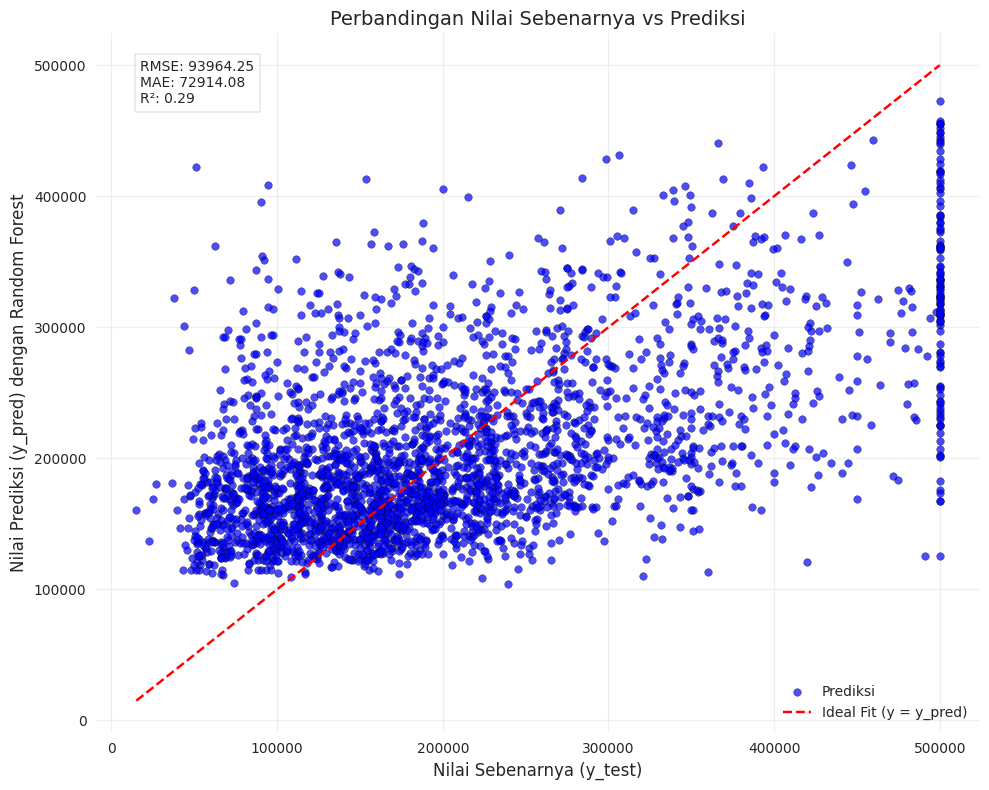

Metrik Evaluasi pada Data Test:
RMSE: 93964.25
MAE: 72914.08
R²: 0.29


In [ ]:
# Import library yang diperlukan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Bagian ini diasumsikan sudah dijalankan sebelumnya (dari gambar 1 dan 2)
# Sehingga kita memiliki model, X_test, y_test, dan preprocessor yang sudah dilatih

# Buat pipeline untuk prediksi
pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', models["LightGBM"])])

# Latih pipeline dengan data training
pipeline.fit(X_train, y_train)

# Prediksi nilai pada data test
y_test_pred = pipeline.predict(X_test)

# Hitung metrik evaluasi
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mae = mean_absolute_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Visualisasi hasil prediksi vs nilai sebenarnya
plt.figure(figsize=(10, 8))

# Scatter plot
plt.scatter(y_test, y_test_pred, color='blue', alpha=0.7, edgecolors='k', s=30, label='Prediksi')

# Garis ideal (y = y_pred)
min_val = min(y_test.min(), y_test_pred.min())
max_val = max(y_test.max(), y_test_pred.max())
plt.plot([min_val, max_val], [min_val, max_val], '--r', label='Ideal Fit (y = y_pred)')

# Tambahkan label, judul, dan legenda
plt.xlabel('Nilai Sebenarnya (y_test)', fontsize=12)
plt.ylabel('Nilai Prediksi (y_pred) dengan Random Forest', fontsize=12)
plt.title('Perbandingan Nilai Sebenarnya vs Prediksi', fontsize=14)
plt.legend(fontsize=10)

# Tambahkan metrik evaluasi ke plot
plt.text(
    0.05, 0.9,
    f"RMSE: {test_rmse:.2f}\nMAE: {test_mae:.2f}\nR²: {test_r2:.2f}",
    fontsize=10,
    transform=plt.gca().transAxes,
    bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray')
)

# Tambahkan grid untuk mempermudah pembacaan
plt.grid(alpha=0.3)

# Tampilkan plot
plt.tight_layout()
plt.show()

# Opsional: Tampilkan hasil metrik evaluasi
print(f"Metrik Evaluasi pada Data Test:")
print(f"RMSE: {test_rmse:.2f}")
print(f"MAE: {test_mae:.2f}")
print(f"R²: {test_r2:.2f}")

## 6. GridSearchCV

In [ ]:
# Custom scorer definitions
def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Custom scorers for GridSearchCV
mse_scorer = make_scorer(mse, greater_is_better=False)
mae_scorer = make_scorer(mae, greater_is_better=False)
rmse_scorer = make_scorer(rmse, greater_is_better=False)
r2_scorer = make_scorer(r2_score, greater_is_better=True)

# Scoring dictionary with only positive metrics
scoring = {
    "mse": mse_scorer,
    "mae": mae_scorer,
    "rmse": rmse_scorer,
    "r2": r2_scorer
}

# Define the parameter grid for Random Forest
param_grid = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [None, 10, 20],
    'model__max_features': ['auto', 'sqrt'],
    'model__min_samples_split': [2, 5],
    'model__min_samples_leaf': [1, 2],
    'model__bootstrap': [True, False]
}

# Create the Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Pipeline (pastikan preprocessor sudah didefinisikan)
pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', rf_model)])

# Randomized Search
random_search = RandomizedSearchCV(
    pipeline,
    param_distributions=param_grid,  # tetap pakai param_grid sebagai dictionary
    n_iter=50,                        # jumlah kombinasi acak yang dicoba
    scoring=scoring,
    refit="rmse",
    cv=5,
    verbose=1,
    n_jobs=-1,
    random_state=42,
    return_train_score=True,
)

# Fit model
random_search.fit(X_train, y_train)

# Extract and format the results
cv_results = pd.DataFrame(random_search.cv_results_).sort_values("mean_test_rmse", ascending=True)
print("Best Parameters:", random_search.best_params_)

# Extract best result
best_index = random_search.best_index_

# Summary table
best_results = pd.DataFrame({
    "CV MAE": [-cv_results.loc[best_index, "mean_test_mae"]],
    "CV MSE": [-cv_results.loc[best_index, "mean_test_mse"]],
    "CV RMSE": [-cv_results.loc[best_index, "mean_test_rmse"]],
    "CV R²": [cv_results.loc[best_index, "mean_test_r2"]],
})

print("\nSummary of Best Results:")
print(best_results)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
120 fits failed out of a total of 250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
120 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py", line 662, in fit
    self._final_estimator.fit(Xt, y, *

Best Parameters: {'model__n_estimators': 100, 'model__min_samples_split': 2, 'model__min_samples_leaf': 1, 'model__max_features': 'sqrt', 'model__max_depth': 10, 'model__bootstrap': True}

Summary of Best Results:
         CV MAE        CV MSE       CV RMSE     CV R²
0  74904.577052  9.214428e+09  95980.862191  0.318665


## 7. RandomizedSearchCV

In [ ]:
# Custom scorer definitions
def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Custom scorers for GridSearchCV
mse_scorer = make_scorer(mse, greater_is_better=False)
mae_scorer = make_scorer(mae, greater_is_better=False)
rmse_scorer = make_scorer(rmse, greater_is_better=False)
r2_scorer = make_scorer(r2_score, greater_is_better=True)

# Scoring dictionary with only positive metrics
scoring = {
    "mse": mse_scorer,
    "mae": mae_scorer,
    "rmse": rmse_scorer,
    "r2": r2_scorer
}

# Define the parameter grid for Random Forest
param_grid = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [None, 10, 20],
    'model__max_features': ['auto', 'sqrt'],
    'model__min_samples_split': [2, 5],
    'model__min_samples_leaf': [1, 2],
    'model__bootstrap': [True, False]
}

# Create the Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Pipeline (pastikan preprocessor sudah didefinisikan)
pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', rf_model)])

# Grid Search
grid_search = GridSearchCV(
    pipeline,
    param_grid,
    scoring=scoring,
    refit="rmse",
    cv=5,
    verbose=1,
    n_jobs=-1,
    return_train_score=True,
)

# Fit the model
grid_search.fit(X_train, y_train)

# Extract and format the results
cv_results = pd.DataFrame(grid_search.cv_results_).sort_values("mean_test_rmse", ascending=True)
print("Best Parameters:", grid_search.best_params_)

# Extract best result
best_index = grid_search.best_index_

# Summary table
best_results = pd.DataFrame({
    "CV MAE": [-cv_results.loc[best_index, "mean_test_mae"]],
    "CV MSE": [-cv_results.loc[best_index, "mean_test_mse"]],
    "CV RMSE": [-cv_results.loc[best_index, "mean_test_rmse"]],
    "CV R²": [cv_results.loc[best_index, "mean_test_r2"]],
})

print("\nSummary of Best Results:")
print(best_results)


Fitting 5 folds for each of 144 candidates, totalling 720 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
360 fits failed out of a total of 720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
194 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py", line 662, in fit
    self._final_estimator.fit(Xt, y, *

Best Parameters: {'model__bootstrap': True, 'model__max_depth': 10, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 1, 'model__min_samples_split': 2, 'model__n_estimators': 200}

Summary of Best Results:
         CV MAE        CV MSE       CV RMSE     CV R²
0  74864.963056  9.204803e+09  95931.408703  0.319335


## FEATURE IMPORTANCE

In [ ]:
rf = RandomForestRegressor(random_state=42)
rf.fit(X, y)

RandomForestRegressor(random_state=42)

Mean Decrease in Impurity (MDI)

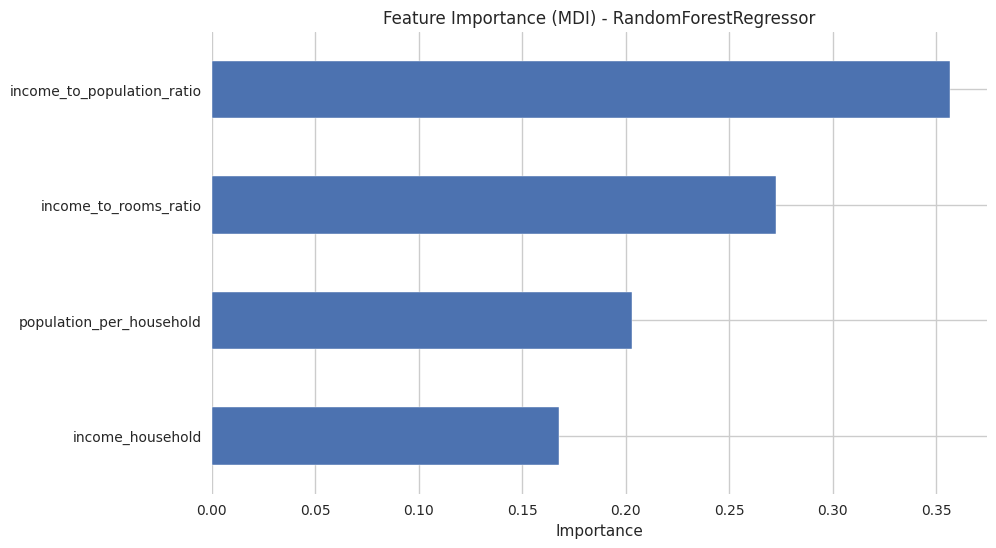

In [ ]:
# 1. Feature Importance Biasa (MDI)
importances = rf.feature_importances_
feature_names = X.columns
forest_importances = pd.Series(importances, index=feature_names)
forest_importances.sort_values(ascending=True).plot(kind='barh', figsize=(10,6))
plt.title("Feature Importance (MDI) - RandomForestRegressor")
plt.xlabel("Importance")
plt.show()

**🔹 1. MDI (Mean Decrease in Impurity)**
- Apa itu: Mengukur berapa banyak suatu fitur mengurangi impurity (seperti MSE dalam regresi) saat digunakan untuk split di dalam pohon.

- Sumber: Didapat langsung dari .feature_importances_ milik model Random Forest.

**Kelebihan:**

- Cepat (langsung tersedia setelah model dilatih).

- Mudah digunakan dan populer.

**Kekurangan:**

- Bias terhadap fitur dengan banyak level/unique value (fitur numerik atau kategorik dengan banyak kategori bisa tampak lebih penting dari sebenarnya).

- Tidak mempertimbangkan interaksi antar fitur.

Permutation Importance

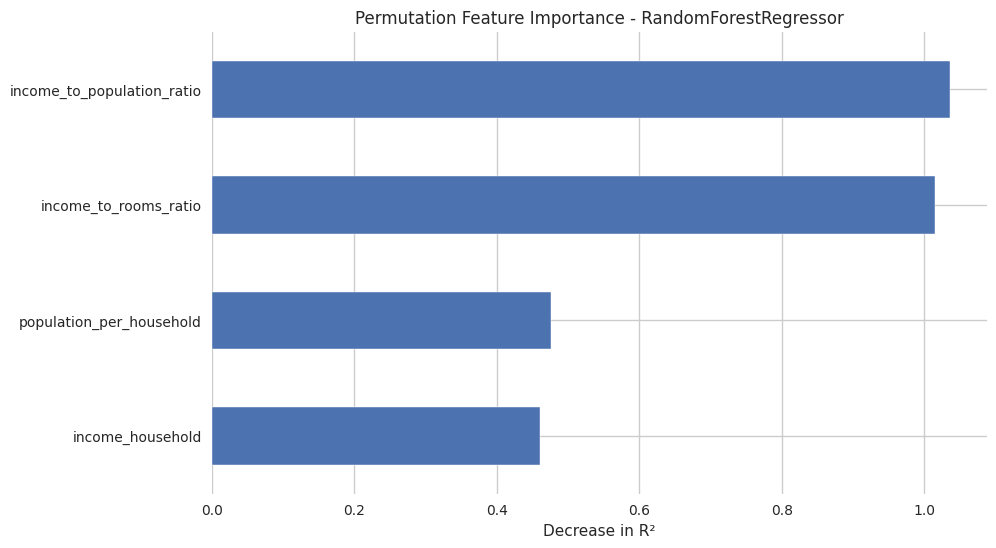

In [ ]:
from sklearn.inspection import permutation_importance

# 2. Permutation Importance (lebih akurat secara umum)
result = permutation_importance(rf, X, y, n_repeats=10, random_state=42)
perm_importances = pd.Series(result.importances_mean, index=X.columns)
perm_importances.sort_values(ascending=True).plot(kind='barh', figsize=(10,6))
plt.title("Permutation Feature Importance - RandomForestRegressor")
plt.xlabel("Decrease in R²")
plt.show()

**🔹 2. Permutation Importance**
- Apa itu: Mengukur penurunan performa model (misalnya skor R²) setelah acak urutan satu fitur, sehingga mengganggu hubungannya dengan target.

- Sumber: Menggunakan sklearn.inspection.permutation_importance.

**Kelebihan:**

- Lebih akurat dan adil (tidak bias terhadap fitur dengan banyak kategori).

- Mempertimbangkan dampak nyata fitur terhadap prediksi akhir.

**Kekurangan:**

- Lebih lambat karena perlu mengulang prediksi berkali-kali (default n_repeats=5 atau lebih).

- Butuh data validasi (biasanya X_test, y_test).

1. Perubahan Tipe Data dan Presisi

  - CSV menyimpan semua data sebagai string yang kemudian dikonversi kembali saat impor
  - Angka floating point dapat kehilangan digit presisi signifikan selama proses konversi
  - Contoh: Nilai 0.12345678901234 mungkin menjadi 0.123457 setelah ekspor-impor
  - Presisi yang berkurang ini dapat berdampak signifikan pada fitur-fitur numerik yang sensitif


2. Masalah Encoding Data Kategorikal

  - Kategori dengan urutan ordinal bisa kehilangan informasi urutan
  - Label encoding atau one-hot encoding tidak dipertahankan secara otomatis dalam CSV
  - Transformasi yang melibatkan nilai kategorikal mungkin direpresentasikan berbeda setelah impor


3. Perbedaan Lingkungan Komputasi

  - Versi library yang berbeda antara lingkungan lokal dan Google Colab
  - Implementasi algoritma Random Forest bisa berbeda antar versi scikit-learn
  - Perbedaan konfigurasi sistem operasi dan arsitektur hardware
  - Pipeline preprocessing yang tidak direplikasi dengan tepat


4. Kehilangan Metadata

  - Informasi seperti binning category, scaling factors, dan parameter transformasi lain tidak tersimpan dalam CSV
  - Struktur indeks DataFrame yang mungkin berperan dalam urutan training data
  - Missing value handling yang berbeda setelah ekspor-impor


5. Perubahan Seed Random dan Inisialisasi Model

  - Perbedaan random seed antar eksekusi dapat memengaruhi hasil Random Forest
  - Urutan data yang berbeda bisa menghasilkan pembagian tree yang berbeda
  - Konteks random number generator yang tidak konsisten antar lingkungan

# I. Conclusions and Recommendations

## 1. Conclusions

**"Estimasi Harga Rumah dengan Regresi dan Teknik Machine Learning"**

Kesimpulan ini diperoleh dari hasil model yang dijalankan pada eksperimen pertama, di mana dataset telah melalui proses preprocessing standar. Selain itu, berbagai eksperimen tambahan juga dilakukan untuk memastikan bahwa algoritma LightGBM memberikan performa optimal dalam kasus ini. Pengujian tersebut mencakup evaluasi terhadap kemungkinan terjadinya data leakage, kemampuan model dalam menangani hubungan non-linear antar variabel, serta validitas nilai MAE dan R²—apakah hanya berlaku pada dataset ini atau dapat digeneralisasi. Berdasarkan hasil evaluasi, algoritma machine learning LightGBM menunjukkan kinerja stabil dan dapat diandalkan pada eksperimen pertama.

Model LightGBM menunjukkan efektivitas yang baik dalam prediksi harga perumahan California, dengan performa yang konsisten dibandingkan model-model lain seperti Linear Regression, Decision Tree, XGBoost, dan Random Forest. Model ini mencapai metrik evaluasi yang menunjukkan keseimbangan antara akurasi dan generalisasi, dengan MAE sebesar $32.646, RMSE sebesar $48.850, dan R² sebesar 82,3% pada data latih. Pada data uji, model tetap konsisten dengan MAE sebesar $32.514, RMSE $47.866, dan R² sebesar 82%. Performa yang relatif setara antara data train dan test menunjukkan kemampuan generalisasi yang baik dan tidak mengalami overfitting.

Keunggulan LightGBM dalam kasus ini berasal dari beberapa karakteristik fundamental:

1. Gradient-based One-Side Sampling (GOSS) – Teknik ini memungkinkan model untuk fokus pada sampel data dengan error besar, sehingga efisiensi proses pembelajaran meningkat tanpa kehilangan informasi penting.

2. Exclusive Feature Bundling (EFB) – Metode ini menggabungkan fitur-fitur yang saling eksklusif untuk mengurangi dimensi data secara efisien, mempercepat pelatihan model.

3. Reduksi Overfitting – Struktur boosting dengan regularisasi serta strategi leaf-wise growth membantu mengurangi risiko overfitting dibandingkan metode boosting tradisional.

4. Kemampuan Adaptasi – LightGBM mampu beradaptasi dengan pola-pola kompleks pada data perumahan, memberikan prediksi yang akurat bahkan dalam kondisi fitur yang sangat beragam.

## 2. Recommendations

Rekomendasi untuk Pengembangan Lebih Lanjut

1. Ekspansi Data dan Fitur

  - Integrasi Data Temporal: Menganalisis tren harga perumahan dari waktu ke waktu untuk memahami dinamika pasar
  - Peningkatan Granularitas Geografis: Menambahkan data tingkat lingkungan atau blok
  = Penambahan Fitur Eksternal:

    - Data ekonomi makro (tingkat pengangguran, suku bunga)
    - Data infrastruktur (jarak ke sarana publik, kualitas sekolah)
    - Data demografi lanjutan (tingkat kejahatan, kualitas udara)
    - Data zoning dan regulasi bangunan



2. Penyempurnaan Model

  - Hyperparameter Tuning Lanjutan: Optimasi sistematis parameter Random Forest (n_estimators, max_depth, min_samples_split)
  - Ensemble Hybrid: Menggabungkan Random Forest dengan model lain seperti LightGBM untuk meningkatkan performa
  - Segmentasi Model: Mengembangkan model terpisah untuk segmen pasar berbeda (properti mewah, kelas menengah, terjangkau)
  - Deep Learning: Mengeksplorasi penggunaan neural networks untuk ekstraksi fitur otomatis

3. Interpretabilitas dan Eksplanasi

  - Analisis Feature Importance Mendalam: Menggunakan metode SHAP (SHapley Additive exPlanations) untuk memahami kontribusi setiap fitur
  - Visualisasi Spasial: Memetakan variasi prediksi berdasarkan lokasi geografis
  - Analisis Sensitivitas: Memahami bagaimana perubahan dalam fitur spesifik memengaruhi prediksi harga
  - Model Interpretable: Mengembangkan model yang lebih sederhana dan mudah dijelaskan untuk kebutuhan komunikasi dengan stakeholder

4. Implementasi Praktis

  - Validasi Dunia Nyata: Pengujian dengan data listing perumahan terkini
  - Pengembangan API: Membuat API prediksi yang dapat diintegrasikan dengan sistem real estate
  - Dashboard Interaktif: Membangun visualisasi interaktif untuk pemangku kepentingan
  - Alat Penilaian Mobile: Mengembangkan aplikasi untuk penilaian properti di lapangan

5. Penelitian Lanjutan

  - Transfer Learning: Menerapkan model California ke pasar perumahan lain
  - Analisis Segmentasi Pasar: Mengidentifikasi sub-pasar dengan dinamika harga berbeda
  - Integrasi Data Alternatif: Menggabungkan data citra satelit atau fotografi udara untuk analisis visual
  - Prediksi Deret Waktu: Mengembangkan model untuk memperkirakan tren harga future

Implementasi rekomendasi-rekomendasi ini akan membantu meningkatkan pemahaman tentang dinamika pasar perumahan California dan mengembangkan alat prediksi yang lebih canggih untuk berbagai pemangku kepentingan di industri real estate.